# **Análisis de características influyentes en los precios de alojamientos de Airbnb en la ciudad de Washington D.C usando modelos de regresión.** <br>

Este trabajo se enfocará en hacer un análisis de las características que influyen en el precio de los alojamientos de Airbnb en la ciudad de Washington D.C en Estados Unidos usando modelos de regresión en Python.

El desarrollo estará conformado de la siguiente forma:
- Carga de librerías
- Carga de datos
- Preprocesado y limpieza de los datos 
- Transformación de los datos
- Estudio de correlación
- Revisión de outliers
- Análisis de los datos
- Selección de características 
- Modelos de regresión    
- Análisis de los resultados de los modelos de regresión

# **Carga de librerias**

In [1]:
# https://pysal.org/libpysal/tutorial.html
#import libpysal as lps

# libreria matemática
import math

# Importar Módulos a utilizar
import io
import gzip

# Librerías para gráficar
import seaborn as sns
import matplotlib.pyplot as plt
import contextily as ctx

# Librerías para obtener datos
from urllib.request import Request, urlopen

# Librerías para manejo de datos
import pandas as pd
import numpy as np
from kmodes.kmodes import KModes

# Librerías para normalización de datos
from sklearn.preprocessing import MinMaxScaler

# Librerías para datos espaciales
import geopandas as gpd
from pyproj import Geod
from shapely.geometry import Point, LineString
from shapely.ops import nearest_points
import shapely.wkt
import shapely.geometry

# Librerías para mapas interactivos, Mediante Folium podemos manipular los datos en Python y visualizar los resultados en Leaflet.
import folium
from folium.plugins import FastMarkerCluster
import geopandas as gpd
from branca.colormap import LinearColormap

# Librerías para regresión cuantílica
import statsmodels.api as sm
import statsmodels.formula.api as smf
from statsmodels.regression.quantile_regression import QuantReg

# Configuración para mostrar la salida sin que se recorten los datos
pd.options.display.max_rows = 5000
pd.options.display.max_columns = 5000
pd.options.display.width = 4000
pd.options.display.max_colwidth = 2000
#pd.set_option('display.max_colwidth', 2000)

# Configuración para no mostrar warnings
import warnings
warnings.filterwarnings("ignore")

# Configuración para gráficas
plt.rcParams.update({'font.size': 10})
plt.rcParams['figure.figsize'] = [8, 8]

# semilla
np.random.seed(12345)

# **Carga de datos**

Obtener datos de los diferentes alojamientos que posee Airbnb en la ciudad de Washington D.C, en este caso los datos provienen de la página Inside Airbnb. <br>
http://insideairbnb.com/washington-dc

In [2]:
# obtenemos los datos desde la fuente
url_inside_airbnb = "http://data.insideairbnb.com/united-states/dc/washington-dc/2022-09-14/data/listings.csv.gz"
req = Request(url_inside_airbnb)
req.add_header('Accept-Encoding', 'gzip')
response = urlopen(req)

# los datos vienen en formato gzip, por lo tanto hay que descomprimir el archivo y cargar los datos a un dataframe de pandas
content = gzip.decompress(response.read())
alojamientos = pd.read_csv(io.StringIO(content.decode('utf-8')))

# creamos una estructura de geopandas para datos espaciales, con una columna geometry que contiene las coordenadas 
# coordinate reference system (CRS)
alojamientos_gdf = gpd.GeoDataFrame(alojamientos, geometry=gpd.points_from_xy(alojamientos.longitude, alojamientos.latitude), crs='EPSG:4326')

In [3]:
alojamientos_gdf.shape

(6473, 76)

Se obtienen los datos geográficos de los barrios de la ciudad de Washington DC. <br>
http://insideairbnb.com/get-the-data/

In [4]:
# obtenemos los datos desde la fuente
url_vecindarios_airbnb = "http://data.insideairbnb.com/united-states/dc/washington-dc/2022-09-14/visualisations/neighbourhoods.geojson"
vecindarios_airbnb = gpd.read_file(url_vecindarios_airbnb)

In [5]:
vecindarios_airbnb.shape

(39, 3)

WARDS <br>
https://opendata.dc.gov/datasets/DCGIS::wards-from-2022/about

In [6]:
# obtenemos los datos desde la fuente
url_wards = "https://opendata.arcgis.com/api/v3/datasets/c5cd8b40fb784548a6680aead5f919ed_53/downloads/data?format=geojson&spatialRefId=4326&where=1%3D1"
wards = gpd.read_file(url_wards)



Se obtienen los datos de incidentes de crimenes en el 2020 en la ciudad de Washington DC. <br>
https://opendata.dc.gov/datasets/crime-incidents-in-2020/explore?location=38.913236%2C-77.030441%2C16.00

In [7]:
# obtenemos los datos desde la fuente
url_crime_incidents = "https://opendata.arcgis.com/api/v3/datasets/f516e0dd7b614b088ad781b0c4002331_2/downloads/data?format=geojson&spatialRefId=4326&where=1%3D1"
crime_incidents = gpd.read_file(url_crime_incidents)

In [8]:
crime_incidents.shape

(27912, 24)

Se obtienen los principales puntos de interés de la ciudad de Washington DC. <br>
https://opendata.dc.gov/datasets/points-of-interest/explore?location=38.890773%2C-77.033733%2C13.83 <br>

Aqui se encuentra información de sitios históricos, nombres de edificaciones, estationes de metro, circulos de tráfico, edificios federales, sitios culturales y embajadas.

In [9]:
# obtenemos los datos desde la fuente
url_point_of_interest = "https://opendata.arcgis.com/api/v3/datasets/f323f677b3f34fe08956b8fcce3ace44_3/downloads/data?format=geojson&spatialRefId=4326&where=1%3D1"
point_of_interest = gpd.read_file(url_point_of_interest)

In [10]:
point_of_interest.shape

(14693, 55)

De los puntos de interés se trabajará puntualmente con algunos de los más conocidos como:
- La casa blanca
- Monumento a Lincoln
- Monumento a Washington
- Museo Nacional del Aire y el Espacio de Estados Unidos
- Zoologico Nacional

<br>
Estos sitios tendrán su propia columna en el dataset.

In [11]:
CASA_BLANCA = point_of_interest[ point_of_interest["ALIASNAME"] == "WHITE HOUSE" ]
LINCOLN_MEMORIAL = point_of_interest[ point_of_interest["ALIASNAME"] == "LINCOLN MEMORIAL" ]
WASHINGTON_MONUMENT = point_of_interest[ point_of_interest["ALIASNAME"] == "WASHINGTON MONUMENT" ]
NATIONAL_AIR_AND_SPACE_MUSEUM = point_of_interest[ point_of_interest["ALIASNAME"] == "NATIONAL AIR AND SPACE MUSEUM" ]
NATIONAL_ZOOLOGICAL_PARK = point_of_interest[ point_of_interest["ALIASNAME"] == "NATIONAL ZOO ADMINISTRATION" ]

Se obtienen datos geográficos de los sitios para recreación.
<br>
https://opendata.dc.gov/datasets/DCGIS::recreation-facilities-1/explore

In [12]:
# obtenemos los datos desde la fuente
url_recreation_facilities = "https://opendata.arcgis.com/api/v3/datasets/7122c1c815314588abe5c1864da8a355_3/downloads/data?format=geojson&spatialRefId=4326&where=1%3D1"
recreation_facilities = gpd.read_file(url_recreation_facilities)

In [13]:
recreation_facilities.shape

(139, 22)

Se obtienen datos geográficos de localización de bancos. <br>
https://opendata.dc.gov/maps/bank-locations

In [14]:
# obtenemos los datos desde la fuente
url_bank_location = "https://opendata.arcgis.com/api/v3/datasets/dfc51a5bd29347d0a2399743d3144d31_0/downloads/data?format=geojson&spatialRefId=4326&where=1%3D1"
bank_location = gpd.read_file(url_bank_location)

In [15]:
bank_location.shape

(210, 17)

Se obtienen datos geográficos de paradas de bus del metro.
<br>
https://opendata.dc.gov/datasets/metro-bus-stops-2/explore?location=38.892509%2C-77.020630%2C12.69

In [16]:
# obtenemos los datos desde la fuente
url_metro_bus_stop = "https://opendata.arcgis.com/api/v3/datasets/a29b9dbb2f00459db2b0c3c56faca297_53/downloads/data?format=geojson&spatialRefId=4326&where=1%3D1"
metro_bus_stop = gpd.read_file(url_metro_bus_stop)

In [17]:
metro_bus_stop.shape

(10363, 76)

# **Limpieza y transformación de datos**

Revisión del dataset

In [18]:
alojamientos_gdf.head(4)

,id,listing_url,scrape_id,last_scraped,source,name,description,neighborhood_overview,picture_url,host_id,host_url,host_name,host_since,host_location,host_about,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_thumbnail_url,host_picture_url,host_neighbourhood,host_listings_count,host_total_listings_count,host_verifications,host_has_profile_pic,host_identity_verified,neighbourhood,neighbourhood_cleansed,neighbourhood_group_cleansed,latitude,longitude,property_type,room_type,accommodates,bathrooms,bathrooms_text,bedrooms,beds,amenities,price,minimum_nights,maximum_nights,minimum_minimum_nights,maximum_minimum_nights,minimum_maximum_nights,maximum_maximum_nights,minimum_nights_avg_ntm,maximum_nights_avg_ntm,calendar_updated,has_availability,availability_30,availability_60,availability_90,availability_365,calendar_last_scraped,number_of_reviews,number_of_reviews_ltm,number_of_reviews_l30d,first_review,last_review,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,license,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month,geometry
0,3686,https://www.airbnb.com/rooms/3686,20220914194735,2022-09-14,city scrape,Vita's Hideaway,"IMPORTANT NOTES<br />* Carefully read and be sure that you understand the cancellation policy outlined for this listing. Call airbnb for clarification BEFORE you make a reservation. You can lose money for alterations to and cancellation of a reservation. I WILL NOT refund money beyond what the cancellation policy says is due to the guest.<br /><br />* Carefully read my profile, description and reviews. The reviews by numerous outsiders are honest perspectives about us as hosts and the neighborhood.<br /><br /><b>The space</b><br />IMPORTANT NOTES<br /><br />* Airbnb keeps accurate track of our dates of availability so please use the airbnb site to see if the dates that you are interested in are available. <br /><br />* You'll have access to even more specific details once your reservation is confirmed because you will then have access to our house manual. <br /><br />* From our reviews and recommendations, which we strongly suggest you read to get an outsider's perspective, it is","We love that our neighborhood is up and coming. New restaurants, art galleries, a playhouse, and renovated homes are popping up right before our eyes.",https://a0.muscache.com/pictures/61e02c7e-3d66-466a-b740-8f3e29494f88.jpg,4645,https://www.airbnb.com/users/show/4645,Vita,2008-11-26,"Washington, DC","I am a literary scholar, teacher, poet, vegan chef, and, most important, mother of two beautiful, athletic, and artistic children, who is looking to host good-hearted, adventurous, and open-minded people visiting our nation's capital! Although I have lived in the D.C. metropolitan area for over 15 years, I hail from Memphis, Tennessee and am very much a southerner who believes in making people feel comfortable and at home. I take pride in having hosted travelers from Boston, Iowa, California, South Carolina, Australia, the UK, Germany, India, Thailand, South Korea, China, Taiwan, and even more far away places. I value and am fascinated by the personal and cultural uniqueness of each of my guests. Because I am a foodie who loves exploring cultures through food, the question I most want to ask each of them is what is your favorite food and why? Whether they stay 2 nights or 30 nights, the vast majority of our guests have left feeling a deeper connection to the city and to us as a result of their stay with us.",within a day,100%,100%,f,https://a0.muscache.com/im/users/4645/profile_pic/1353648671/original.jpg?aki_policy=profile_small,https://a0.muscache.com/im/users/4645/profile_pic/1353648671/original.jpg?aki_policy=profile_x_medium,Anacostia,1.0,4.0,"

Forma de los datos

In [19]:
alojamientos_gdf.shape

(6473, 76)

Revisión de duplicados en todos los datasets

In [20]:
print(alojamientos_gdf.duplicated().sum())
print(vecindarios_airbnb.duplicated().sum())
print(recreation_facilities.duplicated().sum())
print(bank_location.duplicated().sum())
print(point_of_interest.duplicated().sum())
print(metro_bus_stop.duplicated().sum())
print(crime_incidents.duplicated().sum())

0
0
0
0
0
0
0


Revisión de nulos o vacios en el dataset de los alojamientos

In [21]:
# Porcentaje de nulos por cada columna
for column in alojamientos_gdf.columns:
    percentage = alojamientos_gdf[column].isnull().mean()
    if percentage > 0:
        print(f'{column}: {round(percentage*100, 2)}%')

description: 1.0%
neighborhood_overview: 31.53%
host_name: 2.49%
host_since: 2.49%
host_location: 15.5%
host_about: 37.14%
host_response_time: 23.0%
host_response_rate: 23.0%
host_acceptance_rate: 15.87%
host_is_superhost: 0.08%
host_thumbnail_url: 2.49%
host_picture_url: 2.49%
host_neighbourhood: 10.51%
host_listings_count: 2.49%
host_total_listings_count: 2.49%
host_has_profile_pic: 2.49%
host_identity_verified: 2.49%
neighbourhood: 31.53%
neighbourhood_group_cleansed: 100.0%
bathrooms: 100.0%
bathrooms_text: 0.11%
bedrooms: 9.78%
beds: 2.27%
minimum_minimum_nights: 0.02%
maximum_minimum_nights: 0.02%
minimum_maximum_nights: 0.02%
maximum_maximum_nights: 0.02%
minimum_nights_avg_ntm: 0.02%
maximum_nights_avg_ntm: 0.02%
calendar_updated: 100.0%
first_review: 18.2%
last_review: 18.2%
review_scores_rating: 18.2%
review_scores_accuracy: 18.57%
review_scores_cleanliness: 18.57%
review_scores_checkin: 18.57%
review_scores_communication: 18.57%
review_scores_location: 18.57%
review_scores_v

Borrado de características que no son relevantes para el analisis, en todos los datasets.

In [22]:
alojamientos_gdf.drop([
            'listing_url', 'picture_url', 'name', 'host_url',
            'description', 
            'neighbourhood',             
            'scrape_id', 'last_scraped', 'source', 
            'host_total_listings_count',
            'host_listings_count', 
            'neighbourhood_group_cleansed', 'bathrooms', 
            'minimum_minimum_nights', 'maximum_minimum_nights', 
            'minimum_maximum_nights', 'maximum_maximum_nights', 'minimum_nights_avg_ntm','maximum_nights_avg_ntm',
            'calendar_updated','calendar_last_scraped',
            'license',            
            'last_review',
            'first_review',
            'host_since'
], axis=1, inplace=True)

recreation_facilities.drop(["CREATED","EDITED", "GLOBALID", 'USE_TYPE', 'WARD_ID', 'SCHOOL_SITE', 'POOL', 'POOL_NAME', 'WEB_URL', 'PHONE', 'STATUS', 'XCOORD', 'YCOORD', 'FITNESS_CENTER', 'MAR_ID', 'GIS_ID', 'OBJECTID', 'CREATOR', 'EDITOR'], axis = 1, inplace = True)
bank_location.drop(['ZIPCODE', 'WARD', 'LATITUDE', 'LONGITUDE', 'OBJECTID', 'XCOORD', 'YCOORD', 'MAR_ID', 'GIS_ID', 'SE_ANNO_CAD_DATA', 'CREATOR', 'CREATED', 'EDITOR', 'EDITED'], axis = 1, inplace = True)
point_of_interest.drop(['OBJECTID', 'ADDRALIAS_ID', 'ADDRESS_ID', 'STATUS', 'ADDRNUM', 'ADDRNUMSUFFIX', 'STNAME', 'METADATA_ID', 'SITE_ADDRESS_PK', 'ROADWAYSEGID', 'SSL', 'TYPE_', 'ENTRANCETYPE', 'STREET_TYPE', 'QUADRANT', 'CITY', 'STATE', 'SQUARE', 'SUFFIX', 'LOT', 'NATIONALGRID', 'ZIPCODE4', 'XCOORD', 'YCOORD', 'STATUS_ID', 'ASSESSMENT_NBHD', 'ASSESSMENT_SUBNBHD', 'CFSA_NAME', 'HOTSPOT', 'CLUSTER_', 'POLDIST', 'ROC', 'PSA', 'SMD', 'CENSUS_TRACT', 'VOTE_PRCNCT', 'WARD', 'ZIPCODE', 'ANC', 'NEWCOMMSELECT06', 'NEWCOMMCANDIDATE', 'FOCUS_IMPROVEMENT_AREA', 'SE_ANNO_CAD_DATA', 'WARD_2002', 'WARD_2012', 'ANC_2002', 'ANC_2012', 'SMD_2002', 'SMD_2012', 'ANC_2023', 'SMD_2023'], axis = 1, inplace = True)
metro_bus_stop.drop(['EGIS_ID', 'REG_ID', 'BSTP_GEO_ID', 'BSTP_OPS_TCD', 'BSTP_EFF_DATE', 'BSTP_TCD', 'BSTP_HDG', 'BSTP_POS_TCD', 'BSTP_LDC', 'BSTP_MSG_TEXT', 'BSTP_LON', 'BSTP_LAT', 'BSTP_LAT_LON_TCD', 'BSTP_INV_SYR_TCD', 'BSTP_INV_SRV_DATE', 'BSTP_BNH_CNT', 'BSTP_BST_TCD', 'BSTP_IFC_OWN', 'BSTP_HAS_BKRS', 'BSTP_HAS_PRS', 'BSTP_HAS_PVM', 'BSTP_HAS_PRM', 'BSTP_PDP_SIZE_TCD', 'BSTP_PDP_MTR_TCD', 'BSTP_PDP_OBS_TCD', 'BSTP_PDP_HAS_CCN', 'BSTP_HAS_BDR_PDP', 'BSTP_BDR_PDP_OBS', 'BSTP_SWK_WDT', 'BSTP_SWK_HAS_CCN', 'BSTP_SWK_HAS_PPC', 'BSTP_SWK_SLP_WVL', 'BSTP_SWK_OBS_TCD', 'BSTP_SWK_IPD_TCD', 'ONS_CRP_SLP', 'ONS_CRP', 'OFS_CRP', 'AT_STR_ABS_CRP', 'AT_STR_OSS_CRP', 'ONS_CWK', 'OFS_CWK', 'AT_STR_ABS_CWK', 'AT_STR_OSS_CWK', 'ON_STR_STS_OR_TFL', 'ON_STR_PDC_SGL', 'AT_STR_PDC_SGL', 'BSTP_PRK_RST_TCD', 'BSTP_NPK_ZNE_LTH', 'CNF_NPK_SNS', 'STR_LGT_WTN_30_FT', 'BSTP_HAS_LED_DSP', 'BSTP_ACC_RATING', 'BSTP_BRDG_STP', 'BSTP_HAS_LUM_SIGN', 'BSTP_HAS_PWR_SRC', 'METRO_ACCS_STP', 'WARD_ID', 'ANC_ID', 'SMD_ID', 'ROUTEID', 'MEASURE', 'OFFSET', 'BLOCKKEY', 'BLOCKFACEKEY', 'GIS_ID', 'SE_ANNO_CAD_DATA', 'GLOBALID', 'CREATOR', 'CREATED', 'EDITOR', 'EDITED', 'OBJECTID', 'SNOWPRIORITY'], axis = 1, inplace = True)
crime_incidents.drop(['CCN', 'REPORT_DAT', 'BLOCK', 'XBLOCK', 'YBLOCK', 'WARD', 'ANC', 'DISTRICT', 'PSA', 'NEIGHBORHOOD_CLUSTER', 'BLOCK_GROUP', 'CENSUS_TRACT', 'VOTING_PRECINCT', 'LATITUDE', 'LONGITUDE', 'BID', 'START_DATE', 'END_DATE', 'OBJECTID', 'OCTO_RECORD_ID'], axis = 1, inplace = True)

**Transformación de datos**

Hay nulos, asi que se hará limpieza de los datos:

Convertir el tipo de datos de la característica precio de texto a número flotante, además se eliminará el caracter $ del precio.

In [23]:
# Eliminamos el caracter $ del precio
alojamientos_gdf['price'] = alojamientos_gdf['price'].str.replace('$','').str.replace(',','')

# Convertimos a entero
alojamientos_gdf['price'] = alojamientos_gdf['price'].astype(float) #.astype(int)

# Eliminar registros donde el precio sea 0
alojamientos_gdf.drop(alojamientos_gdf[alojamientos_gdf['price'] == 0].index, inplace = True)

# Rellenar con el promedio
alojamientos_gdf["price"].fillna(alojamientos_gdf["price"].mean(), inplace = True)

# Rellenamos los 0 con el promedio
#alojamientos_gdf["price"] = np.where(alojamientos_gdf['price'] <= 0, alojamientos_gdf["price"].mean(), alojamientos_gdf['price'])

# mostramos solo 1 decimal
alojamientos_gdf["price"] = round(alojamientos_gdf.price, 2)

# Se creará una nueva columna con el precio a logaritmo para suavizar los datos y hacer una distribución normal.
alojamientos_gdf.loc[:,"log_price"] = np.log(alojamientos_gdf.loc[:,"price"])

Rellenar con el promedio los missing values de las columnas de review scores 

In [24]:
# Reemplazamos los 0 con ffill
# The ffill() method replaces the NULL values with the value from the previous row (or previous column, if the axis parameter is set to 'columns').
#alojamientos_gdf['review_scores_rating'].replace(to_replace = 0,  method='ffill', inplace=True)

# Rellenamos los 0 con Nulos para poder rellenarlos con el promedio
alojamientos_gdf['review_scores_rating'].replace(0, np.nan, inplace=True)

# Lista de características a rellenar con el promedio
review_scores_columns = ['reviews_per_month', 'review_scores_rating', 'review_scores_accuracy', 'review_scores_cleanliness','review_scores_checkin', 'review_scores_communication', 'review_scores_location','review_scores_value']

# Recorrer cada columna para ir aplicando el relleno de los valores vacíos
for column in review_scores_columns:
    alojamientos_gdf[column].fillna(alojamientos_gdf[column].mean(), inplace = True)

- Se considerará que un host no tiene imagen de perfil si el campo host_has_profile_pic está nulo
- Se considerará que un host no tiene la identidad verificada si el campo host_identity_verified está nulo
- Se considerará que un host no es superhost si el campo host_is_superhost está nulo

In [25]:
alojamientos_gdf.fillna({'host_has_profile_pic':0}, inplace=True)
alojamientos_gdf.fillna({'host_identity_verified':0}, inplace=True)
alojamientos_gdf.fillna({'host_is_superhost':0}, inplace=True)
#alojamientos_gdf.fillna({'bathrooms_text':'0 Baths'}, inplace=True)
#alojamientos_gdf.fillna({'bedrooms':0}, inplace=True)
#alojamientos_gdf.fillna({'beds':0}, inplace=True)
#alojamientos_gdf.dropna(subset=['bedrooms', 'beds'])

Rellenamos las camas y habitaciones con el promedio

In [26]:
# Lista de características a rellenar con el promedio
review_scores_columns = ['bedrooms', 'beds']

# Recorrer cada columna para ir aplicando el relleno de los valores vacíos
for column in review_scores_columns:
    alojamientos_gdf[column].fillna(alojamientos_gdf[column].mean(), inplace = True)
    #alojamientos_gdf[column] = round(alojamientos_gdf[column], 0)
    alojamientos_gdf[column] = alojamientos_gdf[column].astype(int)

In [27]:
print(alojamientos_gdf['bedrooms'].value_counts())
print(alojamientos_gdf['beds'].value_counts())

1     4363
2     1291
3      505
4      216
5       60
6       25
7        6
9        2
8        1
15       1
Name: bedrooms, dtype: int64
1     3142
2     1875
3      771
4      330
5      158
6      112
7       30
8       27
9        8
10       8
12       5
11       2
20       1
16       1
Name: beds, dtype: int64


Convertir los indices de respuesta y aceptacion del host a número y rellenar los vacios con 0.

In [28]:
alojamientos_gdf["host_response_rate"] = alojamientos_gdf["host_response_rate"].str[:-1].astype("float") / 100
alojamientos_gdf["host_acceptance_rate"] = alojamientos_gdf["host_acceptance_rate"].str[:-1].astype("float") / 100

# rellenamos los vacios con 0
alojamientos_gdf.fillna({'host_response_rate':0}, inplace=True)
alojamientos_gdf.fillna({'host_acceptance_rate':0}, inplace=True)

Convertir el campo número de baños a número, para ello se dividirá en una columna separada. Se creará una nueva columna llamada bathrooms_quantity la cual el número de baños.

In [29]:
alojamientos_gdf.bathrooms_text

0       1 private bath
1       2 shared baths
2       1 private bath
3            1.5 baths
4       1 private bath
             ...      
6468            1 bath
6469            1 bath
6470         4.5 baths
6471            1 bath
6472            1 bath
Name: bathrooms_text, Length: 6470, dtype: object

In [30]:
#alojamientos_gdf["bathrooms_quantity"] = alojamientos_gdf["bathrooms_text"].str.split(" ", expand=True)[0]

alojamientos_gdf['bathrooms_quantity'] = alojamientos_gdf['bathrooms_text']
#alojamientos_gdf.loc[alojamientos_gdf.loc[:, 'bathrooms_quantity'] == 'Half-bath', 'bathrooms_quantity'] = 0.5
#alojamientos_gdf.loc[alojamientos_gdf.loc[:, 'bathrooms_quantity'] == 'Shared half-bath', 'bathrooms_quantity'] = 0.5
#alojamientos_gdf.loc[alojamientos_gdf.loc[:, 'bathrooms_quantity'] == 'Private half-bath', 'bathrooms_quantity'] = 0.5

alojamientos_gdf['bathrooms_quantity'] = alojamientos_gdf['bathrooms_quantity'].str.replace('Half-bath', '0.5', regex=False)
alojamientos_gdf['bathrooms_quantity'] = alojamientos_gdf['bathrooms_quantity'].str.replace('Shared half-bath', '0.5', regex=False)
alojamientos_gdf['bathrooms_quantity'] = alojamientos_gdf['bathrooms_quantity'].str.replace('Private half-bath', '0.5', regex=False)

alojamientos_gdf['bathrooms_quantity'] = alojamientos_gdf['bathrooms_quantity'].str.replace('bath', '', regex=False)
alojamientos_gdf['bathrooms_quantity'] = alojamientos_gdf['bathrooms_quantity'].str.replace('baths', '', regex=False)
alojamientos_gdf['bathrooms_quantity'] = alojamientos_gdf['bathrooms_quantity'].str.replace('private', '', regex=False)
alojamientos_gdf['bathrooms_quantity'] = alojamientos_gdf['bathrooms_quantity'].str.replace('shared', '', regex=False)
alojamientos_gdf['bathrooms_quantity'] = alojamientos_gdf['bathrooms_quantity'].str.replace('s', '', regex=False)

# convertimos a entero
alojamientos_gdf['bathrooms_quantity'] = alojamientos_gdf['bathrooms_quantity'].astype(float)

# Rellenamos los vacios con el promedio
alojamientos_gdf["bathrooms_quantity"].fillna(alojamientos_gdf["bathrooms_quantity"].mean(), inplace = True)

# Rellenamos los 0 con el promedio
alojamientos_gdf["bathrooms_quantity"] = np.where(alojamientos_gdf['bathrooms_quantity'] <= 0, alojamientos_gdf["bathrooms_quantity"].mean(), alojamientos_gdf['bathrooms_quantity'])

# mostramos solo 1 decimal
alojamientos_gdf["bathrooms_quantity"] = round(alojamientos_gdf.bathrooms_quantity, 1)

# Rellenamos los 0 con el promedio
# alojamientos_gdf["bathrooms_quantity"] = np.where(alojamientos_gdf['bathrooms_quantity'] <= 0, alojamientos_gdf["bathrooms_quantity"].mean(), alojamientos_gdf['bathrooms_quantity'])

# borramos la columna original
alojamientos_gdf.drop(['bathrooms_text'], axis=1, inplace=True)

#alojamientos_gdf["bathroom_quantity"] = alojamientos_gdf["bathrooms_text"].str.split(" ", expand=True)[0]
#alojamientos_gdf["bathroom_type"] = alojamientos_gdf["bathrooms_text"].str.split(" ", expand=True)[1]

In [31]:
alojamientos_gdf['bathrooms_quantity'].value_counts()

1.0     4545
2.0      761
1.5      431
2.5      347
3.5      143
3.0      129
4.0       38
4.5       34
1.4       12
5.0       10
6.0        7
5.5        6
0.5        3
8.0        1
7.0        1
15.0       1
7.5        1
Name: bathrooms_quantity, dtype: int64

Convertir variables categóricas a numéricas, para ello se rellenará con 1 o 0 aquellas características que contengan texto, asumiendo que la información que contenga el texto no influye en nada, pero si influye en el usuario que quiere alquilar el alojamiento si se proporciona esa información o no. <br>

- neighborhood_overview
- host_name
- host_location
- host_about
- host_picture_url
- host_thumbnail_url
- host_neighbourhood

In [32]:
alojamientos_gdf['neighborhood_overview'] = alojamientos_gdf['neighborhood_overview'].apply(lambda x: 1 if not pd.isnull(x) else 0)
alojamientos_gdf['host_name'] = alojamientos_gdf['host_name'].apply(lambda x: 1 if not pd.isnull(x) else 0)
alojamientos_gdf['host_location'] = alojamientos_gdf['host_location'].apply(lambda x: 1 if not pd.isnull(x) else 0)
alojamientos_gdf['host_about'] = alojamientos_gdf['host_about'].apply(lambda x: 1 if not pd.isnull(x) else 0)
alojamientos_gdf['host_picture_url'] = alojamientos_gdf['host_picture_url'].apply(lambda x: 1 if not pd.isnull(x) else 0)
alojamientos_gdf['host_thumbnail_url'] = alojamientos_gdf['host_thumbnail_url'].apply(lambda x: 1 if not pd.isnull(x) else 0)
alojamientos_gdf['host_neighbourhood'] = alojamientos_gdf['host_neighbourhood'].apply(lambda x: 1 if not pd.isnull(x) else 0)

Convertir property type de categorica a numerica y crear nuevas columnas por cada categoría, primero se revisarán cuantas categorías hay.

In [33]:
alojamientos_gdf.groupby(['room_type']).size().reset_index(name='counts').sort_values(by = 'counts', ascending=False) 

,room_type,counts
0,Entire home/apt,4915
2,Private room,1425
3,Shared room,110
1,Hotel room,20


Hay cuatro categorias asi que se crearán cuatro columnas nuevas, las cuales tendrán 1 o 0, que significará si aplica o no, dependiendo del alojamiento.

In [34]:
alojamientos_gdf['shared_room'] = np.where(alojamientos_gdf['room_type'] == 'Shared room', 1, 0)
alojamientos_gdf['private_room'] = np.where(alojamientos_gdf['room_type'] == 'Private room', 1, 0)
alojamientos_gdf['hotel_room'] = np.where(alojamientos_gdf['room_type'] == 'Hotel room', 1, 0)
alojamientos_gdf['entire_home_apt'] = np.where(alojamientos_gdf['room_type'] == 'Entire home/apt', 1, 0)

Convertir host verifications a lista y hacer un conteo de cuantas verificaciones tiene.

In [35]:
# Convertimos la columna host_verifications en una lista para poder calcular el tamaño
alojamientos_gdf['host_verifications'] = alojamientos_gdf.host_verifications.apply(lambda x: x[1:-1].replace('"','').replace('[','').replace(']','').replace(' ','').split(","))

# calculamos el número de verificaciones que tiene cada host
alojamientos_gdf['host_verifications'] = alojamientos_gdf.host_verifications.agg([len])

Máximo número de personas permitidas en el alojamiento

In [36]:
# Rellenamos los 0 con el promedio
alojamientos_gdf["accommodates"] = np.where(alojamientos_gdf['accommodates'] <= 0, alojamientos_gdf["accommodates"].mean(), alojamientos_gdf['accommodates'])

# mostramos solo 1 decimal
alojamientos_gdf["accommodates"] = round(alojamientos_gdf.accommodates, 1)

El campo amenities, el cual son aquellas comodidades que el huesped tiene adicionalmente en el alojamiento como: toallas, papel higienico, jabon, etc., es de tipo texto, en este caso se eligirán aquellas amenidades más representativas y se crearán nuevas columnas. Para ello primero hay que convertir el campo de tipo texto a una lista para poder hacer una observación de todas las categorías y elegir.

In [37]:
# Convertimos la columna amenities en una lista para poder calcular el tamaño
alojamientos_gdf['amenities'] = alojamientos_gdf.amenities.apply(lambda x: x[1:-1].replace('"','').replace('[','').replace(']','').replace(' ','').split(","))

Ahora se mostrarán las amenidades y sus conteos para poder decidir cuales son las más representativas.

In [38]:
# Contamos las amenities para ver cuales son las más representativas
alojamientos_gdf.explode('amenities')['amenities'].value_counts().head()

Smokealarm              6263
Longtermstaysallowed    6014
Wifi                    5895
Essentials              5844
Kitchen                 5747
Name: amenities, dtype: int64

Ahora se crearán las nuevas columnas en el dataframe.

In [39]:
# Creamos nuevos campos con las amenidades más representativas 
alojamientos_gdf['has_Breakfast'] = alojamientos_gdf.apply(lambda x: 1 if 'Breakfast' in x['amenities'] else 0, axis=1)
alojamientos_gdf['has_Washer'] = alojamientos_gdf.apply(lambda x: 1 if 'Washer' in x['amenities'] else 0, axis=1)
alojamientos_gdf['has_Dishwasher'] = alojamientos_gdf.apply(lambda x: 1 if 'Dishwasher' in x['amenities'] else 0, axis=1)
alojamientos_gdf['has_Dryer'] = alojamientos_gdf.apply(lambda x: 1 if 'Dryer' in x['amenities'] else 0, axis=1)
alojamientos_gdf['has_TV'] = alojamientos_gdf.apply(lambda x: 1 if 'TV' in x['amenities'] else 0, axis=1)
alojamientos_gdf['has_Freezer'] = alojamientos_gdf.apply(lambda x: 1 if 'Freezer' in x['amenities'] else 0, axis=1)
alojamientos_gdf['has_Airconditioning'] = alojamientos_gdf.apply(lambda x: 1 if 'Airconditioning' in x['amenities'] else 0, axis=1)
alojamientos_gdf['has_Heating'] = alojamientos_gdf.apply(lambda x: 1 if 'Heating' in x['amenities'] else 0, axis=1)
alojamientos_gdf['has_Hotwater'] = alojamientos_gdf.apply(lambda x: 1 if 'Hotwater' in x['amenities'] else 0, axis=1)
alojamientos_gdf['has_Cleaningproducts'] = alojamientos_gdf.apply(lambda x: 1 if 'Cleaningproducts' in x['amenities'] else 0, axis=1)
alojamientos_gdf['has_Wifi'] = alojamientos_gdf.apply(lambda x: 1 if 'Wifi' in x['amenities'] else 0, axis=1)
alojamientos_gdf['has_Hairdryer'] = alojamientos_gdf.apply(lambda x: 1 if 'Hairdryer' in x['amenities'] else 0, axis=1)
alojamientos_gdf['has_Kitchen'] = alojamientos_gdf.apply(lambda x: 1 if 'Kitchen' in x['amenities'] else 0, axis=1)
alojamientos_gdf['has_Dedicatedworkspace'] = alojamientos_gdf.apply(lambda x: 1 if 'Dedicatedworkspace' in x['amenities'] else 0, axis=1)
alojamientos_gdf['has_Petsallowed'] = alojamientos_gdf.apply(lambda x: 1 if 'Petsallowed' in x['amenities'] else 0, axis=1)
alojamientos_gdf['has_Pool'] = alojamientos_gdf.apply(lambda x: 1 if 'Pool' in x['amenities'] else 0, axis=1)
alojamientos_gdf['has_Freestreetparking'] = alojamientos_gdf.apply(lambda x: 1 if 'Freestreetparking' in x['amenities'] else 0, axis=1)
alojamientos_gdf['has_Freeparkingonpremises'] = alojamientos_gdf.apply(lambda x: 1 if 'Freeparkingonpremises' in x['amenities'] else 0, axis=1)
alojamientos_gdf['has_Smokealarm'] = alojamientos_gdf.apply(lambda x: 1 if 'Smokealarm' in x['amenities'] else 0, axis=1)
alojamientos_gdf['has_Securitycamerasonproperty'] = alojamientos_gdf.apply(lambda x: 1 if 'Securitycamerasonproperty' in x['amenities'] else 0, axis=1)
alojamientos_gdf['has_Gym'] = alojamientos_gdf.apply(lambda x: 1 if 'Gym' in x['amenities'] else 0, axis=1)
#alojamientos_gdf['has_Suitableforevents'] = alojamientos_gdf.apply(lambda x: 1 if 'Suitableforevents' in x['amenities'] else 0, axis=1)

In [40]:
variables_amenidades = ['has_Breakfast', 'has_Washer', 'has_Dishwasher', 'has_Dryer', 'has_TV', 'has_Freezer', 
'has_Airconditioning', 'has_Heating', 'has_Hotwater', 'has_Cleaningproducts', 'has_Wifi', 
'has_Hairdryer', 'has_Kitchen', 'has_Dedicatedworkspace', 'has_Petsallowed', 'has_Pool', 
'has_Freestreetparking', 'has_Freeparkingonpremises', 'has_Smokealarm', 'has_Securitycamerasonproperty'
,'has_Gym'
]

for amenidad in variables_amenidades:
    print(alojamientos_gdf.groupby([amenidad], as_index=False)['id'].count())

   has_Breakfast    id
0              0  6051
1              1   419
   has_Washer    id
0           0  3003
1           1  3467
   has_Dishwasher    id
0               0  3245
1               1  3225
   has_Dryer    id
0          0  3257
1          1  3213
   has_TV    id
0       0  3325
1       1  3145
   has_Freezer    id
0            0  4562
1            1  1908
   has_Airconditioning    id
0                    0  1884
1                    1  4586
   has_Heating    id
0            0  1401
1            1  5069
   has_Hotwater    id
0             0  1566
1             1  4904
   has_Cleaningproducts    id
0                     0  4635
1                     1  1835
   has_Wifi    id
0         0   575
1         1  5895
   has_Hairdryer    id
0              0  1399
1              1  5071
   has_Kitchen    id
0            0   723
1            1  5747
   has_Dedicatedworkspace    id
0                       0  3387
1                       1  3083
   has_Petsallowed    id
0                0

Conversión de variables categoricas a numéricas, se trasnformarán aquellas columnas binarias donde los valores sean t y f : <br>
- host_is_superhost
- has_availability
- host_has_profile_pic
- host_identity_verified
- instant_bookable

In [41]:
# Obtener las columnas que son binarias, aquellas que contienen valores "t" o "f"
columnas_binarias = alojamientos_gdf.columns[alojamientos_gdf.isin(['t', 'f']).any()].tolist()

# Convertir columnas binarias a 1, 0
alojamientos_gdf[columnas_binarias] = alojamientos_gdf[columnas_binarias].replace(to_replace=['t', 'f'], value=[1, 0])

# Rellenar los missing values con 0
alojamientos_gdf[columnas_binarias] = alojamientos_gdf[columnas_binarias].fillna(0)

# Convertir las columnas a entero
alojamientos_gdf[columnas_binarias] = alojamientos_gdf[columnas_binarias].astype(int)

Convertir tiempo de respuesta del host de categórico a numérico

In [42]:
alojamientos_gdf.loc[alojamientos_gdf.loc[:, 'host_response_time'] == 'within an hour', 'host_response_time_hour'] = 1
alojamientos_gdf.loc[alojamientos_gdf.loc[:, 'host_response_time'] == 'within a few hours', 'host_response_time_hour'] = 3
alojamientos_gdf.loc[alojamientos_gdf.loc[:, 'host_response_time'] == 'within a day', 'host_response_time_hour'] = 24
alojamientos_gdf.loc[alojamientos_gdf.loc[:, 'host_response_time'] == 'a few days or more', 'host_response_time_hour'] = 48

# Rellenar con el promedio
alojamientos_gdf.fillna({'host_response_time_hour': alojamientos_gdf.host_response_time_hour.mean()}, inplace=True)

# convertimos a entero
alojamientos_gdf['host_response_time_hour'] = alojamientos_gdf['host_response_time_hour'].astype(int)

# borramos la columna original
alojamientos_gdf.drop(['host_response_time'], axis=1, inplace=True)

Hacer cluster de los tipos de propiedades.

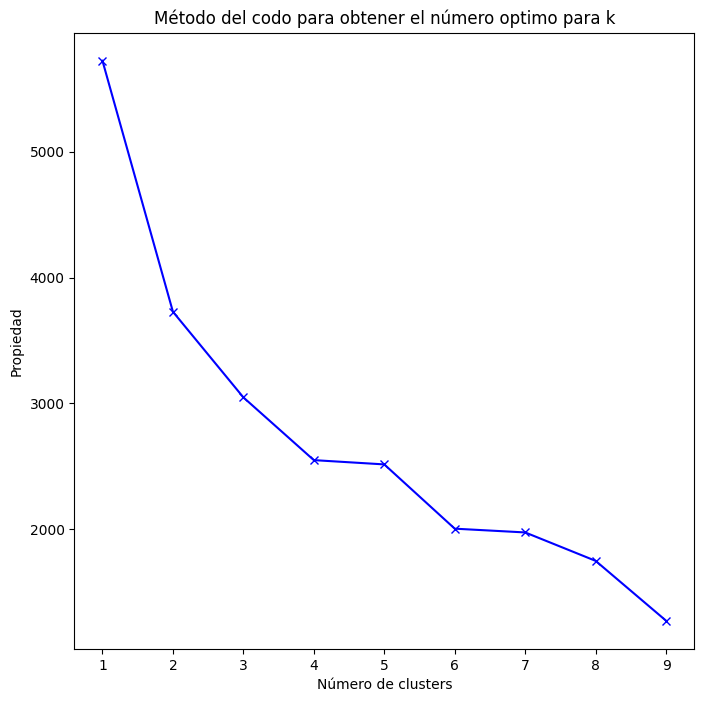

In [43]:
#temp = alojamientos_gdf[['property_type','room_type']]
temp = alojamientos_gdf[['property_type','room_type']]

# Elbow curve to find optimal K
cluster = []
#cluster2 = []
K = range(1,10)
for num_clusters in list(K):
    kmode = KModes(n_clusters=num_clusters, init = "random", n_init = 10, verbose=0, random_state = 0)
    #kmode2 = KModes(n_clusters=num_clusters, init = "Huang o Cao", n_init = 10, verbose=0, random_state = 0)
    #KModes(n_clusters=num_clusters, init = "random", n_init = 5, verbose=0)
    kmode.fit_predict(temp)
    #kmode2.fit_predict(temp)
    cluster.append(kmode.cost_)
    #cluster2.append(kmode2.cost_)
    
plt.plot(K, cluster, 'bx-')
#plt.plot(K, cluster2, 'bx-')
plt.xlabel('Número de clusters')
plt.ylabel('Propiedad')
plt.title('Método del codo para obtener el número optimo para k')
plt.show()

In [44]:
alojamientos_gdf.groupby(['property_type'], as_index=False)['id'].count()

,property_type,id
0,Boat,1
1,Camper/RV,2
2,Campsite,1
3,Casa particular,3
4,Entire bungalow,10
5,Entire condo,545
6,Entire cottage,1
7,Entire guest suite,473
8,Entire guesthouse,68
9,Entire home,681


In [45]:
# Building the model with 3 clusters
kmode = KModes(n_clusters=2, init = "random", n_init = 10, verbose=0, random_state = 0)
clusters = kmode.fit_predict(temp)
#print(kmode.cluster_centroids_)
#print(kmode.labels)
#alojamientos_gdf.insert(0, "property_type_kmode", clusters, True)
alojamientos_gdf['property_type_cluster'] = clusters #kmode.fit_predict(temp)

In [46]:
alojamientos_gdf.groupby(['property_type_cluster'], as_index=False)['id'].count().sort_values(by = 'property_type_cluster', ascending=False)

,property_type_cluster,id
1,1,1425
0,0,5045


In [47]:
alojamientos_gdf.groupby(['property_type','property_type_cluster'], as_index=False)['id'].count().sort_values(by = 'property_type_cluster', ascending=False)


,property_type,property_type_cluster,id
26,Private room in home,1,571
37,Room in boutique hotel,1,111
30,Private room in resort,1,1
29,Private room in rental unit,1,232
28,Private room in loft,1,6
27,Private room in hostel,1,4
33,Private room in villa,1,3
25,Private room in guesthouse,1,9
24,Private room in guest suite,1,35
23,Private room in condo,1,72


Dataset final

In [48]:
print(f'Observaciones: {alojamientos_gdf.shape[0]}, Características: {alojamientos_gdf.shape[1]}')

Observaciones: 6470, Características: 78


In [49]:
alojamientos_gdf.head(4)

,id,neighborhood_overview,host_id,host_name,host_location,host_about,host_response_rate,host_acceptance_rate,host_is_superhost,host_thumbnail_url,host_picture_url,host_neighbourhood,host_verifications,host_has_profile_pic,host_identity_verified,neighbourhood_cleansed,latitude,longitude,property_type,room_type,accommodates,bedrooms,beds,amenities,price,minimum_nights,maximum_nights,has_availability,availability_30,availability_60,availability_90,availability_365,number_of_reviews,number_of_reviews_ltm,number_of_reviews_l30d,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month,geometry,log_price,bathrooms_quantity,shared_room,private_room,hotel_room,entire_home_apt,has_Breakfast,has_Washer,has_Dishwasher,has_Dryer,has_TV,has_Freezer,has_Airconditioning,has_Heating,has_Hotwater,has_Cleaningproducts,has_Wifi,has_Hairdryer,has_Kitchen,has_Dedicatedworkspace,has_Petsallowed,has_Pool,has_Freestreetparking,has_Freeparkingonpremises,has_Smokealarm,has_Securitycamerasonproperty,has_Gym,host_response_time_hour,property_type_cluster
0,3686,1,4645,1,1,1,1.00,1.00,0,1,1,1,3,1,1,Historic Anacostia,38.86339,-76.98889,Private room in home,Private room,1.0,1,1,"[Dryer, Smokealarm, Cookingbasics, Indoorfireplace, Backyard, Bedlinens, Microwave, Oven, Patioorbalcony, Coffeemaker, Freestreetparking, Hangers, Heating, Shampoo, Kitchen, Dishesandsilverware, Stove, Refrigerator, Extrapillowsandblankets, Wifi, Dishwasher, Longtermstaysallowed, Hotwater, Essentials, Washer, Firstaidkit, Carbonmonoxidealarm]",67.0,31,365,1,0,1,31,306,81,5,0,4.63,4.72,4.43,4.90,4.83,3.86,4.62,0,1,0,1,0,0.56,POINT (-76.98889 38.86339),4.204693,1.0,0,1,0,0,0,1,1,1,0,0,0,1,1,0,1,0,1,0,0,0,1,0,1,0,0,24,1
1,841260,1,315148,1,1,1,0.81,0.48,0,1,1,1,2,1,1,"Brightwood Park, Crestwood, Petworth",38.93719,-77.02335,Private room in rental unit,Private room,1.0,1,1,"[Smokealarm, Cookingbasics, Bedlinens, Microwave, Oven, Hangers, Heating, Dedicatedworkspace, Kitchen, Stove, Dishesandsilverware, Hostgreetsyou, Refrigerator, Iron, Paidparkingoffpremises, Centralairconditioning, Wifi, Fireextinguisher, Longtermstaysallowed, Hotwater, Essentials, Lockonbedroomdoor, Carbonmonoxidealarm]",39.0,31,360,1,0,0,0,46,14,0,0,4.43,4.36,3.93,4.86,4.86,4.57,4.29,0,46,0,46,0,0.12,POINT (-77.02335 38.93719),3.663562,2.0,0,1,0,0,0,0,0,0,0,0,0,1,1,0,1,0,1,1,0,0,0,0,1,0,0,3,1
2,3943,1,5059,1,1,1,1.00,0.76,1,1,1,1,2,1,1,"Edgewood, Bloomingdale, Truxton Circle, Eckington",38.91195,-77.00456,Private room in townhouse,Private room,3.0,1,2,"[Dryer, Smokealarm, Singlelevelhome, Cookingbasics, Backyard, Paidparkinggarageoffpremises, Paidparkinggarageonpremises\u20131space, Clothingstorage:dresserandwardrobe, Bedlinens, Microwave, Room-darkeningshades, Hairdryer, Oven, Diningtable, Keypad, Luggagedropoffallowed, Freezer, Coffeemaker, Freestreetparking, Hangers, Heating, Dedicatedworkspace, WindowACunit, Freewasher\u2013Inunit, Shampoo, Kitchen, Sharedpatioorbalcony, Dishesandsilverware, Refrigerator, Extrapillowsandblankets, Iron, Bodysoap, Centralairconditioning, Mosquitonet, Minifridge, Wifi, Fireextinguisher, Dishwasher, Gasstove, Longtermstaysallowed, Securitycamerasonproperty, Cleaningproducts, Hotwater, Essentials, Lockonbedroomdoor, Portablefans, Firstaidkit, Wineglasses, Carbonmonoxidealarm]",75.0,1,1125,1,3,10,23,298,443,9,0,4.82,4.88,4.91,4.94,4.90,4.55,4.74,0,4,0,4,0,2.73,POINT (-77.00456 38.91195),4.317488,1.0,0,1,0,0,0,0,1,1,0,1,0,1,1,1,1,1,1,1,0,0,1,0,1,1,0,1,1
3,842418,1,2236092,1,1,1,0.80,0.93,1,1,1,1,2,1,1,"Downtown, Chinatown, Penn Quarters, Mount Vernon Square, North Capitol Street",38.89898,-77.01629,Entire condo,Entire home/apt,2.0,1,1,"[Dryer, TVwithstandardcable, Cookingbasics, Bedlinen

Se hace un conteo de alojamientos por barrios, se calcula el precio y la calificación general promedio por barrio para añadirlos en el dataset de barrios.

In [50]:
# host_is_superhost
# host_identity_verified
# availability_365
# review_scores_rating	review_scores_accuracy	review_scores_cleanliness	review_scores_checkin	review_scores_communication	review_scores_location	review_scores_value

datos_tmp = alojamientos_gdf[["neighbourhood_cleansed","price"]].copy()
datos_tmp = datos_tmp.groupby(['neighbourhood_cleansed'], as_index=False)['price'].mean()
datos_tmp.rename(columns={'neighbourhood_cleansed': 'neighbourhood', 'price': 'price_mean'}, inplace=True)

datos_tmp2 = alojamientos_gdf[["neighbourhood_cleansed","review_scores_rating"]].copy()
datos_tmp2 = datos_tmp2.groupby(['neighbourhood_cleansed'], as_index=False)['review_scores_rating'].mean()
datos_tmp2.rename(columns={'neighbourhood_cleansed': 'neighbourhood', 'review_scores_rating': 'review_scores_rating_mean'}, inplace=True)

datos_tmp4 = alojamientos_gdf[["neighbourhood_cleansed","id"]].copy()
datos_tmp4 = datos_tmp4.groupby(['neighbourhood_cleansed'], as_index=False)['id'].count()
datos_tmp4.rename(columns={'neighbourhood_cleansed': 'neighbourhood', 'id': 'conteo_alojamientos'}, inplace=True)

datos_tmp5 = alojamientos_gdf[["neighbourhood_cleansed","minimum_nights"]].copy()
datos_tmp5 = datos_tmp5.groupby(['neighbourhood_cleansed'], as_index=False)['minimum_nights'].mean()
datos_tmp5.rename(columns={'neighbourhood_cleansed': 'neighbourhood', 'minimum_nights': 'minimum_nights_mean'}, inplace=True)

datos_tmp6 = alojamientos_gdf[["neighbourhood_cleansed","availability_365"]].copy()
datos_tmp6 = datos_tmp6.groupby(['neighbourhood_cleansed'], as_index=False)['availability_365'].mean()
datos_tmp6.rename(columns={'neighbourhood_cleansed': 'neighbourhood', 'availability_365': 'availability_365_mean'}, inplace=True)

datos_tmp3 = pd.merge(datos_tmp, datos_tmp2, on='neighbourhood', how='left')

vecindarios_airbnb = pd.merge(vecindarios_airbnb, datos_tmp3, on='neighbourhood', how='left')
vecindarios_airbnb = pd.merge(vecindarios_airbnb, datos_tmp4, on='neighbourhood', how='left')
vecindarios_airbnb = pd.merge(vecindarios_airbnb, datos_tmp5, on='neighbourhood', how='left')
vecindarios_airbnb = pd.merge(vecindarios_airbnb, datos_tmp6, on='neighbourhood', how='left')
vecindarios_airbnb.drop("neighbourhood_group", axis = 1, inplace = True)

# Redondeo a dos dígitos y se crean las nuevas columnas
vecindarios_airbnb["price_mean"] = round(vecindarios_airbnb.price_mean, 2)
vecindarios_airbnb["review_scores_rating_mean"] = round(vecindarios_airbnb.review_scores_rating_mean, 2)
vecindarios_airbnb["minimum_nights_mean"] = round(vecindarios_airbnb.minimum_nights_mean, 2)
vecindarios_airbnb["availability_365_mean"] = round(vecindarios_airbnb.availability_365_mean, 2)
vecindarios_airbnb["conteo_alojamientos"] = round(vecindarios_airbnb.conteo_alojamientos, 2)

Cálculo de la distancia mínima entre el alojamiento y los distintos puntos de interés.

In [51]:
# Función que calcula la distancia
def min_distance(point, lines):
    return lines.distance(point).min()

# Convertir a CRS de tipo 2272 para poder obtener las distancias en pies
alojamientos_gdf = alojamientos_gdf.to_crs('EPSG:2272')
bank_location = bank_location.to_crs('EPSG:2272')
recreation_facilities = recreation_facilities.to_crs('EPSG:2272')
metro_bus_stop = metro_bus_stop.to_crs('EPSG:2272')
point_of_interest = point_of_interest.to_crs('EPSG:2272')
CASA_BLANCA = CASA_BLANCA.to_crs('EPSG:2272')
LINCOLN_MEMORIAL = LINCOLN_MEMORIAL.to_crs('EPSG:2272')
NATIONAL_AIR_AND_SPACE_MUSEUM = NATIONAL_AIR_AND_SPACE_MUSEUM.to_crs('EPSG:2272')
WASHINGTON_MONUMENT = WASHINGTON_MONUMENT.to_crs('EPSG:2272')
NATIONAL_ZOOLOGICAL_PARK = NATIONAL_ZOOLOGICAL_PARK.to_crs('EPSG:2272')
crime_incidents = crime_incidents.to_crs('EPSG:2272')

# Creación de nuevas columnas en el dataset con las distancias en pies.
alojamientos_gdf['min_dist_to_bank_ft'] = alojamientos_gdf.geometry.apply(min_distance, args=(bank_location,))
alojamientos_gdf['min_dist_to_recreation_ft'] = alojamientos_gdf.geometry.apply(min_distance, args=(recreation_facilities,))
alojamientos_gdf['min_dist_to_metro_bus_stop_ft'] = alojamientos_gdf.geometry.apply(min_distance, args=(metro_bus_stop,))
alojamientos_gdf['min_dist_to_points_interest_ft'] = alojamientos_gdf.geometry.apply(min_distance, args=(point_of_interest,))
alojamientos_gdf['min_dist_to_white_house_ft'] = alojamientos_gdf.geometry.apply(min_distance, args=(CASA_BLANCA,))
alojamientos_gdf['min_dist_to_lincoln_memorial_ft'] = alojamientos_gdf.geometry.apply(min_distance, args=(LINCOLN_MEMORIAL,))
alojamientos_gdf['min_dist_to_national_space_museum_ft'] = alojamientos_gdf.geometry.apply(min_distance, args=(NATIONAL_AIR_AND_SPACE_MUSEUM,))
alojamientos_gdf['min_dist_to_washington_memorial_ft'] = alojamientos_gdf.geometry.apply(min_distance, args=(WASHINGTON_MONUMENT,))
alojamientos_gdf['min_dist_to_national_zoo_ft'] = alojamientos_gdf.geometry.apply(min_distance, args=(NATIONAL_ZOOLOGICAL_PARK,))
alojamientos_gdf['min_dist_to_crime_incident_ft'] = alojamientos_gdf.geometry.apply(min_distance, args=(crime_incidents,))

# **Dataset Final**

In [52]:
alojamientos_gdf.describe()

,id,neighborhood_overview,host_id,host_name,host_location,host_about,host_response_rate,host_acceptance_rate,host_is_superhost,host_thumbnail_url,host_picture_url,host_neighbourhood,host_verifications,host_has_profile_pic,host_identity_verified,latitude,longitude,accommodates,bedrooms,beds,price,minimum_nights,maximum_nights,has_availability,availability_30,availability_60,availability_90,availability_365,number_of_reviews,number_of_reviews_ltm,number_of_reviews_l30d,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month,log_price,bathrooms_quantity,shared_room,private_room,hotel_room,entire_home_apt,has_Breakfast,has_Washer,has_Dishwasher,has_Dryer,has_TV,has_Freezer,has_Airconditioning,has_Heating,has_Hotwater,has_Cleaningproducts,has_Wifi,has_Hairdryer,has_Kitchen,has_Dedicatedworkspace,has_Petsallowed,has_Pool,has_Freestreetparking,has_Freeparkingonpremises,has_Smokealarm,has_Securitycamerasonproperty,has_Gym,host_response_time_hour,property_type_cluster,min_dist_to_bank_ft,min_dist_to_recreation_ft,min_dist_to_metro_bus_stop_ft,min_dist_to_points_interest_ft,min_dist_to_white_house_ft,min_dist_to_lincoln_memorial_ft,min_dist_to_national_space_museum_ft,min_dist_to_washington_memorial_ft,min_dist_to_national_zoo_ft,min_dist_to_crime_incident_ft
count,6.470000e+03,6470.000000,6.470000e+03,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6.470000e+03,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000
mean,1.000300e+17,0.685008,1.107225e+08,0.975116,0.845131,0.628594,0.742536,0.745906,0.304791,0.975116,0.975116,0.894900,2.117311,0.969088,0.824884,38.912001,-77.017199,3.659815,1.523493,1.960278,179.202009,21.409583,2.203769e+03,0.930603,8.587944,21.953323,38.652396,175.436167,49.630603,13.953478,1.022257,4.744529,4.805537,4.758478,4.861066,4.844605,4.788156,4.704296,0.409583,23.577125,21.006028,2.209737,0.253168,1.820300,4.890789,1.383972,0.017002,0.220247,0.003091,0.759660,0.064760,0.535858,0.498454,0.496600,0.486090,0.294900,0.708810,0.783462,0.757960,0.283617,0.911128,0.783771,0.888253,0.476507,0.001391,0.051777,0.436167,0.329057,0.968006,0.290881,0.129366,3.558269,0.220247,2237.188806,1967.884193,434.585111,541.979664,14114.563116,17188.282926,14798.973365,15435.324709,15799.359074,497.237882
std,2.316636e+17,0.464549,1.301262e+08,0.155784,0.361807,0.483218,0.418752,0.378428,0.460355,0.155784,0.155784,0.306707,0.528074,0.173092,0.380096,0.029096,0.034854,2.346814,0.935047,1.375806,271.894825,40.722161,1.243147e+05,0.254148,10.226961,21.378878,32.868356,134.241025,83.457280,21.673197,2.492059,0.337108,0.311873,0.323868,0.291337,0.307193,0.300982,0.345816,0.491795,54.514546,54.397663,7.808165,1.893571,2.188927,0.691090,0.750768,0.129287,0.414445,0.055517,0.427323,0.246122,0.498751,0.500036,0.500027,0.499845,0.456033,0.454346,0.411917,0.428352,0.450788,0.284580,0.411704,0.315079,0.499486,0.037

**Revision de nulos del dataset final**

In [53]:
alojamientos_gdf.columns

Index(['id', 'neighborhood_overview', 'host_id', 'host_name', 'host_location', 'host_about', 'host_response_rate', 'host_acceptance_rate', 'host_is_superhost', 'host_thumbnail_url', 'host_picture_url', 'host_neighbourhood', 'host_verifications', 'host_has_profile_pic', 'host_identity_verified', 'neighbourhood_cleansed', 'latitude', 'longitude', 'property_type', 'room_type', 'accommodates', 'bedrooms', 'beds', 'amenities', 'price', 'minimum_nights', 'maximum_nights', 'has_availability', 'availability_30', 'availability_60', 'availability_90', 'availability_365', 'number_of_reviews', 'number_of_reviews_ltm', 'number_of_reviews_l30d', 'review_scores_rating', 'review_scores_accuracy', 'review_scores_cleanliness', 'review_scores_checkin', 'review_scores_communication', 'review_scores_location', 'review_scores_value', 'instant_bookable', 'calculated_host_listings_count', 'calculated_host_listings_count_entire_homes', 'calculated_host_listings_count_private_rooms', 'calculated_host_listings_c

Ya no hay valores vacíos en el dataset

In [54]:
alojamientos_gdf.isnull().sum()

id                                              0
neighborhood_overview                           0
host_id                                         0
host_name                                       0
host_location                                   0
host_about                                      0
host_response_rate                              0
host_acceptance_rate                            0
host_is_superhost                               0
host_thumbnail_url                              0
host_picture_url                                0
host_neighbourhood                              0
host_verifications                              0
host_has_profile_pic                            0
host_identity_verified                          0
neighbourhood_cleansed                          0
latitude                                        0
longitude                                       0
property_type                                   0
room_type                                       0


In [55]:
alojamientos_gdf.select_dtypes(include=['object']).describe()

,neighbourhood_cleansed,property_type,room_type,amenities
count,6470,6470,6470,6470
unique,39,51,4,5698
top,"Capitol Hill, Lincoln Park",Entire rental unit,Entire home/apt,"[Smokealarm, Cookingbasics, BBQgrill, Bedlinens, Microwave, Oven, Hairdryer, Diningtable, Pool, Coffeemaker, Hangers, Heating, Airconditioning, Dedicatedworkspace, Shampoo, Kitchen, Washer\u2013\u00a0Inunit, Dishesandsilverware, Stove, Dryer\u2013\u00a0Inunit, Refrigerator, Iron, Gym, Wifi, TV, Dishwasher, Longtermstaysallowed, Elevator, Privateentrance, Hotwater, Essentials, Carbonmonoxidealarm]"
freq,561,2301,4915,57


Diferentes datos estadísticos del dataset.

In [56]:
pd.set_option('display.float_format', lambda x: '%.3f' % x)
caracteristicas_estadistica = [
    'price', 'log_price', 'host_response_rate', 'host_acceptance_rate', 'host_is_superhost','calculated_host_listings_count',
    'host_verifications', 'host_identity_verified', 'latitude', 'longitude',
    'accommodates', 'bedrooms', 'beds',  'minimum_nights', 'has_availability',
    'availability_365', 'number_of_reviews', 'review_scores_rating', 'review_scores_accuracy', 
    'review_scores_cleanliness', 'review_scores_checkin', 'review_scores_communication', 'review_scores_location', 'review_scores_value', 'instant_bookable', 
    'reviews_per_month', 'bathrooms_quantity', 'min_dist_to_bank_ft', 
    'min_dist_to_recreation_ft', 'min_dist_to_metro_bus_stop_ft', 'min_dist_to_points_interest_ft', 
    'min_dist_to_white_house_ft', 'min_dist_to_lincoln_memorial_ft', 
    'min_dist_to_national_space_museum_ft', 'min_dist_to_washington_memorial_ft', 
    'min_dist_to_national_zoo_ft', 'min_dist_to_crime_incident_ft'
]
tmp = alojamientos_gdf[caracteristicas_estadistica].describe().loc[('mean', 'min', 'max', 'std', '25%', '50%', '75%'),:]
tmp.transpose()

,mean,min,max,std,25%,50%,75%
price,179.202,10.000,10000.000,271.895,86.000,125.000,199.000
log_price,4.891,2.303,9.210,0.691,4.454,4.828,5.293
host_response_rate,0.743,0.000,1.000,0.419,0.710,1.000,1.000
host_acceptance_rate,0.746,0.000,1.000,0.378,0.660,0.960,1.000
host_is_superhost,0.305,0.000,1.000,0.460,0.000,0.000,1.000
calculated_host_listings_count,23.577,1.000,235.000,54.515,1.000,2.000,9.000
host_verifications,2.117,1.000,3.000,0.528,2.000,2.000,2.000
host_identity_verified,0.825,0.000,1.000,0.380,1.000,1.000,1.000
latitude,38.912,38.810,39.007,0.029,38.896,38.909,38.925
longitude,-77.017,-77.134,-76.891,0.035,-77.038,-77.019,-76.996


In [57]:

pd.set_option('display.float_format', None)

# **Estudio de correlación**

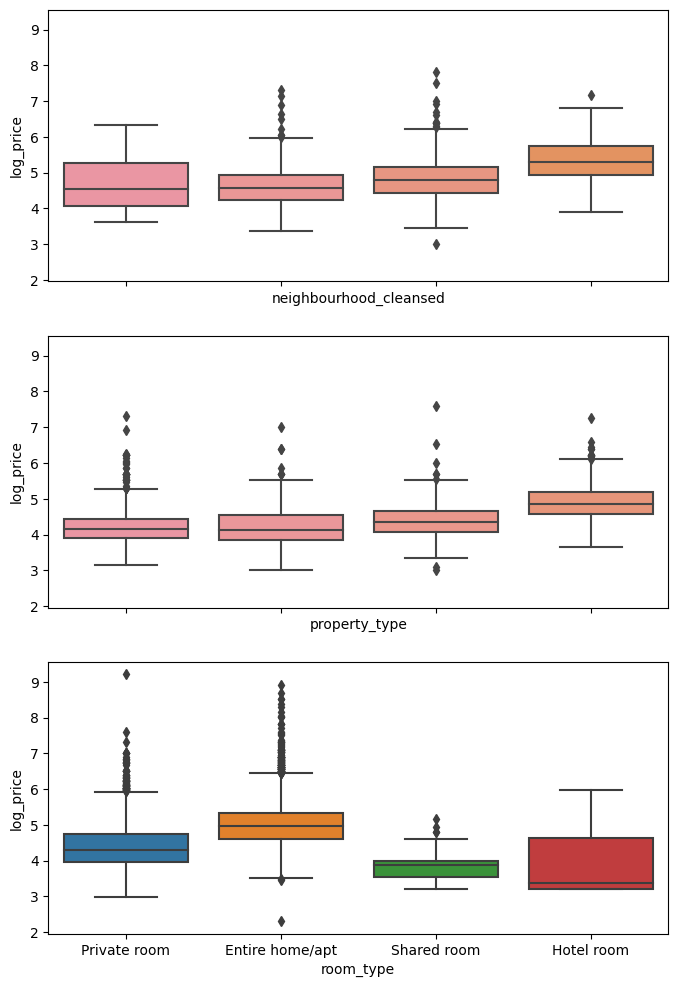

In [58]:
import matplotlib.pyplot as plt

cat_vars = ['neighbourhood_cleansed', 'property_type', 'room_type']
n_rows = len(cat_vars)
fig, axes = plt.subplots(n_rows, 1, figsize=(8, 12), sharex=True)
for i, var in enumerate(cat_vars):
    sns.boxplot(data=alojamientos_gdf, x=var, y='log_price', ax=axes[i])

Correlación de variables del alojamiento

Text(0.5, 1.0, 'Correlación de variables del alojamiento')

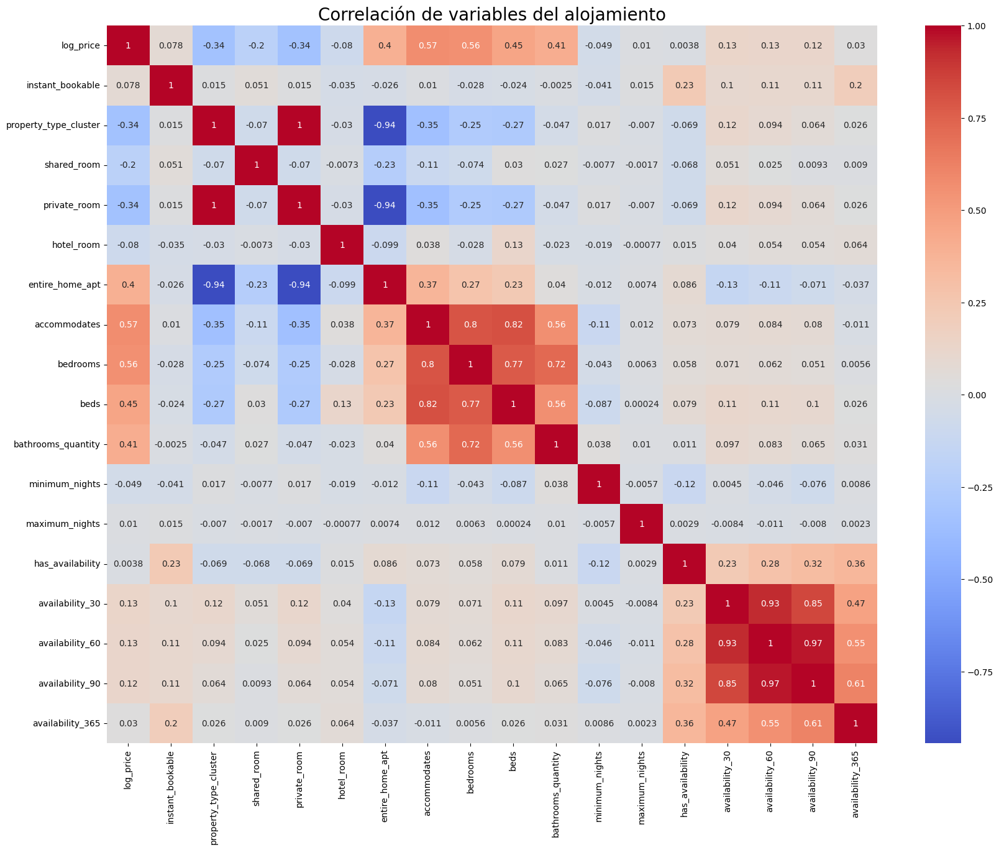

In [59]:
# con esta instrucción lo que hacemos es colocar más grande el mapa de calor
#plt.rcParams['figure.figsize'] = [10,8]
plt.rcParams.update({'font.size': 10})
hfig, axes = plt.subplots(figsize=(20,15))  
#'log_price','shared_room','private_room','hotel_room','entire_home_apt','accommodates', 'bedrooms',  'beds', 'bathrooms_quantity', 'minimum_nights','instant_bookable', 'availability_365', 'property_type_cluster'
listing_vars = ['log_price', 'instant_bookable',
'property_type', 'room_type', 'property_type_cluster', 'shared_room', 'private_room', 'hotel_room', 'entire_home_apt',
'accommodates', 'bedrooms', 'beds', 'bathrooms_quantity', 
'minimum_nights', 'maximum_nights', 
'has_availability', 'availability_30', 'availability_60', 'availability_90', 'availability_365'
]
# dibujamos el mapa con las correlaciones de todas las variables
sns.heatmap(alojamientos_gdf[listing_vars].corr(), cmap = 'coolwarm', ax = axes, annot=True) 
plt.title('Correlación de variables del alojamiento', fontsize=20)

Correlación de variables de servicios adicionales del alojamiento

Text(0.5, 1.0, 'Correlación de variables de servicios adicionales del alojamiento')

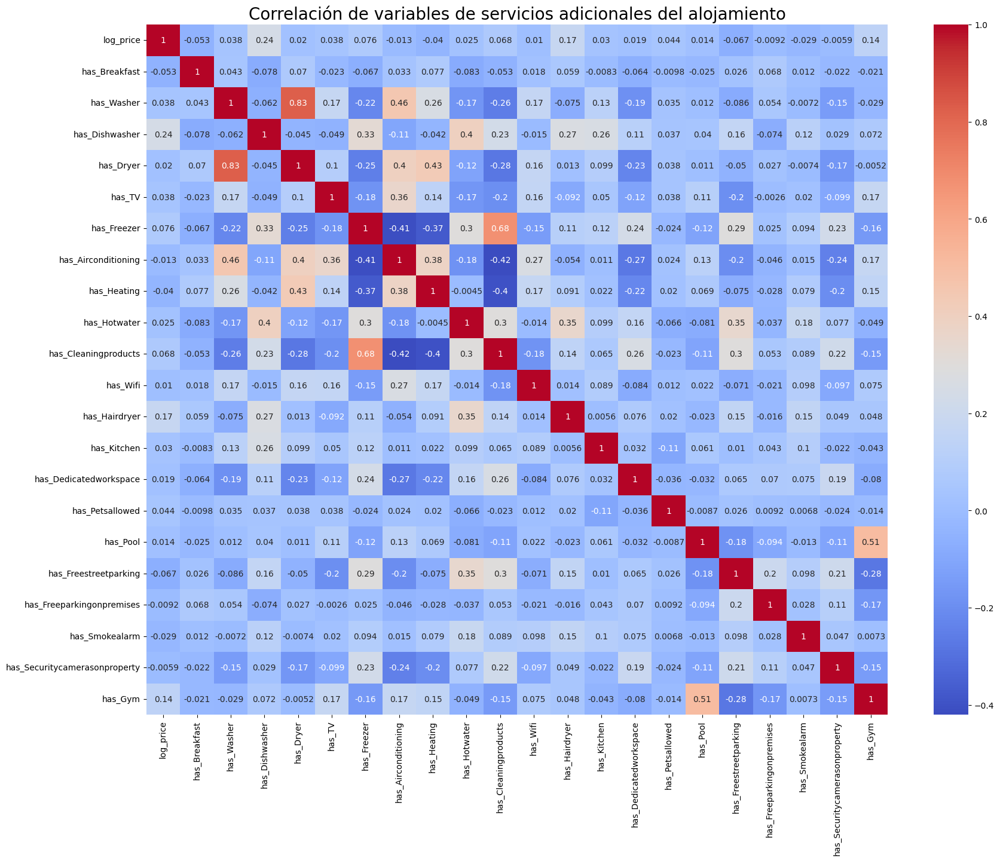

In [60]:
# con esta instrucción lo que hacemos es colocar más grande el mapa de calor
#plt.rcParams['figure.figsize'] = [10,8]
plt.rcParams.update({'font.size': 10})
hfig, axes = plt.subplots(figsize=(20,15))  
# dibujamos el mapa con las correlaciones de todas las variables
#'log_price','number_of_reviews', 'review_scores_rating', 'review_scores_accuracy', 'review_scores_cleanliness','review_scores_checkin', 'review_scores_communication','review_scores_location','review_scores_value'
amenities_vars=['log_price',
'has_Breakfast', 'has_Washer', 'has_Dishwasher', 'has_Dryer', 'has_TV', 'has_Freezer', 
'has_Airconditioning', 'has_Heating', 'has_Hotwater', 'has_Cleaningproducts', 'has_Wifi', 
'has_Hairdryer', 'has_Kitchen', 'has_Dedicatedworkspace', 'has_Petsallowed', 'has_Pool', 
'has_Freestreetparking', 'has_Freeparkingonpremises', 'has_Smokealarm', 
'has_Securitycamerasonproperty','has_Gym'
]
sns.heatmap(alojamientos_gdf[amenities_vars].corr(), cmap = 'coolwarm', ax = axes, annot=True) 
plt.title('Correlación de variables de servicios adicionales del alojamiento', fontsize=20)

Correlación de variables de calificaciones del huésped

Text(0.5, 1.0, 'Correlación de variables de calificaciones del huésped')

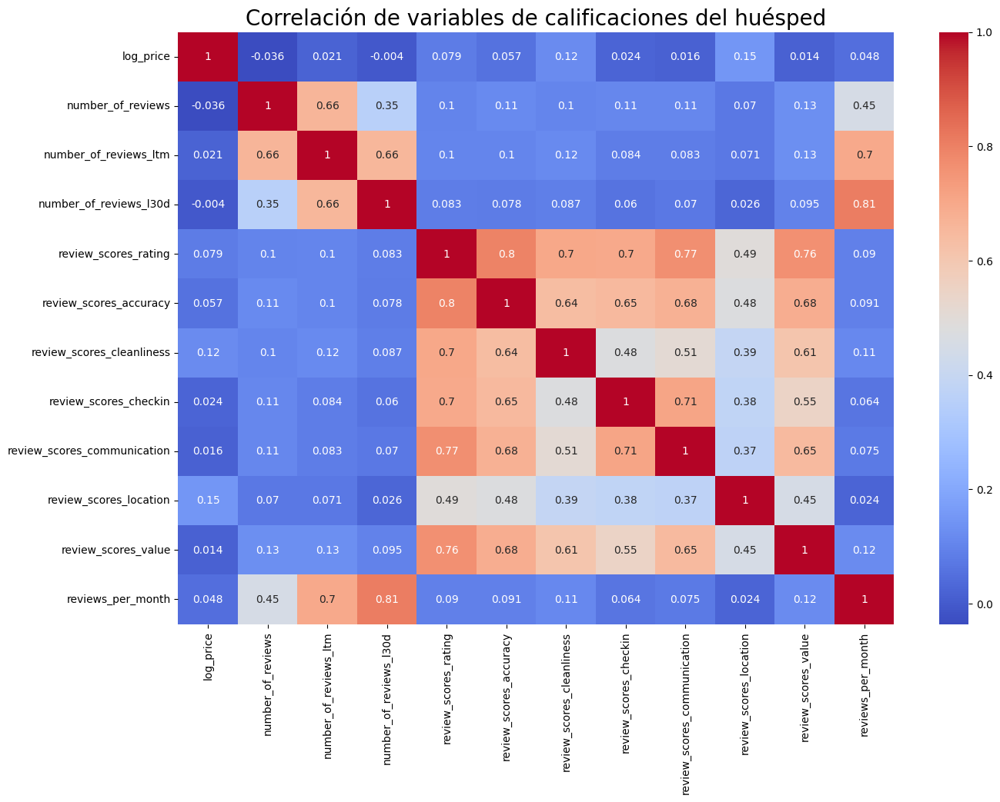

In [61]:
# con esta instrucción lo que hacemos es colocar más grande el mapa de calor
#plt.rcParams['figure.figsize'] = [10,8]
plt.rcParams.update({'font.size': 10})
hfig, axes = plt.subplots(figsize=(15,10))  
#'log_price','has_Breakfast','has_Washer', 'has_Dishwasher','has_Dryer', 'has_TV', 'has_Freezer','has_Airconditioning','has_Heating','has_Hotwater', 'has_Cleaningproducts','has_Wifi', 'has_Hairdryer','has_Kitchen', 'has_Dedicatedworkspace', 'has_Petsallowed', 'has_Pool', 'has_Freestreetparking', 'has_Freeparkingonpremises','has_Smokealarm', 'has_Securitycamerasonproperty'
score_vars = ['log_price','number_of_reviews', 'number_of_reviews_ltm', 'number_of_reviews_l30d', 
'review_scores_rating', 'review_scores_accuracy', 'review_scores_cleanliness', 'review_scores_checkin', 
'review_scores_communication', 'review_scores_location', 'review_scores_value', 'reviews_per_month']
# dibujamos el mapa con las correlaciones de todas las variables
sns.heatmap(alojamientos_gdf[score_vars].corr(), cmap = 'coolwarm', ax = axes, annot=True) 
plt.title('Correlación de variables de calificaciones del huésped', fontsize=20)

Correlación de variables del host

Text(0.5, 1.0, 'Correlación de variables del host')

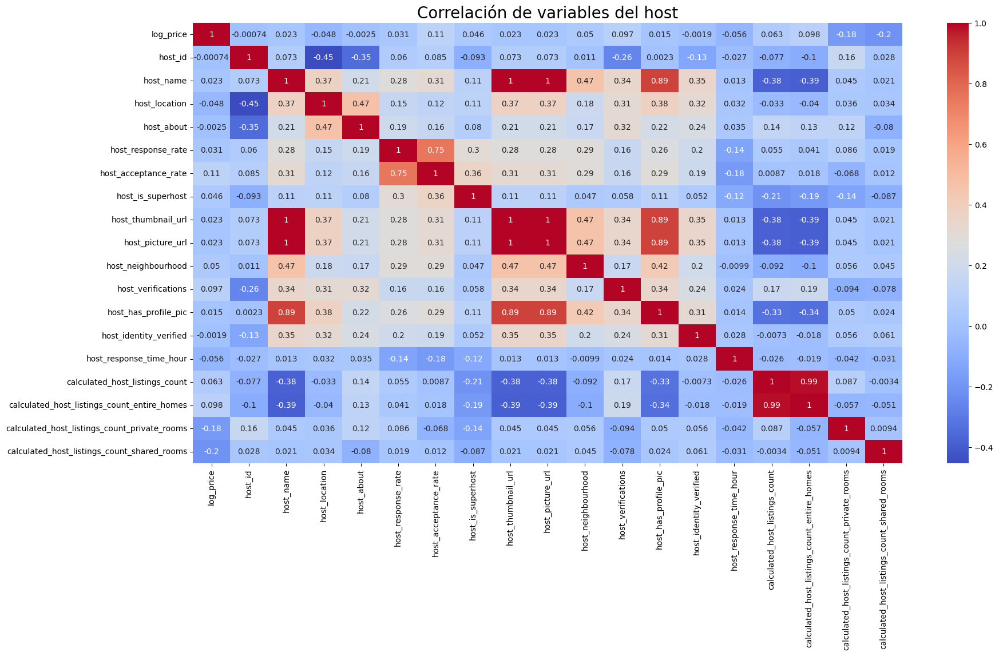

In [62]:
# con esta instrucción lo que hacemos es colocar más grande el mapa de calor
#plt.rcParams['figure.figsize'] = [20,10]
plt.rcParams.update({'font.size': 10})
hfig, axes = plt.subplots(figsize=(20,10))  
# dibujamos el mapa con las correlaciones de todas las variables
#host_vars = ['log_price','host_response_time_hour','host_about', 'host_is_superhost', 'host_picture_url', 'host_verifications', 'host_has_profile_pic', 'host_identity_verified','host_response_rate', 'host_acceptance_rate', 'calculated_host_listings_count']
host_vars = ['log_price','host_id', 'host_name', 'host_location', 'host_about', 'host_response_rate', 'host_acceptance_rate', 
'host_is_superhost', 'host_thumbnail_url', 'host_picture_url', 'host_neighbourhood', 'host_verifications', 
'host_has_profile_pic', 'host_identity_verified', 'host_response_time_hour', 
'calculated_host_listings_count', 'calculated_host_listings_count_entire_homes', 
'calculated_host_listings_count_private_rooms', 'calculated_host_listings_count_shared_rooms']
sns.heatmap(alojamientos_gdf[host_vars].corr(), cmap = 'coolwarm', ax = axes, annot=True) 
plt.title('Correlación de variables del host', fontsize=20)

Correlación de variables de ubicación

Text(0.5, 1.0, 'Correlación de variables de ubicación')

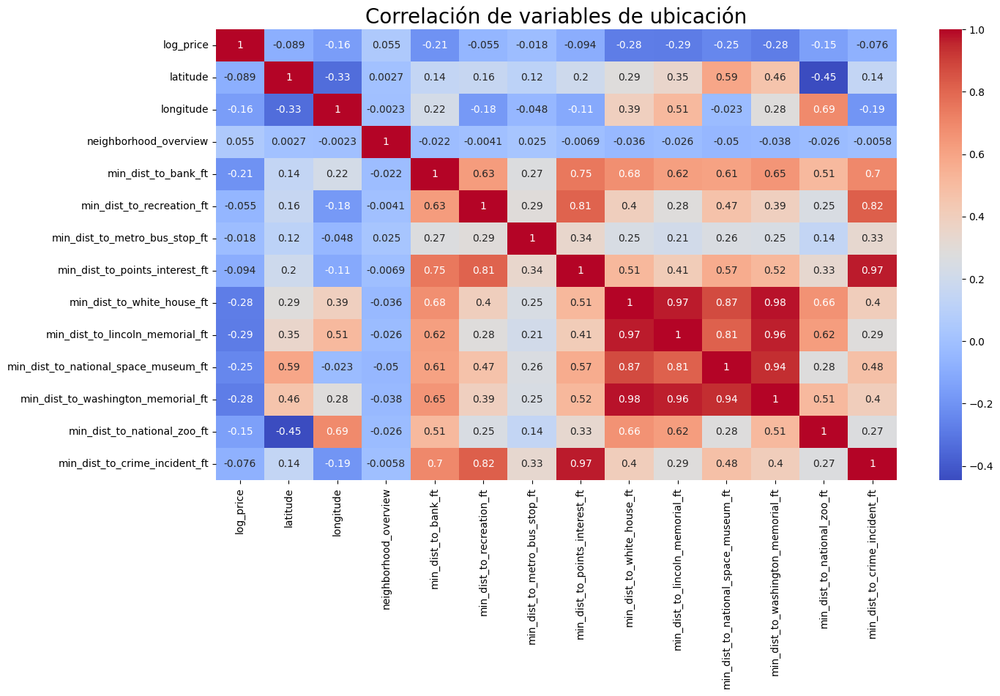

In [63]:
# con esta instrucción lo que hacemos es colocar más grande el mapa de calor
#plt.rcParams['figure.figsize'] = [10,8]
plt.rcParams.update({'font.size': 10})
hfig, axes = plt.subplots(figsize=(15,8))  
# dibujamos el mapa con las correlaciones de todas las variables
location_vars = ['log_price',
'latitude', 'longitude', 'neighborhood_overview',  'neighbourhood_cleansed', 
'min_dist_to_bank_ft', 'min_dist_to_recreation_ft', 'min_dist_to_metro_bus_stop_ft', 
'min_dist_to_points_interest_ft', 
'min_dist_to_white_house_ft', 'min_dist_to_lincoln_memorial_ft', 
'min_dist_to_national_space_museum_ft', 'min_dist_to_washington_memorial_ft', 
'min_dist_to_national_zoo_ft', 'min_dist_to_crime_incident_ft']
sns.heatmap(alojamientos_gdf[location_vars].corr(), cmap = 'coolwarm', ax = axes, annot=True) 
plt.title('Correlación de variables de ubicación', fontsize=20)

# **Revisión de outliers**

Se observa en el precio una distribución anormal.

Text(0.5, 1.0, 'Distribución del precio de los alojamientos')

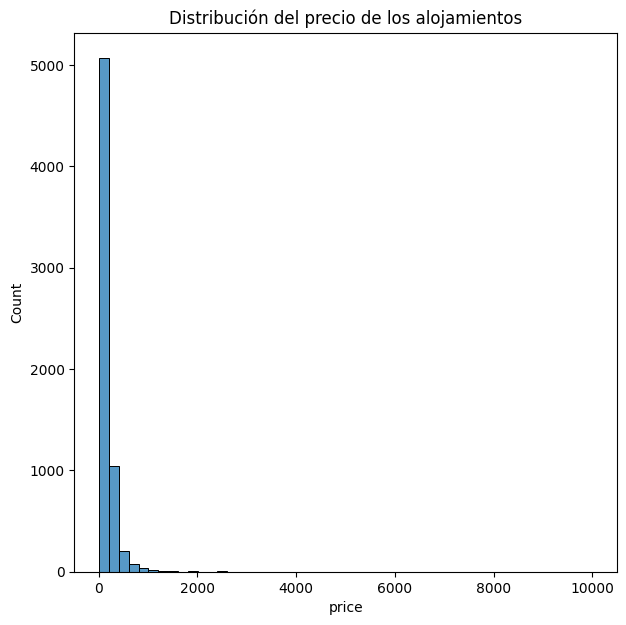

In [64]:
plt.rcParams['figure.figsize'] = [7, 7]
sns.histplot(alojamientos_gdf['price'], bins=50)
plt.title("Distribución del precio de los alojamientos")

In [65]:
print("Alojamientos menores o iguales a $500: " , alojamientos_gdf[alojamientos_gdf['price'] <= 500]["id"].count())
print("Alojamientos mayores a $500: " , alojamientos_gdf[alojamientos_gdf['price'] > 500]["id"].count())

Alojamientos menores o iguales a $500:  6235
Alojamientos mayores a $500:  235


El precio convertido a logaritmo se hizo para suavizar los datos y que tenga una distribución normal.

Text(0.5, 1.0, 'Distribución del precio de los alojamientos (logaritmo)')

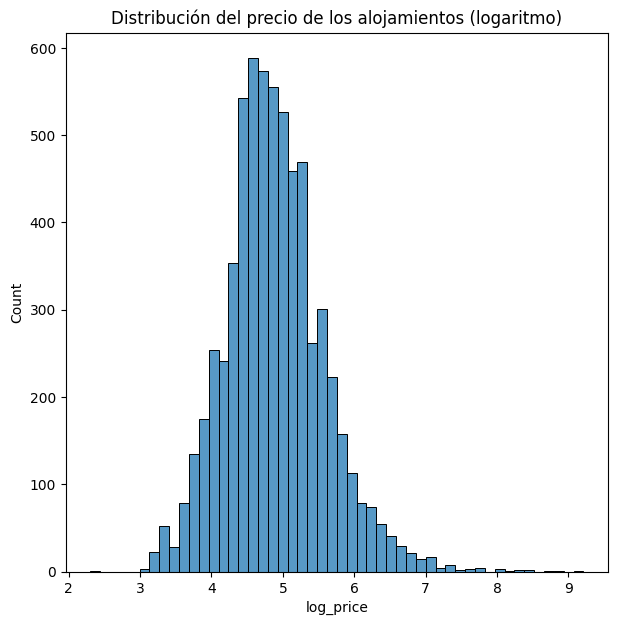

In [66]:
plt.rcParams['figure.figsize'] = [7, 7]
sns.histplot(alojamientos_gdf['log_price'], bins=50)
plt.title("Distribución del precio de los alojamientos (logaritmo)")

Se observa que entre más aumenta el número de personas permitidas en el alojamiento, más incrementa el precio.

In [67]:
xol = ["price", "log_price",  'property_type', 'room_type',
        'accommodates', 'bedrooms', 'beds', 'minimum_nights', 'bathrooms_quantity', 
        'maximum_nights', 'instant_bookable', 'availability_365', 'property_type_cluster'
       ]

<AxesSubplot: >

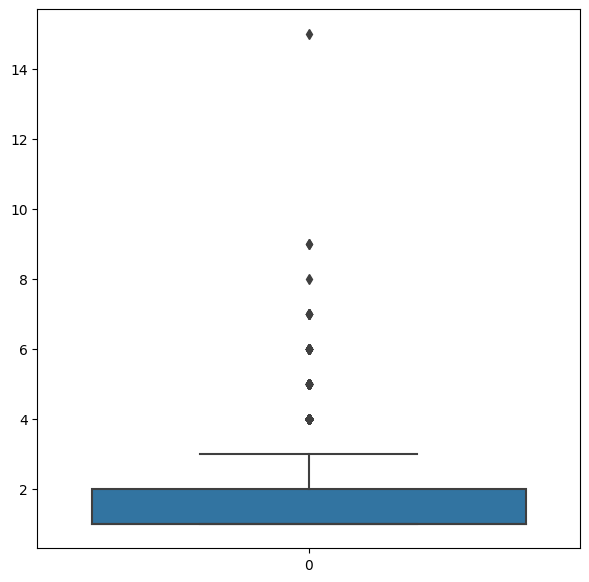

In [68]:
sns.boxplot(alojamientos_gdf['bedrooms'])

Text(0.5, 1.0, 'Número máximo de personas permitidas en el alojamiento vs precio')

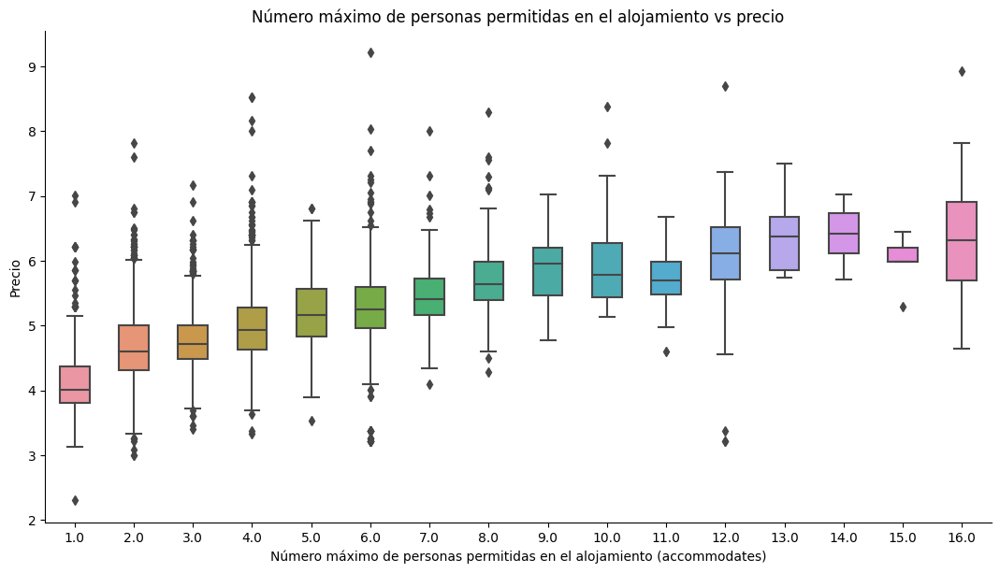

In [69]:
sns.catplot(
    data=alojamientos_gdf, 
    x='accommodates', y='log_price', kind='box',
    height=6, aspect=1.8, width=0.5
)
plt.xlabel("Número máximo de personas permitidas en el alojamiento (accommodates)")
plt.ylabel('Precio')
plt.title('Número máximo de personas permitidas en el alojamiento vs precio')

Se observa que eñ tipo de habitación "Entire Home/Apto" es el que más alto tiene los precios. Además se observan algunos outliers.

Text(0.5, 1.0, 'Tipo de habitación del alojamiento vs Precio')

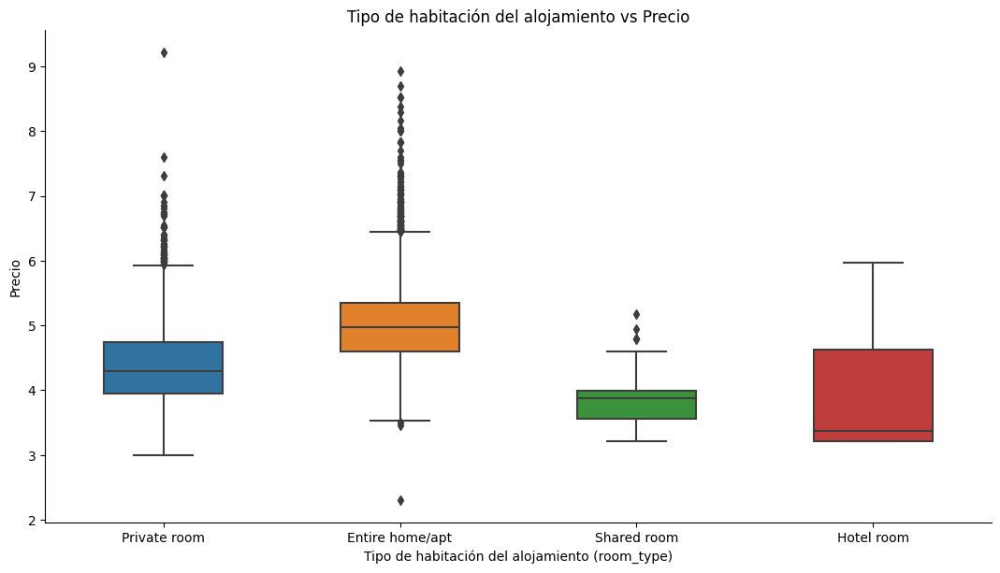

In [70]:
sns.catplot(
    data=alojamientos_gdf, 
    x='room_type', y='log_price', kind='box',
    height=6, aspect=1.8, width=0.5
)
plt.xlabel("Tipo de habitación del alojamiento (room_type)")
plt.ylabel('Precio')
plt.title('Tipo de habitación del alojamiento vs Precio')

Se observan algunos outliers en cuanto al número de baños del alojamiento.

Text(0.5, 1.0, 'Número de baños del alojamiento vs Precio')

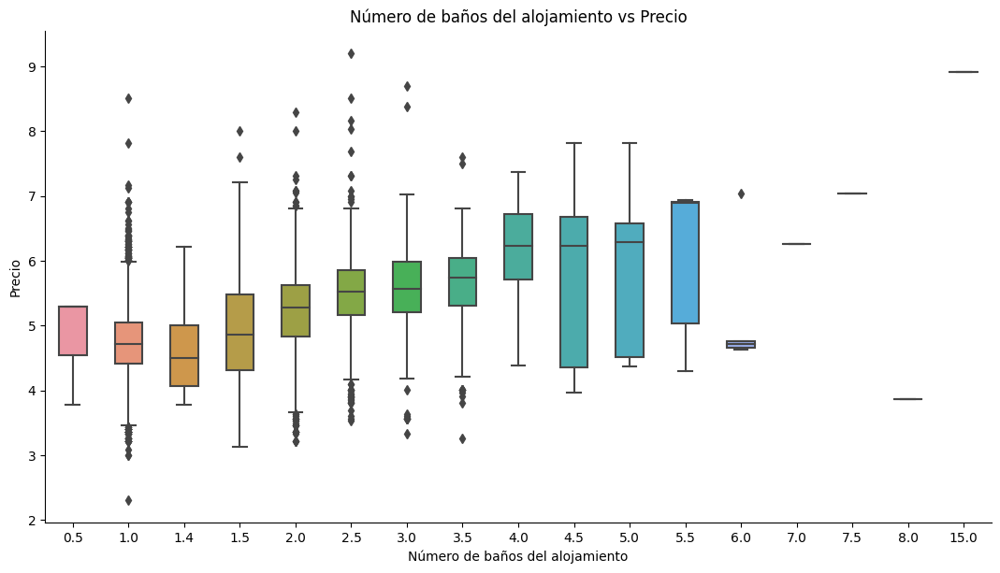

In [71]:
sns.catplot(
    data=alojamientos_gdf, 
    x='bathrooms_quantity', y='log_price', kind='box',
    height=6, aspect=1.8, width=0.5
)
plt.xlabel("Número de baños del alojamiento")
plt.ylabel('Precio')
plt.title('Número de baños del alojamiento vs Precio')

Se observan algunos outliers en cuanto al número de camas del alojamiento.

Text(0.5, 1.0, 'Número de camas del alojamiento vs Precio')

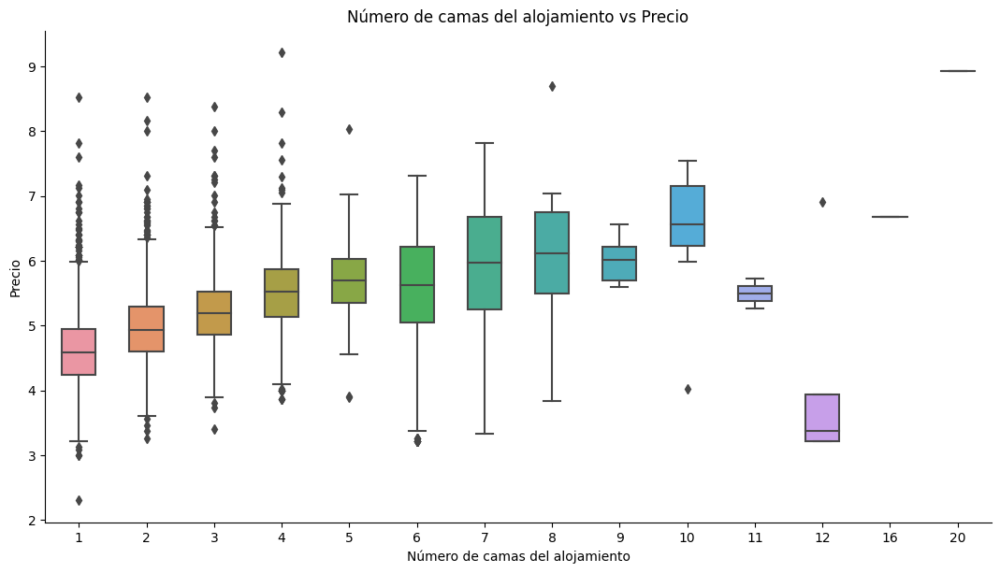

In [72]:
sns.catplot(
    data=alojamientos_gdf, 
    x='beds', y='log_price', kind='box',
    height=6, aspect=1.8, width=0.5
)
plt.xlabel("Número de camas del alojamiento")
plt.ylabel('Precio')
plt.title('Número de camas del alojamiento vs Precio')

Se observan algunos outliers en cuanto al número de habitaciones del alojamiento. Además se ve una tendencia a que entre más habitaciones tiene un alojamiento, más alto será su precio.

Text(0.5, 1.0, 'Número de habitaciones del alojamiento vs Precio')

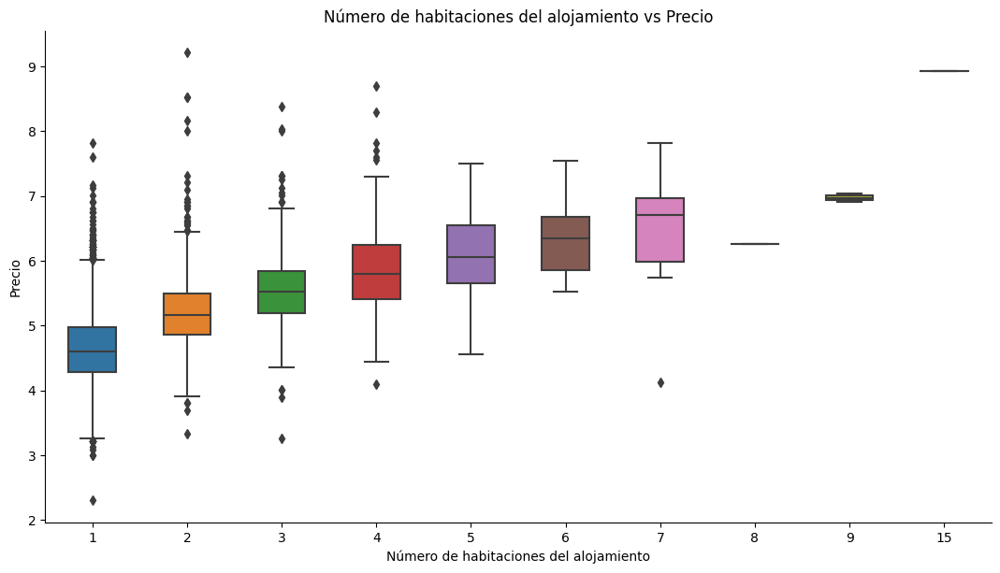

In [73]:
sns.catplot(
    data=alojamientos_gdf, 
    x='bedrooms', y='log_price', kind='box',
    height=6, aspect=1.8, width=0.5
)

plt.xlabel("Número de habitaciones del alojamiento")
plt.ylabel('Precio')
plt.title('Número de habitaciones del alojamiento vs Precio')

# **Análisis de los datos**

## Variable dependiente

Precio

In [74]:
print("Precios menores o iguales a 200: " , alojamientos_gdf[alojamientos_gdf['price'] <= 200]["id"].count())
print("Precios mayores a 200: " , alojamientos_gdf[alojamientos_gdf['price'] > 200]["id"].count())

Precios menores o iguales a 200:  4964
Precios mayores a 200:  1506


In [75]:
tmp = alojamientos_gdf.groupby(['price'], as_index=False)['id'].count().sort_values(by = 'id', ascending=False)
tmp.head(20)

,price,id
78,100.0,139
128,150.0,116
103,125.0,103
48,70.0,99
98,120.0,96
77,99.0,95
58,80.0,92
68,90.0,90
178,200.0,88
63,85.0,87


(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
        34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50,
        51, 52, 53]),
 [Text(0, 0, '(0, 200]'),
  Text(1, 0, '(200, 400]'),
  Text(2, 0, '(400, 600]'),
  Text(3, 0, '(600, 800]'),
  Text(4, 0, '(800, 1000]'),
  Text(5, 0, '(1000, 1200]'),
  Text(6, 0, '(1200, 1400]'),
  Text(7, 0, '(1400, 1600]'),
  Text(8, 0, '(1600, 1800]'),
  Text(9, 0, '(1800, 2000]'),
  Text(10, 0, '(2000, 2200]'),
  Text(11, 0, '(2200, 2400]'),
  Text(12, 0, '(2400, 2600]'),
  Text(13, 0, '(2600, 2800]'),
  Text(14, 0, '(2800, 3000]'),
  Text(15, 0, '(3000, 3200]'),
  Text(16, 0, '(3200, 3400]'),
  Text(17, 0, '(3400, 3600]'),
  Text(18, 0, '(3600, 3800]'),
  Text(19, 0, '(3800, 4000]'),
  Text(20, 0, '(4000, 4200]'),
  Text(21, 0, '(4200, 4400]'),
  Text(22, 0, '(4400, 4600]'),
  Text(23, 0, '(4600, 4800]'),
  Text(24, 0, '(4800, 5000]

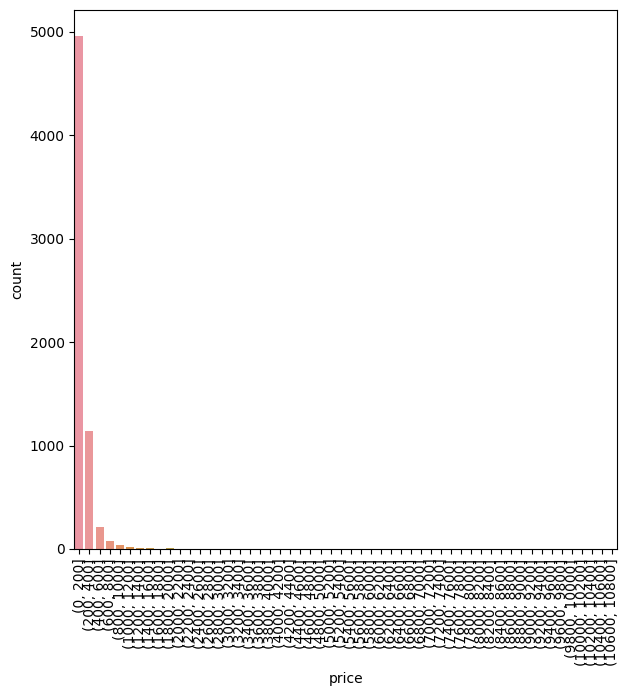

In [76]:
tmp1 = alojamientos_gdf.groupby(pd.cut(alojamientos_gdf["price"], np.arange(0, 11000, 200)))["id"].count()
tmp = pd.DataFrame({'price':tmp1.index, 'count':tmp1.values})
tmp.drop(tmp[tmp["count"] == 0].index, inplace=True)
sns.barplot(x="price",y="count",data=tmp)
plt.xticks(rotation=90)

## Características del alojamiento

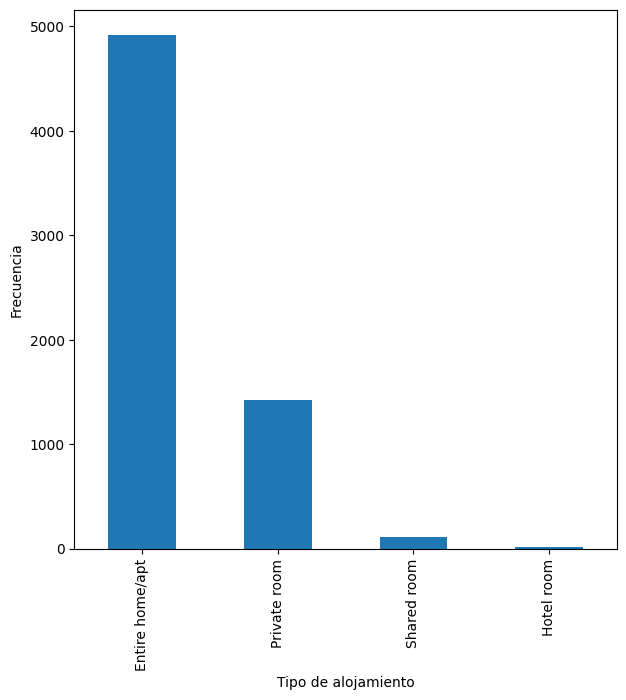

In [77]:
# Gráfico de barras de la frecuencia de los diferentes tipos de alojamiento
alojamientos_gdf['room_type'].value_counts().plot(kind='bar')
plt.xlabel('Tipo de alojamiento')
plt.ylabel('Frecuencia')
plt.show()

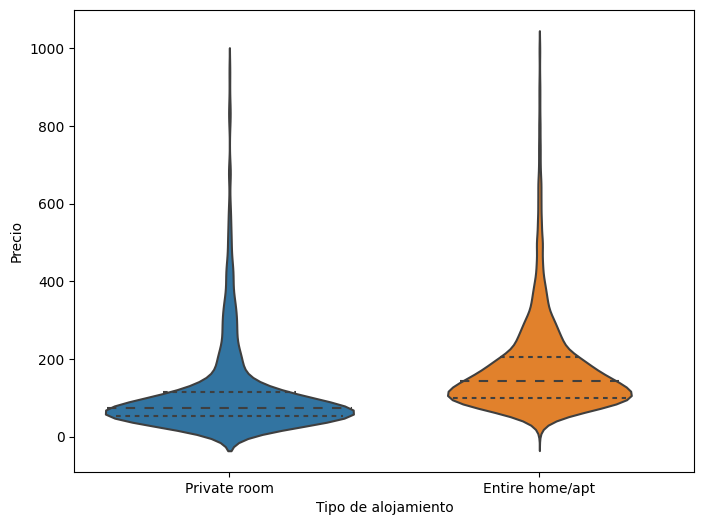

In [78]:
# Gráfico de densidad del precio por tipo de alojamiento
df_density = alojamientos_gdf[['price', 'room_type']].copy()
df_density = df_density[df_density['price'] < 1000]
df_density = df_density[df_density['room_type'].isin(['Entire home/apt', 'Private room'])]
df_density = pd.melt(df_density, id_vars=['room_type'], value_vars=['price'])
plt.figure(figsize=(8,6))
sns.violinplot(data=df_density, x='room_type', y='value', inner='quartile')
plt.xlabel('Tipo de alojamiento')
plt.ylabel('Precio')
plt.show()

**Minimum Nights**

Text(0.5, 1.0, 'Precio por Noches mínimas')

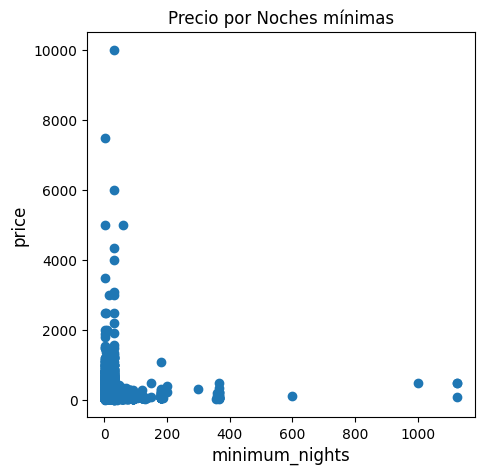

In [79]:
plt.figure(figsize=(5,5))
plt.scatter(x = alojamientos_gdf["minimum_nights"], y = alojamientos_gdf["price"])
plt.xlabel('minimum_nights', fontsize=12)
plt.ylabel('price', fontsize=12)
plt.title('Precio por Noches mínimas')

In [80]:
alojamientos_gdf[alojamientos_gdf['minimum_nights'] > 40][["price","room_type","property_type", "minimum_nights"]].head(10)

,price,room_type,property_type,minimum_nights
16,500.0,Private room,Private room in home,1000
17,500.0,Private room,Private room in home,1125
22,500.0,Private room,Private room in home,1125
51,65.0,Entire home/apt,Entire rental unit,120
61,120.0,Entire home/apt,Entire rental unit,180
71,160.0,Entire home/apt,Entire townhouse,120
83,129.0,Entire home/apt,Entire rental unit,90
114,105.0,Entire home/apt,Entire rental unit,180
117,90.0,Private room,Private room in townhouse,90
143,145.0,Entire home/apt,Entire rental unit,180


In [81]:
tmp = alojamientos_gdf.groupby(['minimum_nights'], as_index=False)['id'].count()#.sort_values(by = 'id', ascending=False)
tmp.head(10)

,minimum_nights,id
0,1,1059
1,2,1237
2,3,562
3,4,142
4,5,83
5,6,13
6,7,82
7,8,2
8,10,31
9,12,1


In [82]:
print("Minimum nights menores a 1: " , alojamientos_gdf[alojamientos_gdf['minimum_nights'] <= 40]["id"].count())
print("Minimum nights mayores a 1: " , alojamientos_gdf[alojamientos_gdf['minimum_nights'] > 40]["id"].count())

Minimum nights menores a 1:  6145
Minimum nights mayores a 1:  325


**Room Type**

(array([0, 1, 2, 3]),
 [Text(0, 0, 'Entire home/apt'),
  Text(1, 0, 'Private room'),
  Text(2, 0, 'Shared room'),
  Text(3, 0, 'Hotel room')])

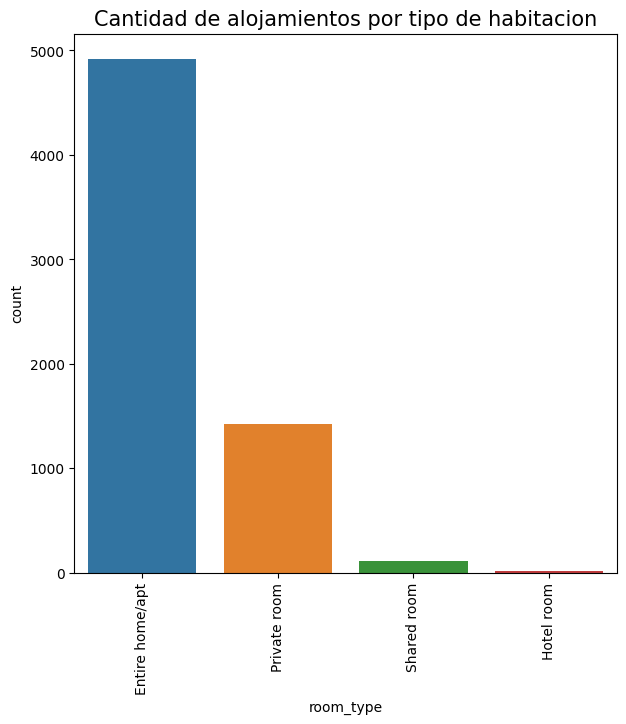

In [83]:
plt.figure(figsize=(7,7))
ax = sns.countplot(data = alojamientos_gdf, x='room_type', order = alojamientos_gdf['room_type'].value_counts().index)
ax.set_title("Cantidad de alojamientos por tipo de habitacion", fontsize=15)
plt.xticks(rotation = 90)

Text(0.5, 1.0, 'Tipo de habitación (room_type)')

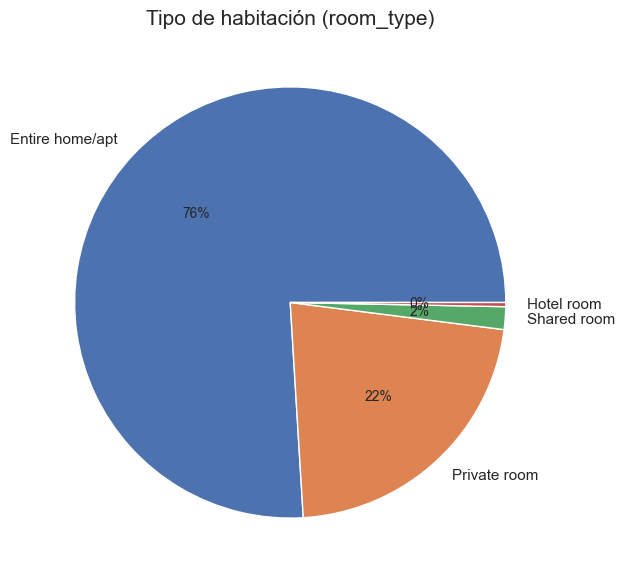

In [84]:
sns.set(rc={'figure.figsize':(7,7)})
plt.rcParams.update({'font.size': 10})
tmp = alojamientos_gdf.groupby(['room_type'], as_index=False)['id'].count().sort_values(by = 'id', ascending=False)
plt.pie(tmp["id"], labels = tmp["room_type"], autopct='%.0f%%') 
plt.title('Tipo de habitación (room_type)', fontsize=15)

In [85]:
tmp = alojamientos_gdf.groupby(['room_type'], as_index=False)['price'].mean().sort_values(by = 'price', ascending=False)
tmp.head(20)

,room_type,price
0,Entire home/apt,197.590844
2,Private room,126.905263
1,Hotel room,90.500000
3,Shared room,51.163636


Text(0.5, 1.0, 'Precio promedio de los distintos tipo de habitación de los alojamientos')

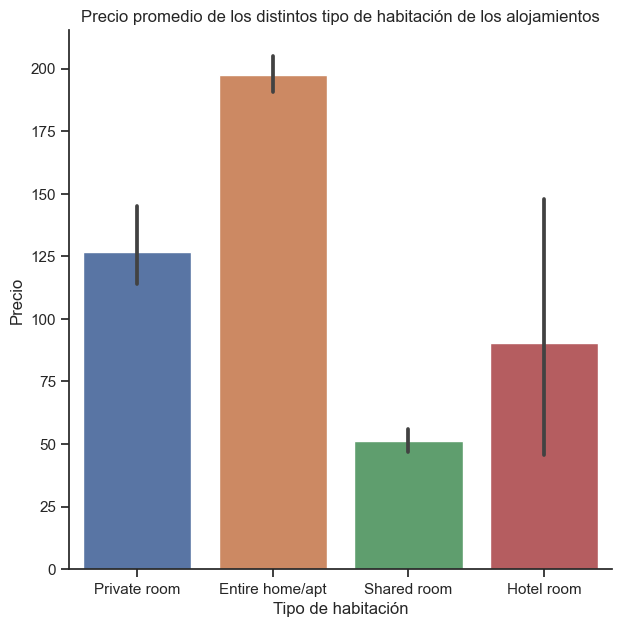

In [86]:
sns.set(rc={'figure.figsize':(7,7)})
custom_params = {"axes.spines.right": False, "axes.spines.top": False}
sns.set_theme(style="ticks", rc=custom_params)
ax = sns.barplot(x='room_type', y='price', data=alojamientos_gdf) #,  palette="muted", orient='h' )
    
plt.xlabel('Tipo de habitación')
plt.ylabel('Precio')
plt.title('Precio promedio de los distintos tipo de habitación de los alojamientos')

**Property Type**

In [87]:
tmp = alojamientos_gdf.groupby(['property_type'], as_index=False)['number_of_reviews'].count().sort_values(by = 'number_of_reviews', ascending=False)
tmp.head(10)

,property_type,number_of_reviews
12,Entire rental unit,2301
9,Entire home,681
26,Private room in home,571
5,Entire condo,545
14,Entire townhouse,499
7,Entire guest suite,473
32,Private room in townhouse,282
13,Entire serviced apartment,259
29,Private room in rental unit,232
36,Room in boutique hotel,112


In [88]:
tmp = alojamientos_gdf.groupby(['property_type'], as_index=False)['id'].count().sort_values(by = 'id', ascending=False)
tmp.head(60)

,property_type,id
12,Entire rental unit,2301
9,Entire home,681
26,Private room in home,571
5,Entire condo,545
14,Entire townhouse,499
7,Entire guest suite,473
32,Private room in townhouse,282
13,Entire serviced apartment,259
29,Private room in rental unit,232
36,Room in boutique hotel,112


In [89]:
tmp = alojamientos_gdf.groupby(['property_type'], as_index=False)['price'].mean().sort_values(by = 'price', ascending=False)
tmp.head(100)

,property_type,price
16,Entire villa,1480.000000
50,Tower,761.000000
30,Private room in resort,575.000000
38,Room in hotel,396.016667
9,Entire home,353.872247
36,Room in boutique hotel,347.741071
39,Room in serviced apartment,289.500000
14,Entire townhouse,278.785571
49,Tiny home,265.000000
11,Entire place,259.833333


(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
        34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50]),
 [Text(0, 0, 'Entire rental unit'),
  Text(1, 0, 'Entire home'),
  Text(2, 0, 'Private room in home'),
  Text(3, 0, 'Entire condo'),
  Text(4, 0, 'Entire townhouse'),
  Text(5, 0, 'Entire guest suite'),
  Text(6, 0, 'Private room in townhouse'),
  Text(7, 0, 'Entire serviced apartment'),
  Text(8, 0, 'Private room in rental unit'),
  Text(9, 0, 'Room in boutique hotel'),
  Text(10, 0, 'Private room in condo'),
  Text(11, 0, 'Entire guesthouse'),
  Text(12, 0, 'Room in hotel'),
  Text(13, 0, 'Shared room in rental unit'),
  Text(14, 0, 'Private room in guest suite'),
  Text(15, 0, 'Entire loft'),
  Text(16, 0, 'Private room in bed and breakfast'),
  Text(17, 0, 'Shared room in townhouse'),
  Text(18, 0, 'Shared room in home'),
  Text(19, 0, 'Shared room in host

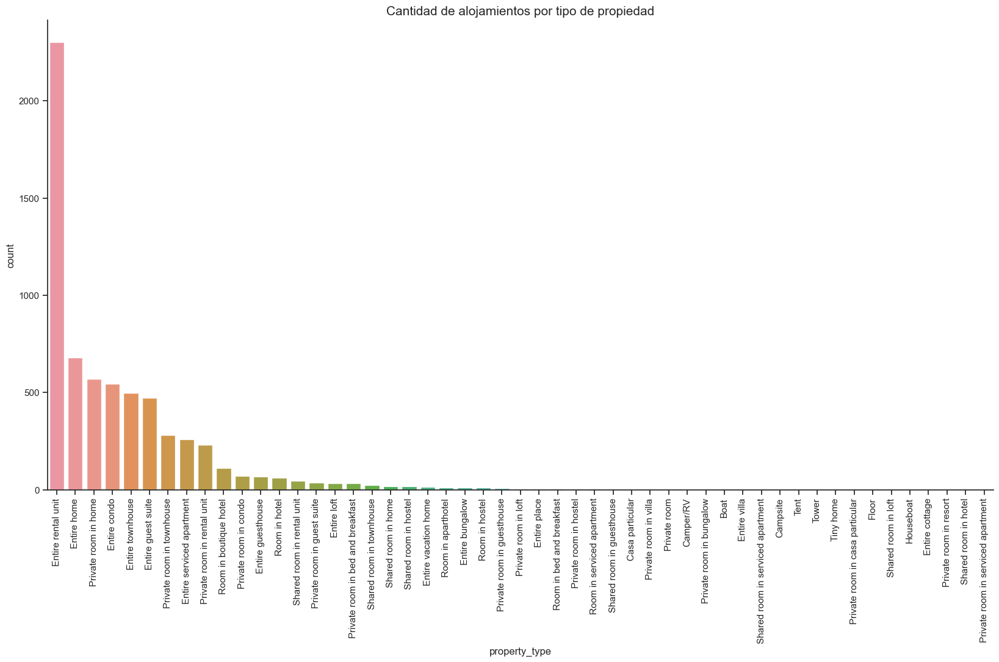

In [90]:
plt.figure(figsize=(20,10))
ax = sns.countplot(data = alojamientos_gdf, x='property_type', order = alojamientos_gdf['property_type'].value_counts().index)
ax.set_title("Cantidad de alojamientos por tipo de propiedad", fontsize=15)
plt.xticks(rotation = 90)

In [91]:
alojamientos_gdf.groupby(['property_type_cluster'], as_index=False).agg(
    cantidad = ("price", "count"),
    precio_promedio = ("price", "mean")
)

,property_type_cluster,cantidad,precio_promedio
0,0,5045,193.973637
1,1,1425,126.905263


**Availability**

In [92]:
alojamientos_gdf.groupby(['has_availability'], as_index=False).agg(
    cantidad = ("price", "count"),
    precio_promedio = ("price", "mean")
)

,has_availability,cantidad,precio_promedio
0,0,449,227.216036
1,1,6021,175.621491


**Otros**

Text(0.5, 1.0, 'bathrooms_quantity vs price')

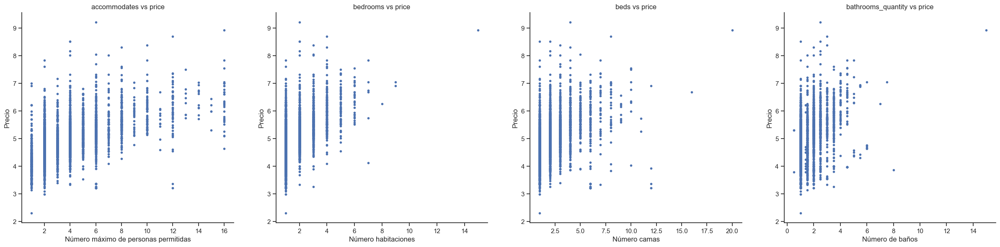

In [93]:
plt.rcParams['figure.figsize'] = [30, 30]

plt.subplot(4, 4, 1)
plt.plot(alojamientos_gdf["accommodates"], alojamientos_gdf["log_price"], marker='.', linestyle='none')
plt.xlabel("Número máximo de personas permitidas")
plt.ylabel('Precio')
plt.title('accommodates vs price')

plt.subplot(4, 4, 2)
plt.plot(alojamientos_gdf["bedrooms"], alojamientos_gdf["log_price"], marker='.', linestyle='none')
plt.xlabel("Número habitaciones")
plt.ylabel('Precio')
plt.title('bedrooms vs price')

plt.subplot(4, 4, 3)
plt.plot(alojamientos_gdf["beds"], alojamientos_gdf["log_price"], marker='.', linestyle='none')
plt.xlabel("Número camas")
plt.ylabel('Precio')
plt.title('beds vs price')

plt.subplot(4, 4, 4)
plt.plot(alojamientos_gdf["bathrooms_quantity"], alojamientos_gdf["log_price"], marker='.', linestyle='none')
plt.xlabel("Número de baños")
plt.ylabel('Precio')
plt.title('bathrooms_quantity vs price')

Habitaciones

In [94]:
tmp = alojamientos_gdf.groupby(['bedrooms'], as_index=False).agg(
    cantidad = ("price", "count"),
    precio_promedio = ("price", "mean")
)
total = tmp.agg({'cantidad': 'sum'})
porcentaje = (tmp["cantidad"] / total["cantidad"]) * 100
tmp["cantidad_pct"] = round(porcentaje,0)
tmp = tmp.reindex(columns=['bedrooms', 'cantidad', 'cantidad_pct', 'precio_promedio'])
tmp.rename(columns={"bedrooms": "Habitaciones (bedrooms)", 
                    "cantidad": "Cantidad de alojamientos", 
                    "precio_promedio": "Precio promedio (USD)",
                    "cantidad_pct": "Cantidad (%)"}, inplace=True)
tmp.head(100)

,Habitaciones (bedrooms),Cantidad de alojamientos,Cantidad (%),Precio promedio (USD)
0,1,4363,67.0,124.704790
1,2,1291,20.0,223.392719
2,3,505,8.0,317.964356
3,4,216,3.0,464.495370
4,5,60,1.0,554.366667
5,6,25,0.0,678.720000
6,7,6,0.0,943.333333
7,8,1,0.0,520.000000
8,9,2,0.0,1068.500000
9,15,1,0.0,7500.000000


Camas

In [95]:
tmp = alojamientos_gdf.groupby(['beds'], as_index=False).agg(
    cantidad = ("price", "count"),
    precio_promedio = ("price", "mean")
)
total = tmp.agg({'cantidad': 'sum'})
porcentaje = (tmp["cantidad"] / total["cantidad"]) * 100
tmp["cantidad_pct"] = round(porcentaje,0)
tmp = tmp.reindex(columns=['beds', 'cantidad', 'cantidad_pct', 'precio_promedio'])
tmp.rename(columns={"beds": "Camas (beds)", 
                    "cantidad": "Cantidad de alojamientos", 
                    "precio_promedio": "Precio promedio (USD)",
                    "cantidad_pct": "Cantidad (%)"}, inplace=True)
tmp.head(100)

,Camas (beds),Cantidad de alojamientos,Cantidad (%),Precio promedio (USD)
0,1,3142,49.0,120.707829
1,2,1875,29.0,178.932267
2,3,771,12.0,229.054475
3,4,330,5.0,342.851515
4,5,158,2.0,360.025316
5,6,112,2.0,356.955357
6,7,30,0.0,594.600000
7,8,27,0.0,726.629630
8,9,8,0.0,425.500000
9,10,8,0.0,911.125000


Baños

In [96]:
tmp = alojamientos_gdf.groupby(['bathrooms_quantity'], as_index=False).agg(
    cantidad = ("price", "count"),
    precio_promedio = ("price", "mean")
)
total = tmp.agg({'cantidad': 'sum'})
porcentaje = (tmp["cantidad"] / total["cantidad"]) * 100
tmp["cantidad_pct"] = round(porcentaje,0)
tmp = tmp.reindex(columns=['bathrooms_quantity', 'cantidad', 'cantidad_pct', 'precio_promedio'])
tmp.rename(columns={"bathrooms_quantity": "Baños (bathrooms_quantity)", 
                    "cantidad": "Cantidad de alojamientos", 
                    "precio_promedio": "Precio promedio (USD)",
                    "cantidad_pct": "Cantidad (%)"}, inplace=True)
tmp.head(100)

,Baños (bathrooms_quantity),Cantidad de alojamientos,Cantidad (%),Precio promedio (USD)
0,0.5,3,0.0,148.000000
1,1.0,4545,70.0,133.264246
2,1.4,12,0.0,171.083333
3,1.5,431,7.0,186.800464
4,2.0,761,12.0,237.039422
5,2.5,347,5.0,352.749280
6,3.0,129,2.0,399.798450
7,3.5,143,2.0,350.048951
8,4.0,38,1.0,595.500000
9,4.5,34,1.0,641.764706


**instant_bookable**

Análisis de la variable instant_bookable: Indica si el huesped puede automaticamente reservar el alojamiento sin que el host deba veriificar.

Text(0.5, 1.0, 'El alojamiento es reservable inmediatamente')

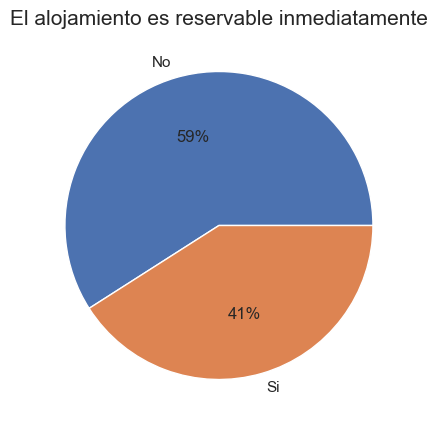

In [97]:
sns.set(rc={'figure.figsize':(5,5)})
tmp = alojamientos_gdf.groupby(['instant_bookable'], as_index=False)['id'].count().sort_values(by = 'id', ascending=False)
tmp['instant_bookable'] = tmp['instant_bookable'].replace(to_replace=[1, 0], value=["Si", "No"])
plt.pie(tmp["id"], labels = tmp["instant_bookable"], autopct='%.0f%%')
plt.title('El alojamiento es reservable inmediatamente', fontsize=15)

In [98]:
tmp = alojamientos_gdf.groupby(['instant_bookable'], as_index=False).agg(
    cantidad = ("price", "count"),
    precio_promedio = ("price", "mean")
)
total = tmp.agg({'cantidad': 'sum'})
porcentaje = (tmp["cantidad"] / total["cantidad"]) * 100
tmp["cantidad_pct"] = round(porcentaje,0)
tmp = tmp.reindex(columns=['instant_bookable', 'cantidad', 'cantidad_pct', 'precio_promedio'])
tmp.rename(columns={"instant_bookable": "Reserva inmediata (Instant_bookable)", 
                    "cantidad": "Cantidad de alojamientos", 
                    "precio_promedio": "Precio promedio (USD)",
                    "cantidad_pct": "Cantidad (%)"}, inplace=True)
tmp.head()

,Reserva inmediata (Instant_bookable),Cantidad de alojamientos,Cantidad (%),Precio promedio (USD)
0,0,3820,59.0,176.076440
1,1,2650,41.0,183.707547


## Características de ubicación

Número de alojamientos de Airbnb por barrio en la ciudad de Washington DC

Text(0.5, 1.0, 'Cantidad de alojamientos de Airbnb por barrio en la ciudad de Washington DC')

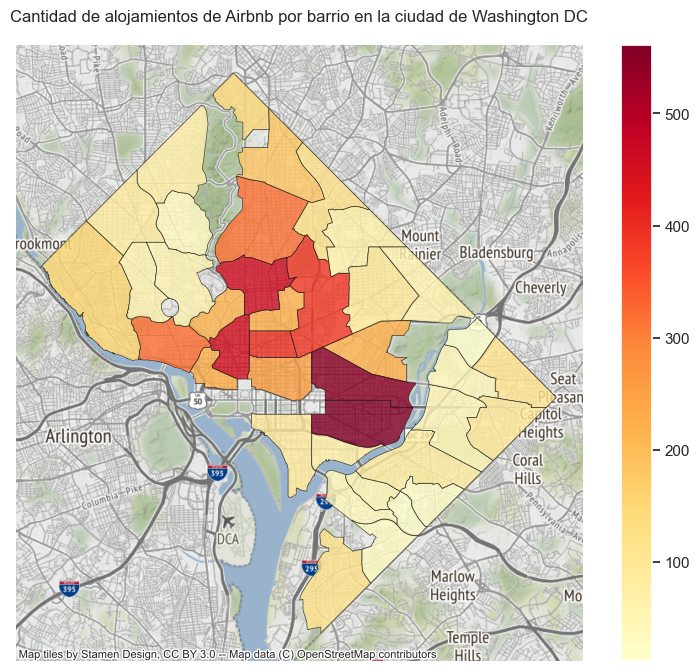

In [99]:
max_alojamientos = vecindarios_airbnb.conteo_alojamientos.max()
tmp_map = vecindarios_airbnb.copy()
tmp_map = tmp_map.to_crs(epsg=3857)
fig, ax = plt.subplots(figsize=(10,8), subplot_kw={'aspect':'equal'})
ax = tmp_map.plot(column='conteo_alojamientos', cmap='YlOrRd', legend=True, ax=ax, alpha=0.8, edgecolor='k',  linewidth=0.5)
ctx.add_basemap(ax, url=ctx.providers.Stamen.TonerLite)
ax.set_axis_off()
plt.title("Cantidad de alojamientos de Airbnb por barrio en la ciudad de Washington DC")

**Barrios**

Text(0.5, 1.0, 'Barrios de la ciudad de Washington DC')

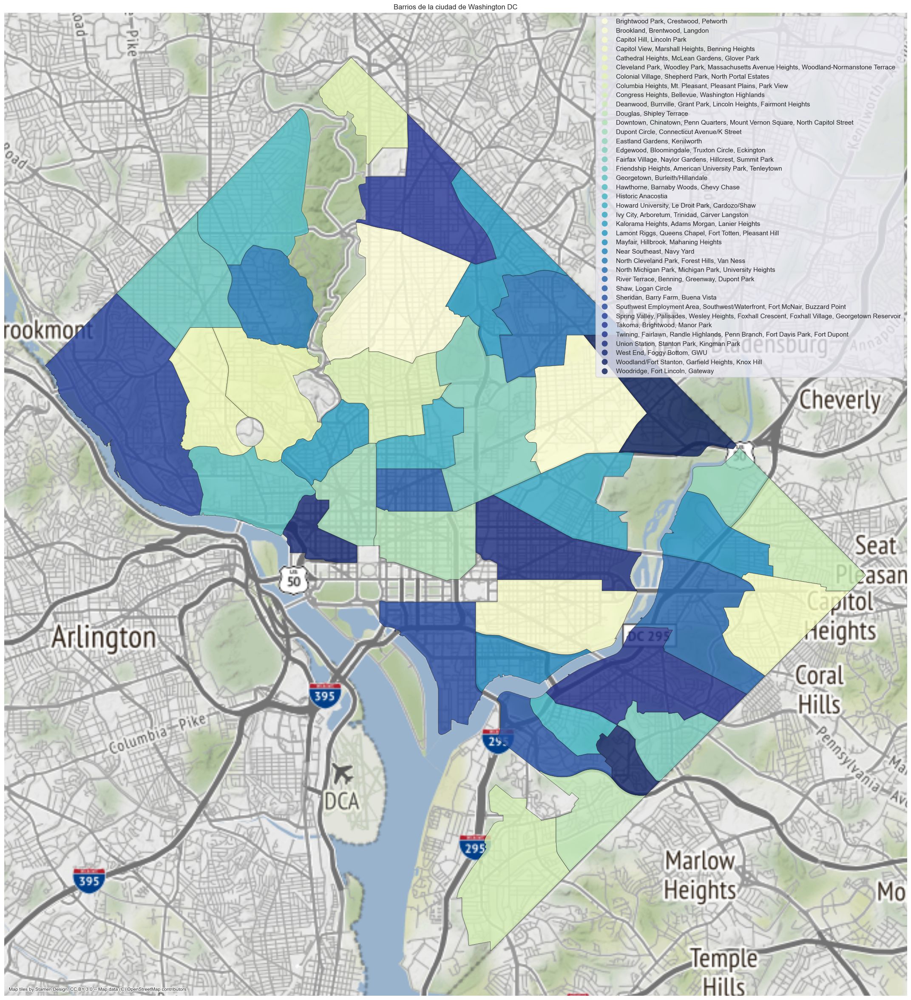

In [100]:
# cmap = 'Greys', 'Purples', 'Blues', 'Greens', 'Oranges', 'Reds', 'YlOrBr', 'YlOrRd', 'OrRd', 'PuRd', 'RdPu', 'BuPu', 'GnBu', 'PuBu', 'YlGnBu', 'PuBuGn', 'BuGn', 'YlGn'

tmp_map = vecindarios_airbnb.copy()
tmp_map = tmp_map.to_crs(epsg=3857)
fig, ax = plt.subplots(figsize=(50,30), subplot_kw={'aspect':'equal'})
ax = tmp_map.plot(column='neighbourhood', cmap='YlGnBu', legend=True, ax=ax, alpha=0.8, edgecolor='k',  linewidth=0.5, categorical=True)
ctx.add_basemap(ax, url=ctx.providers.Stamen.TonerLite)
ax.set_axis_off()
plt.title("Barrios de la ciudad de Washington DC")

Promedio de precios de alojamientos de Airbnb por barrio en la ciudad de Washington DC

Text(0.5, 1.0, 'Promedio de precios de alojamientos de Airbnb por barrio en la ciudad de Washington DC')

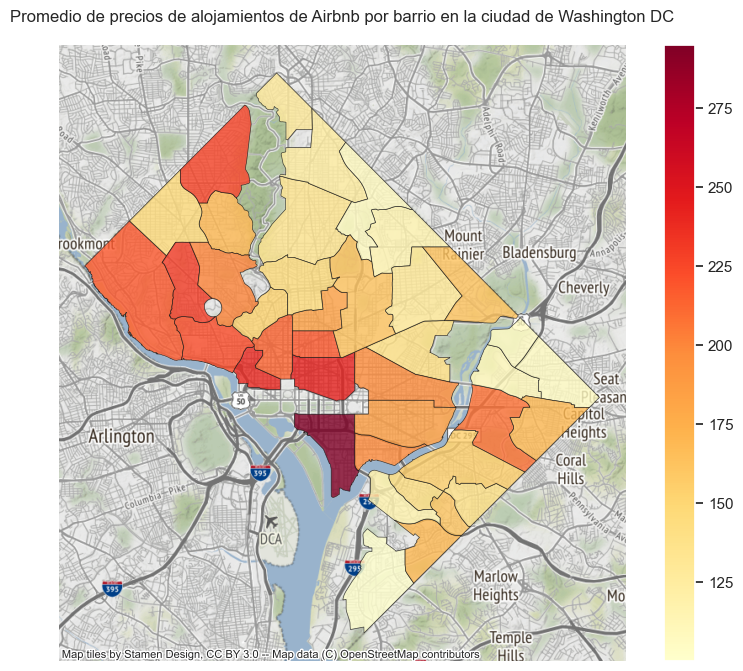

In [101]:
tmp_map = vecindarios_airbnb.copy()
tmp_map = tmp_map.to_crs(epsg=3857)
#legend_kwds={'label': 'FOO', 'shrink': 0.5},
fig, ax = plt.subplots(figsize=(10,8), subplot_kw={'aspect':'equal'})
ax = tmp_map.plot(column='price_mean', cmap='YlOrRd', legend=True, ax=ax, alpha=0.8, edgecolor='k',  linewidth=0.5)
ctx.add_basemap(ax, url=ctx.providers.Stamen.TonerLite)
ax.set_axis_off()
plt.title("Promedio de precios de alojamientos de Airbnb por barrio en la ciudad de Washington DC")

Puntaje promedio de alojamientos de Airbnb por barrio en la ciudad de Washington DC

Text(0.5, 1.0, 'Puntaje promedio de alojamientos de Airbnb por barrio en la ciudad de Washington DC')

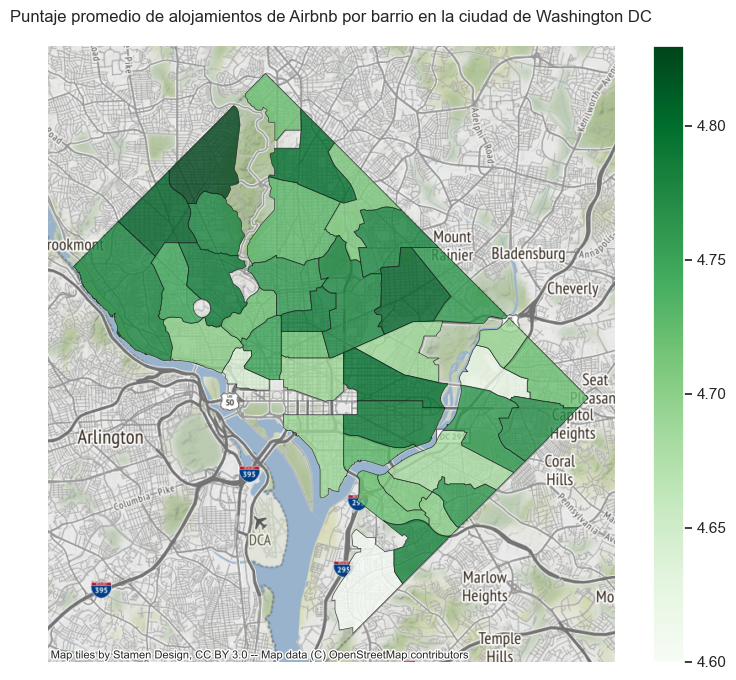

In [102]:
# cmap = 'Greys', 'Purples', 'Blues', 'Greens', 'Oranges', 'Reds', 'YlOrBr', 'YlOrRd', 'OrRd', 'PuRd', 'RdPu', 'BuPu', 'GnBu', 'PuBu', 'YlGnBu', 'PuBuGn', 'BuGn', 'YlGn'
tmp_map = vecindarios_airbnb.copy()
tmp_map = tmp_map.to_crs(epsg=3857)

fig, ax = plt.subplots(figsize=(10,8), subplot_kw={'aspect':'equal'})
ax = tmp_map.plot(column='review_scores_rating_mean', cmap='Greens', legend=True, ax=ax, alpha=0.8, edgecolor='k',  linewidth=0.5)
ctx.add_basemap(ax, url=ctx.providers.Stamen.TonerLite)
ax.set_axis_off()
plt.title("Puntaje promedio de alojamientos de Airbnb por barrio en la ciudad de Washington DC")

Promedio de disponibilidad por barrio en la ciudad de Washington DC

Text(0.5, 1.0, 'Promedio de disponibilidad por barrio en la ciudad de Washington DC')

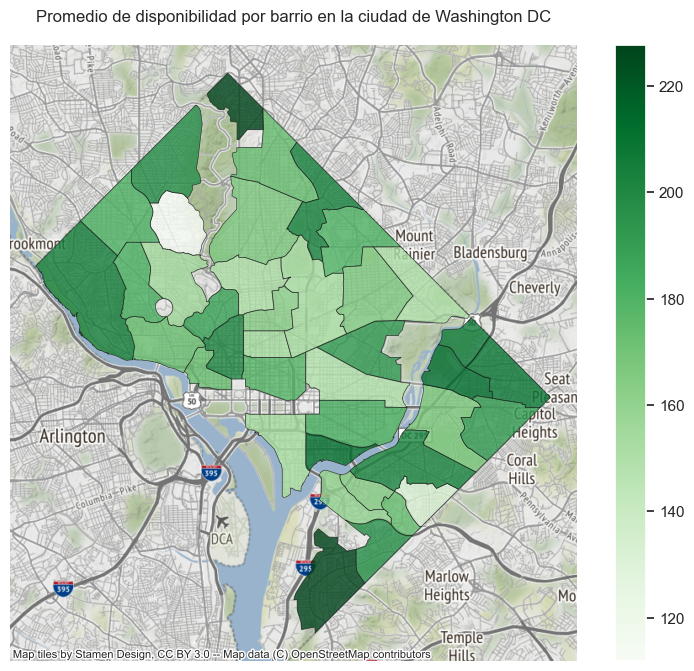

In [103]:
# cmap = 'Greys', 'Purples', 'Blues', 'Greens', 'Oranges', 'Reds', 'YlOrBr', 'YlOrRd', 'OrRd', 'PuRd', 'RdPu', 'BuPu', 'GnBu', 'PuBu', 'YlGnBu', 'PuBuGn', 'BuGn', 'YlGn'
tmp_map = vecindarios_airbnb.copy()
tmp_map = tmp_map.to_crs(epsg=3857)

fig, ax = plt.subplots(figsize=(10,8), subplot_kw={'aspect':'equal'})
ax = tmp_map.plot(column='availability_365_mean', cmap='Greens', legend=True, ax=ax, alpha=0.8, edgecolor='k',  linewidth=0.5)
ctx.add_basemap(ax, url=ctx.providers.Stamen.TonerLite)
ax.set_axis_off()
plt.title("Promedio de disponibilidad por barrio en la ciudad de Washington DC")

Promedio de noches mínimas para hacer reserva por barrio en la ciudad de Washington DC

Text(0.5, 1.0, 'Promedio de noches mínimas para hacer reserva por barrio en la ciudad de Washington DC')

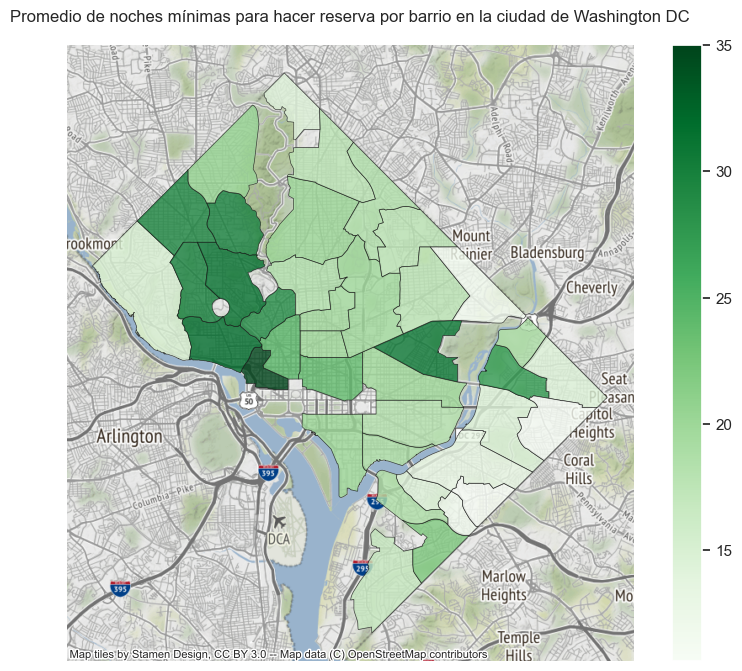

In [104]:
# cmap = 'Greys', 'Purples', 'Blues', 'Greens', 'Oranges', 'Reds', 'YlOrBr', 'YlOrRd', 'OrRd', 'PuRd', 'RdPu', 'BuPu', 'GnBu', 'PuBu', 'YlGnBu', 'PuBuGn', 'BuGn', 'YlGn'
tmp_map = vecindarios_airbnb.copy()
tmp_map = tmp_map.to_crs(epsg=3857)

fig, ax = plt.subplots(figsize=(10,8), subplot_kw={'aspect':'equal'})
ax = tmp_map.plot(column='minimum_nights_mean', cmap='Greens', legend=True, ax=ax, alpha=0.8, edgecolor='k',  linewidth=0.5)
ctx.add_basemap(ax, url=ctx.providers.Stamen.TonerLite)
ax.set_axis_off()
plt.title("Promedio de noches mínimas para hacer reserva por barrio en la ciudad de Washington DC")

Número total de barrios

In [105]:
vecindarios_airbnb["neighbourhood"].count()

39

Cantidad de alojamientos por barrio

In [106]:
# Barrios 
alojamientos_gdf.groupby(['neighbourhood_cleansed'], as_index=False)["id"].count().sort_values(by = 'id', ascending=False)

,neighbourhood_cleansed,id
2,"Capitol Hill, Lincoln Park",561
35,"Union Station, Stanton Park, Kingman Park",550
7,"Columbia Heights, Mt. Pleasant, Pleasant Plains, Park View",456
12,"Dupont Circle, Connecticut Avenue/K Street",450
29,"Shaw, Logan Circle",395
14,"Edgewood, Bloomingdale, Truxton Circle, Eckington",386
17,"Georgetown, Burleith/Hillandale",320
0,"Brightwood Park, Crestwood, Petworth",316
11,"Downtown, Chinatown, Penn Quarters, Mount Vernon Square, North Capitol Street",253
20,"Howard University, Le Droit Park, Cardozo/Shaw",225


Estadísticas por barrio

In [107]:
tmp = vecindarios_airbnb[['neighbourhood', 'price_mean', 'conteo_alojamientos', 'review_scores_rating_mean', 'minimum_nights_mean', 'availability_365_mean']].sort_values(by = 'review_scores_rating_mean', ascending=False)
tmp.rename(columns={'neighbourhood': 'Barrio', 'conteo_alojamientos': 'Total de alojamientos', 'price_mean': 'Precio promedio', 'review_scores_rating_mean': 'Calificación promedio', 'minimum_nights_mean': 'Noches mínimas promedio', 'availability_365_mean': 'Disponibilidad promedio'}, inplace=True)
tmp.head(55)

,Barrio,Precio promedio,Total de alojamientos,Calificación promedio,Noches mínimas promedio,Disponibilidad promedio
25,"Hawthorne, Barnaby Woods, Chevy Chase",226.71,68,4.83,20.66,197.90
21,"Friendship Heights, American University Park, Tenleytown",146.12,83,4.81,29.49,181.29
34,"Brookland, Brentwood, Langdon",129.82,94,4.81,17.83,166.73
22,"Takoma, Brightwood, Manor Park",124.57,179,4.80,17.81,173.55
30,"Union Station, Stanton Park, Kingman Park",197.80,550,4.80,19.91,149.10
38,"Capitol Hill, Lincoln Park",186.47,561,4.79,18.30,182.42
37,"Cleveland Park, Woodley Park, Massachusetts Avenue Heights, Woodland-Normanstone Terrace",201.11,53,4.79,31.57,154.98
16,"Howard University, Le Droit Park, Cardozo/Shaw",184.34,225,4.79,19.71,164.25
11,"Spring Valley, Palisades, Wesley Heights, Foxhall Crescent, Foxhall Village, Georgetown Reservoir",218.46,153,4.78,15.14,205.08
18,"North Michigan Park, Michigan Park, University Heights",115.63,67,4.78,17.78,180.61


Cantidad de alojamientos por tipo de habitación por barrio

In [108]:
tmp = alojamientos_gdf.groupby(['neighbourhood_cleansed','room_type'], as_index=False)['id'].count().sort_values(by = 'id', ascending=False)
tmp.head(10)

,neighbourhood_cleansed,room_type,id
5,"Capitol Hill, Lincoln Park",Entire home/apt,464
94,"Union Station, Stanton Park, Kingman Park",Entire home/apt,462
33,"Dupont Circle, Connecticut Avenue/K Street",Entire home/apt,368
20,"Columbia Heights, Mt. Pleasant, Pleasant Plains, Park View",Entire home/apt,334
38,"Edgewood, Bloomingdale, Truxton Circle, Eckington",Entire home/apt,301
77,"Shaw, Logan Circle",Entire home/apt,287
45,"Georgetown, Burleith/Hillandale",Entire home/apt,253
0,"Brightwood Park, Crestwood, Petworth",Entire home/apt,219
97,"West End, Foggy Bottom, GWU",Entire home/apt,209
30,"Downtown, Chinatown, Penn Quarters, Mount Vernon Square, North Capitol Street",Entire home/apt,206


Diagrama de dispersión de latitud vs longitud

Text(0.5, 1.0, 'Latitud vs Longitud')

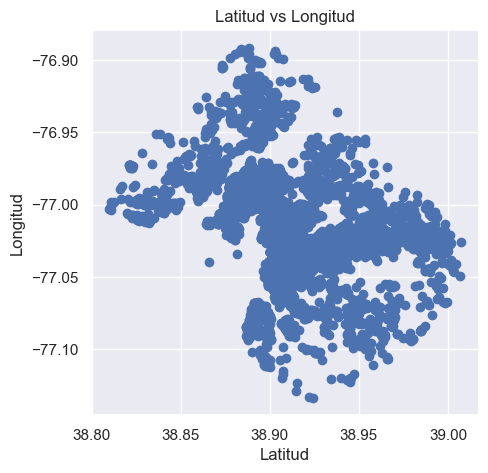

In [109]:
plt.figure(figsize=(5,5))
plt.scatter(x = alojamientos_gdf["latitude"], y = alojamientos_gdf["longitude"])
plt.xlabel('Latitud', fontsize=12)
plt.ylabel('Longitud', fontsize=12)
plt.title('Latitud vs Longitud')

**Mapas interactivos**

In [110]:
def definir_color(feature):
    value = valores_precio.get(feature['properties']['neighbourhood'])
    return color(value)

Mapa de cantidad de alojamientos por barrios en la ciudad de Washington DC

In [111]:
titulo = 'Mapa de cantidad de alojamientos por barrios en la ciudad de Washington DC'
valor = 'conteo_alojamientos'
valores_precio = vecindarios_airbnb.set_index('neighbourhood')[valor].to_dict()
color = LinearColormap(['yellow','red'], vmin = min(valores_precio.values()), vmax = max(valores_precio.values()))
fig = folium.Figure(width=800, height=650)
mapa_precios = folium.Map(location=[38.91545, -77.0305], zoom_start = 12) 
folium.GeoJson(data = vecindarios_airbnb, name='Washington DC', tooltip=folium.features.GeoJsonTooltip(fields=['neighbourhood', 'price_mean', 'conteo_alojamientos', 'review_scores_rating_mean', 'minimum_nights_mean', 'availability_365_mean'],labels=True,sticky=False), style_function = lambda feature: {'fillColor': definir_color(feature),'color': 'black','weight': 0.5,'dashArray': '3, 3','fillOpacity':0.7},highlight_function=lambda feature: {'weight': 4, 'fillColor': definir_color(feature), 'fillOpacity': 0.4}).add_to(mapa_precios)
title_html = """<h3 align="center" style="font-size:16px"><b>"""+titulo+"""</b></h3>"""
fig.get_root().html.add_child(folium.Element(title_html))                
fig.add_child(mapa_precios)

Mapa de precios de alojamientos por barrios en la ciudad de Washington DC

In [112]:
titulo = 'Mapa de precios promedios de alojamientos por barrios en la ciudad de Washington DC'
valor = 'price_mean'
valores_precio = vecindarios_airbnb.set_index('neighbourhood')[valor].to_dict()
color = LinearColormap(['yellow','red'], vmin = min(valores_precio.values()), vmax = max(valores_precio.values()))
fig = folium.Figure(width=800, height=650)
mapa_precios = folium.Map(location=[38.91545, -77.0305], zoom_start = 12) 
folium.GeoJson(data = vecindarios_airbnb, name='Washington DC', tooltip=folium.features.GeoJsonTooltip(fields=['neighbourhood', 'price_mean', 'conteo_alojamientos', 'review_scores_rating_mean', 'minimum_nights_mean', 'availability_365_mean'],labels=True,sticky=False), style_function = lambda feature: {'fillColor': definir_color(feature),'color': 'black','weight': 0.5,'dashArray': '3, 3','fillOpacity':0.7},highlight_function=lambda feature: {'weight': 4, 'fillColor': definir_color(feature), 'fillOpacity': 0.4}).add_to(mapa_precios)
title_html = """<h3 align="center" style="font-size:16px"><b>"""+titulo+"""</b></h3>"""
fig.get_root().html.add_child(folium.Element(title_html))                
fig.add_child(mapa_precios)

In [113]:
titulo = 'Mapa de calificaciones promedios de alojamientos por barrios en la ciudad de Washington DC'
valor = 'review_scores_rating_mean'
valores_precio = vecindarios_airbnb.set_index('neighbourhood')[valor].to_dict()
color = LinearColormap(['yellow','green'], vmin = min(valores_precio.values()), vmax = max(valores_precio.values()))
fig = folium.Figure(width=800, height=650)
mapa_precios = folium.Map(location=[38.91545, -77.0305], zoom_start = 12) 
folium.GeoJson(data = vecindarios_airbnb, name='Washington DC', tooltip=folium.features.GeoJsonTooltip(fields=['neighbourhood', 'price_mean', 'conteo_alojamientos', 'review_scores_rating_mean', 'minimum_nights_mean', 'availability_365_mean'],labels=True,sticky=False), style_function = lambda feature: {'fillColor': definir_color(feature),'color': 'black','weight': 0.5,'dashArray': '3, 3','fillOpacity':0.7},highlight_function=lambda feature: {'weight': 4, 'fillColor': definir_color(feature), 'fillOpacity': 0.4}).add_to(mapa_precios)
title_html = """<h3 align="center" style="font-size:16px"><b>"""+titulo+"""</b></h3>"""
fig.get_root().html.add_child(folium.Element(title_html))                
fig.add_child(mapa_precios)

## Características de servicios adicionales

**Amenities**

In [114]:
for amenidad in variables_amenidades:
    tmp_res = alojamientos_gdf.groupby([amenidad], as_index=False).agg(
        cantidad = ("price", "count"),
        precio_promedio = ("price", "mean")
    )
    print(tmp_res)

   has_Breakfast  cantidad  precio_promedio
0              0      6051       179.974054
1              1       419       168.052506
   has_Washer  cantidad  precio_promedio
0           0      3003       166.318348
1           1      3467       190.361408
   has_Dishwasher  cantidad  precio_promedio
0               0      3245       163.036055
1               1      3225       195.468217
   has_Dryer  cantidad  precio_promedio
0          0      3257       170.868284
1          1      3213       187.649860
   has_TV  cantidad  precio_promedio
0       0      3325       172.832782
1       1      3145       185.935771
   has_Freezer  cantidad  precio_promedio
0            0      4562       179.737396
1            1      1908       177.921908
   has_Airconditioning  cantidad  precio_promedio
0                    0      1884       176.057856
1                    1      4586       180.493676
   has_Heating  cantidad  precio_promedio
0            0      1401       183.599572
1            1     

## Características de calificación del huésped

In [115]:
print("Cantidad de alojamientos con calificaciones menores a 4: ", alojamientos_gdf[alojamientos_gdf['review_scores_rating'] < 4]['id'].count())
print("Cantidad de alojamientos con calificaciones mayores o iguales a 4: ", alojamientos_gdf[alojamientos_gdf['review_scores_rating'] >= 4]['id'].count())

Cantidad de alojamientos con calificaciones menores a 4:  138
Cantidad de alojamientos con calificaciones mayores o iguales a 4:  6332


**Scores**

In [116]:
tmp = alojamientos_gdf.groupby(['property_type'], as_index=False)['review_scores_rating'].mean().sort_values(by = 'review_scores_rating', ascending=False)
tmp.head(10)

,property_type,review_scores_rating
1,Camper/RV,5.000000
17,Floor,4.960000
22,Private room in casa particular,4.920000
18,Houseboat,4.920000
3,Casa particular,4.914843
8,Entire guesthouse,4.895561
7,Entire guest suite,4.838808
0,Boat,4.830000
19,Private room,4.829686
39,Room in serviced apartment,4.815000


In [117]:
tmp = alojamientos_gdf.groupby(['room_type'], as_index=False)['number_of_reviews'].count().sort_values(by = 'number_of_reviews', ascending=False)
tmp.head()

,room_type,number_of_reviews
0,Entire home/apt,4915
2,Private room,1425
3,Shared room,110
1,Hotel room,20


<AxesSubplot: xlabel='number_of_reviews', ylabel='Count'>

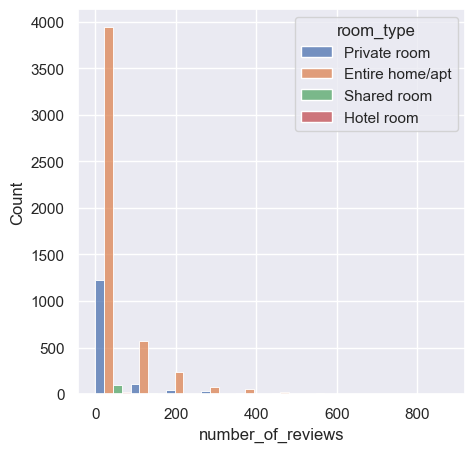

In [118]:
sns.histplot(alojamientos_gdf, x=alojamientos_gdf['number_of_reviews'], bins=10, hue="room_type", multiple="dodge") #, discrete=True)#, bins=20) #, binwidth=1) , element="step"


Text(0.5, 1.0, 'Número de reviews por tipo de habitación')

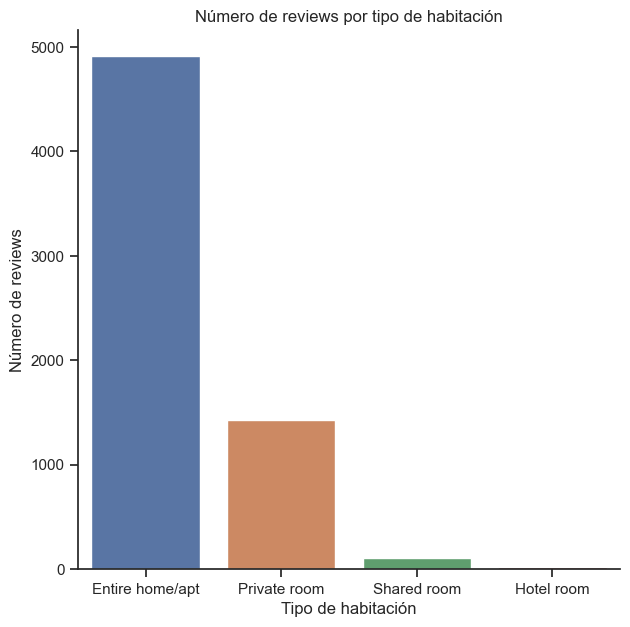

In [119]:
sns.set(rc={'figure.figsize':(7,7)})
custom_params = {"axes.spines.right": False, "axes.spines.top": False}
sns.set_theme(style="ticks", rc=custom_params)
ax = sns.barplot(x='room_type', y='number_of_reviews', data=tmp) 

plt.xlabel('Tipo de habitación')
plt.ylabel('Número de reviews')
plt.title('Número de reviews por tipo de habitación')

Text(0.5, 1.0, 'Promedio de calificaciones por tipo de habitación')

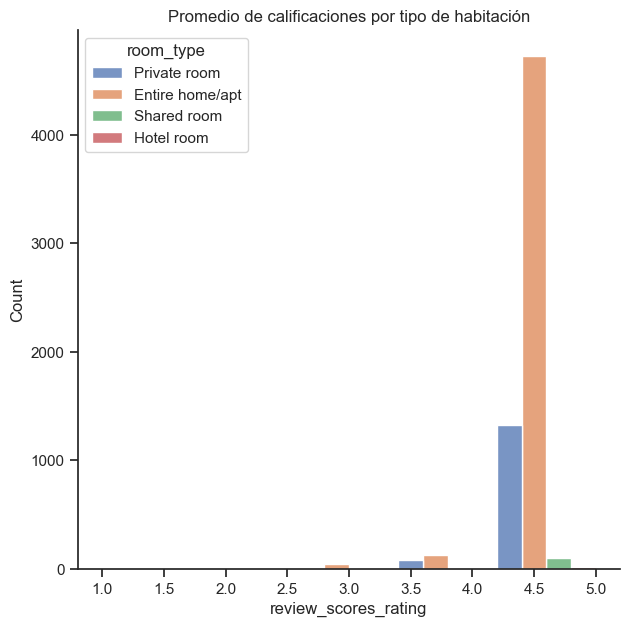

In [120]:
ax = sns.histplot(alojamientos_gdf, x=alojamientos_gdf['review_scores_rating'], bins=5, hue="room_type", multiple="dodge") #, discrete=True)#, bins=20) #, binwidth=1) , element="step"
plt.title('Promedio de calificaciones por tipo de habitación')

In [121]:
tmp = alojamientos_gdf.groupby(['room_type'], as_index=False)['review_scores_rating'].mean().sort_values(by = 'review_scores_rating', ascending=False)
tmp.head()

,room_type,review_scores_rating
0,Entire home/apt,4.761705
2,Private room,4.698101
3,Shared room,4.611762
1,Hotel room,4.562000


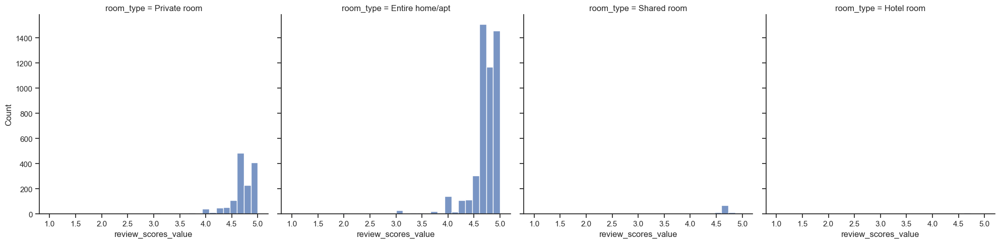

In [122]:
sns.displot(alojamientos_gdf, x=alojamientos_gdf['review_scores_value'], bins=30, col="room_type") 

## Características del host

**HOST**

Text(0.5, 1.0, 'El host tiene imagen de perfil')

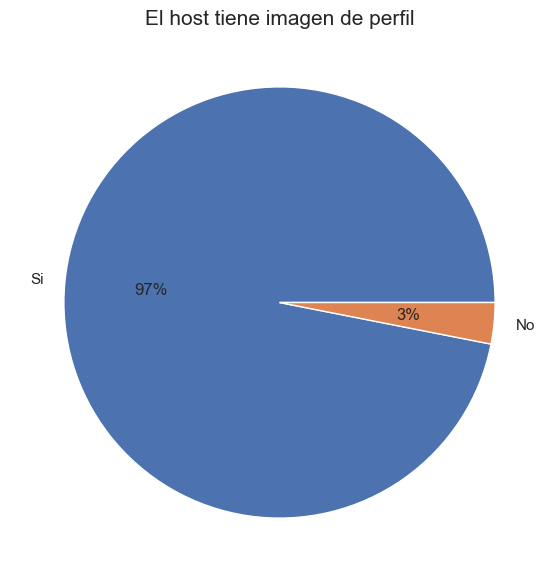

In [123]:
sns.set(rc={'figure.figsize':(7,7)})
tmp = alojamientos_gdf.groupby(['host_has_profile_pic'], as_index=False)['id'].count().sort_values(by = 'id', ascending=False)
tmp['host_has_profile_pic'] = tmp['host_has_profile_pic'].replace(to_replace=[1, 0], value=["Si", "No"])
plt.pie(tmp["id"], labels = tmp["host_has_profile_pic"], autopct='%.0f%%') #, pctdistance=0.5)
plt.title('El host tiene imagen de perfil', fontsize=15)

Text(0.5, 1.0, 'Host es superhost')

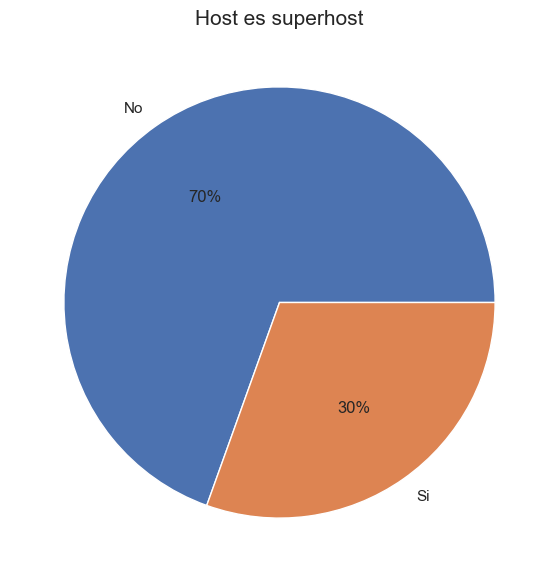

In [124]:
sns.set(rc={'figure.figsize':(7,7)})
tmp = alojamientos_gdf.groupby(['host_is_superhost'], as_index=False)['id'].count().sort_values(by = 'id', ascending=False)
tmp['host_is_superhost'] = tmp['host_is_superhost'].replace(to_replace=[1, 0], value=["Si", "No"])
plt.pie(tmp["id"], labels = tmp["host_is_superhost"], autopct='%.0f%%') #, pctdistance=0.5)
plt.title('Host es superhost', fontsize=15)

Text(0.5, 1.0, 'Identidad de los hosts')

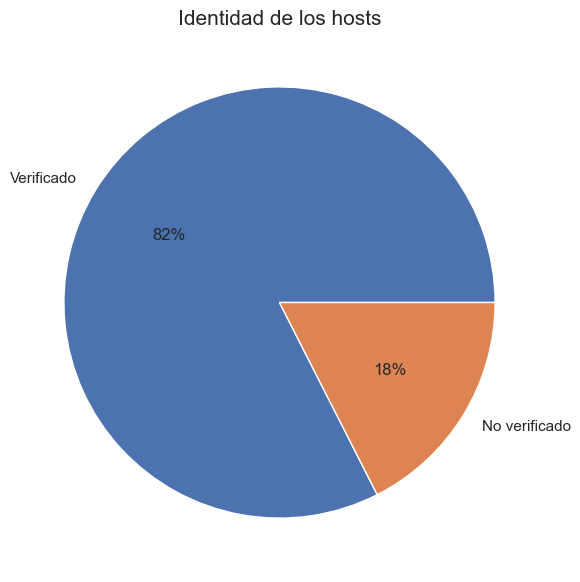

In [125]:
sns.set(rc={'figure.figsize':(7,7)})
tmp = alojamientos_gdf.groupby(['host_identity_verified'], as_index=False)['id'].count().sort_values(by = 'id', ascending=False)
tmp['host_identity_verified'] = tmp['host_identity_verified'].replace(to_replace=[1, 0], value=["Verificado", "No verificado"])
plt.pie(tmp["id"], labels = tmp["host_identity_verified"], autopct='%.0f%%') #, pctdistance=0.5)
plt.title('Identidad de los hosts', fontsize=15)

Text(0.5, 1.0, 'Tasa de aceptación del host de las reservas de los huéspedes')

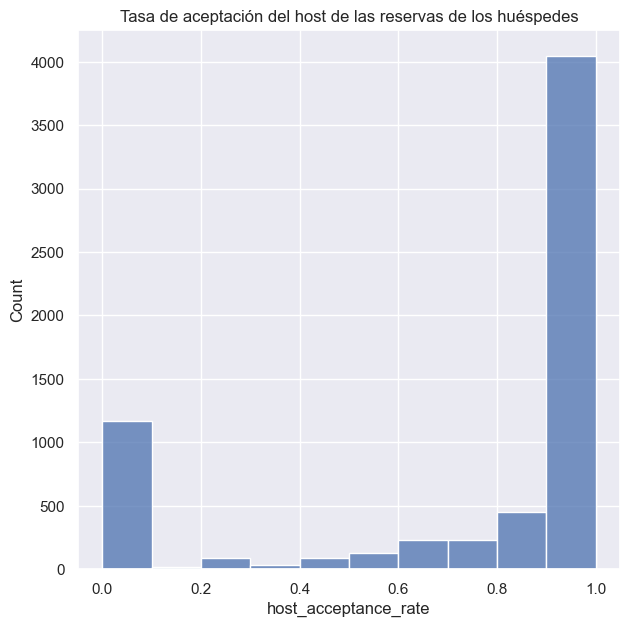

In [126]:
ax = sns.histplot(alojamientos_gdf, x=alojamientos_gdf['host_acceptance_rate'],bins=10) 
plt.title('Tasa de aceptación del host de las reservas de los huéspedes')

Text(0.5, 1.0, 'Tiempo de respuesta del host')

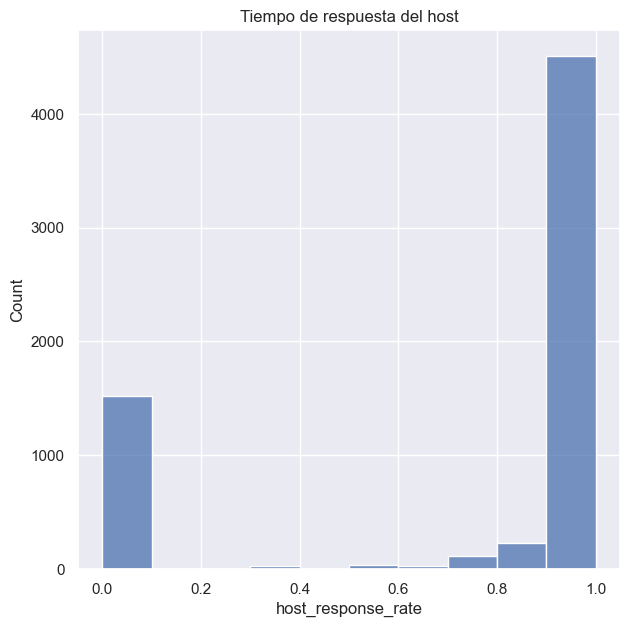

In [127]:
ax = sns.histplot(alojamientos_gdf, x=alojamientos_gdf['host_response_rate'],bins=10) 
plt.title('Tiempo de respuesta del host')

In [128]:
alojamientos_gdf.groupby(["host_identity_verified"],as_index=False).agg(
    cantidad = ("price", "count"),
     precio_promedio = ("price", "mean")
)

,host_identity_verified,cantidad,precio_promedio
0,0,1133,192.335393
1,1,5337,176.413903


In [129]:
alojamientos_gdf.groupby(["host_is_superhost"],as_index=False).agg(
    cantidad = ("price", "count"),
    precio_promedio = ("price", "mean")
)

,host_is_superhost,cantidad,precio_promedio
0,0,4498,179.969320
1,1,1972,177.451826


In [130]:
alojamientos_gdf.groupby(["host_has_profile_pic"],as_index=False).agg(
    cantidad = ("price", "count"),
     precio_promedio = ("price", "mean")
)

,host_has_profile_pic,cantidad,precio_promedio
0,0,200,143.880000
1,1,6270,180.328708


# **Selección de características**

Se elegirán aquellas características más relevantes para el modelo.

In [131]:
tmp_caracteristicas = [
    
# variable dependiente
'log_price',

# características del alojamiento
'shared_room',
'hotel_room',
'entire_home_apt',
'accommodates', 
'bedrooms',  
'beds', 
'bathrooms_quantity', 
'minimum_nights',
'instant_bookable', 
'availability_365', 

# Características de servicios adicionales
'has_Breakfast',
'has_Washer', 
'has_Dishwasher',
'has_TV', 
'has_Freezer', 
'has_Airconditioning', 
'has_Hotwater', 
'has_Cleaningproducts',
'has_Wifi', 
'has_Hairdryer',
'has_Kitchen', 
'has_Dedicatedworkspace', 
'has_Petsallowed', 
'has_Pool', 
'has_Freestreetparking', 
'has_Freeparkingonpremises',
'has_Smokealarm', 
'has_Securitycamerasonproperty', 
'has_Gym',

# Características de calificaciones del huesped
'number_of_reviews', 
'review_scores_rating', 
'review_scores_accuracy', 
'review_scores_cleanliness',
'review_scores_checkin', 
'review_scores_communication',
'review_scores_location',
'review_scores_value',

# Caracteristicas del host
'host_response_time_hour',
'host_about', 
'host_is_superhost', 
'host_verifications', 
'host_has_profile_pic', 
'host_identity_verified',
'host_acceptance_rate', 
'calculated_host_listings_count',

# Caracteristicas de ubicación
'min_dist_to_bank_ft', 
#'min_dist_to_recreation_ft', 
'min_dist_to_metro_bus_stop_ft',
'min_dist_to_points_interest_ft',
'min_dist_to_white_house_ft',
#'min_dist_to_lincoln_memorial_ft',
'min_dist_to_national_space_museum_ft',
#'min_dist_to_washington_memorial_ft',
'min_dist_to_national_zoo_ft'
#'min_dist_to_crime_incident_ft'

]

In [132]:
alojamientos_gdf[tmp_caracteristicas].describe()

,log_price,shared_room,hotel_room,entire_home_apt,accommodates,bedrooms,beds,bathrooms_quantity,minimum_nights,instant_bookable,availability_365,has_Breakfast,has_Washer,has_Dishwasher,has_TV,has_Freezer,has_Airconditioning,has_Hotwater,has_Cleaningproducts,has_Wifi,has_Hairdryer,has_Kitchen,has_Dedicatedworkspace,has_Petsallowed,has_Pool,has_Freestreetparking,has_Freeparkingonpremises,has_Smokealarm,has_Securitycamerasonproperty,has_Gym,number_of_reviews,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,host_response_time_hour,host_about,host_is_superhost,host_verifications,host_has_profile_pic,host_identity_verified,host_acceptance_rate,calculated_host_listings_count,min_dist_to_bank_ft,min_dist_to_metro_bus_stop_ft,min_dist_to_points_interest_ft,min_dist_to_white_house_ft,min_dist_to_national_space_museum_ft,min_dist_to_national_zoo_ft
count,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000
mean,4.890789,0.017002,0.003091,0.759660,3.659815,1.523493,1.960278,1.383972,21.409583,0.409583,175.436167,0.064760,0.535858,0.498454,0.486090,0.294900,0.708810,0.757960,0.283617,0.911128,0.783771,0.888253,0.476507,0.001391,0.051777,0.436167,0.329057,0.968006,0.290881,0.129366,49.630603,4.744529,4.805537,4.758478,4.861066,4.844605,4.788156,4.704296,3.558269,0.628594,0.304791,2.117311,0.969088,0.824884,0.745906,23.577125,2237.188806,434.585111,541.979664,14114.563116,14798.973365,15799.359074
std,0.691090,0.129287,0.055517,0.427323,2.346814,0.935047,1.375806,0.750768,40.722161,0.491795,134.241025,0.246122,0.498751,0.500036,0.499845,0.456033,0.454346,0.428352,0.450788,0.284580,0.411704,0.315079,0.499486,0.037274,0.221594,0.495947,0.469907,0.175997,0.454204,0.335631,83.457280,0.337108,0.311873,0.323868,0.291337,0.307193,0.300982,0.345816,7.019170,0.483218,0.460355,0.528074,0.173092,0.380096,0.378428,54.514546,2077.968964,358.265196,1145.431057,8317.530366,8222.305830,9043.096788
min,2.302585,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,0.500000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,1.000000,8.176257,2.767062,0.620009,968.812741,2061.859174,409.169437
25%,4.454347,0.000000,0.000000,1.000000,2.000000,1.000000,1.000000,1.000000,2.000000,0.000000,41.250000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,2.000000,4.730000,4.805537,4.750000,4.861066,4.844605,4.780000,4.680000,1.000000,0.000000,0.000000,2.000000,1.000000,1.000000,0.660000,1.000000,841.068420,216.575280,90.788488,7751.037051,8985.462527,8788.843759
50%,4.828314,0.000000,0.000000,1.000000,3.000000,1.000000,2.000000,1.000000,14.000000,0.000000,163.000000,0.000000,1.000000,0.000000,0.000000,0.000000,1.000000,1.000000,0.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,14.000000,4.790000,4.860000,4.805000,4.920000,4.910000,4.830000,4.740000,1.000000,1.000000,0.000000,2.000000,1.000000,1.000000,0.960000,2.000000,1564.923470,354.119779,170.

In [133]:
alojamientos_gdf[tmp_caracteristicas].head(10)

,log_price,shared_room,hotel_room,entire_home_apt,accommodates,bedrooms,beds,bathrooms_quantity,minimum_nights,instant_bookable,availability_365,has_Breakfast,has_Washer,has_Dishwasher,has_TV,has_Freezer,has_Airconditioning,has_Hotwater,has_Cleaningproducts,has_Wifi,has_Hairdryer,has_Kitchen,has_Dedicatedworkspace,has_Petsallowed,has_Pool,has_Freestreetparking,has_Freeparkingonpremises,has_Smokealarm,has_Securitycamerasonproperty,has_Gym,number_of_reviews,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,host_response_time_hour,host_about,host_is_superhost,host_verifications,host_has_profile_pic,host_identity_verified,host_acceptance_rate,calculated_host_listings_count,min_dist_to_bank_ft,min_dist_to_metro_bus_stop_ft,min_dist_to_points_interest_ft,min_dist_to_white_house_ft,min_dist_to_national_space_museum_ft,min_dist_to_national_zoo_ft
0,4.204693,0,0,0,1.0,1,1,1.0,31,0,306,0,1,1,0,0,0,1,0,1,0,1,0,0,0,1,0,1,0,0,81,4.63,4.72,4.43,4.90,4.83,3.86,4.62,24,1,0,3,1,1,1.00,1,536.960103,447.137720,409.303462,18445.135222,12621.584789,29671.409624
1,3.663562,0,0,0,1.0,1,1,2.0,31,0,46,0,0,0,0,0,0,1,0,1,0,1,1,0,0,0,0,1,0,0,14,4.43,4.36,3.93,4.86,4.86,4.57,4.29,3,1,0,2,1,1,0.48,46,1499.303227,249.332046,201.834585,14878.501030,17878.989571,7216.049775
2,4.317488,0,0,0,3.0,1,2,1.0,1,0,298,0,0,1,0,1,0,1,1,1,1,1,1,0,0,1,0,1,1,0,443,4.82,4.88,4.91,4.94,4.90,4.55,4.74,1,1,1,2,1,1,0.76,4,1775.922417,229.894550,144.385924,10486.545887,9685.391517,13984.115705
3,5.521461,0,0,1,2.0,1,1,1.5,31,0,90,0,1,1,0,1,1,1,0,1,1,1,0,0,1,0,0,0,0,1,69,4.78,4.85,4.69,4.51,4.66,4.96,4.67,24,1,1,2,1,1,0.93,1,1648.678886,356.193457,143.253040,5786.821335,4056.820759,14582.462534
4,4.727388,0,0,0,3.0,1,2,1.0,1,0,134,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,0,1,1,0,464,4.73,4.81,4.85,4.87,4.87,4.94,4.70,1,1,0,3,1,1,1.00,4,615.566309,162.228176,5.960452,4521.775794,10263.471048,8383.875723
5,3.555348,0,0,0,1.0,1,1,3.0,31,0,250,0,0,0,0,0,0,1,0,1,0,1,1,0,0,0,0,1,0,0,18,4.50,4.56,4.25,4.94,4.75,5.00,4.50,3,1,0,2,1,1,0.48,46,2069.650826,643.448027,24.797005,9577.066379,10892.507018,10352.984792
6,4.174387,0,0,0,2.0,1,1,1.0,31,0,299,0,1,1,0,1,0,1,1,1,1,1,0,0,0,1,1,1,0,0,22,4.82,4.82,4.82,4.86,4.77,4.10,4.71,24,1,0,3,1,1,0.50,4,1152.494655,379.365001,40.305529,23963.188519,18240.930681,35439.762338
7,4.787492,0,0,1,3.0,1,1,1.0,31,0,0,0,1,1,1,0,1,0,1,1,1,1,1,0,0,1,0,1,0,0,18,4.83,4.83,4.78,5.00,5.00,4.94,4.94,3,1,0,2,1,1,1.00,1,1104.663666,1158.544230,135.272208,10221.004162,4465.067187,20775.438637
8,4.672829,0,0,1,3.0,1,2,1.0,1,0,240,0,0,0,0,0,0,1,0,1,1,1,1,0,0,1,1,1,1,0,43,4.57,4.83,4.86,4.86,4.95,4.71,4.64,1,1,0,3,1,1,1.00,1,6237.122046,510.844782,635.371788,23504.501648,24799.563048,17018.269691
9,5.857933,0,0,1,6.0,3,5,2.5,3,0,0,0,0,1,0,1,0,1,0,0,1,1,1,0,0,1,1,1,1,0,34,4.91,4.94,4.90,4.87,4.97,4.90,4.65,1,1,1,3,1,0,1.00,1,3001.219685,963.073751,461.768134,14009.840484,18664.100400,1905.019234


<AxesSubplot: >

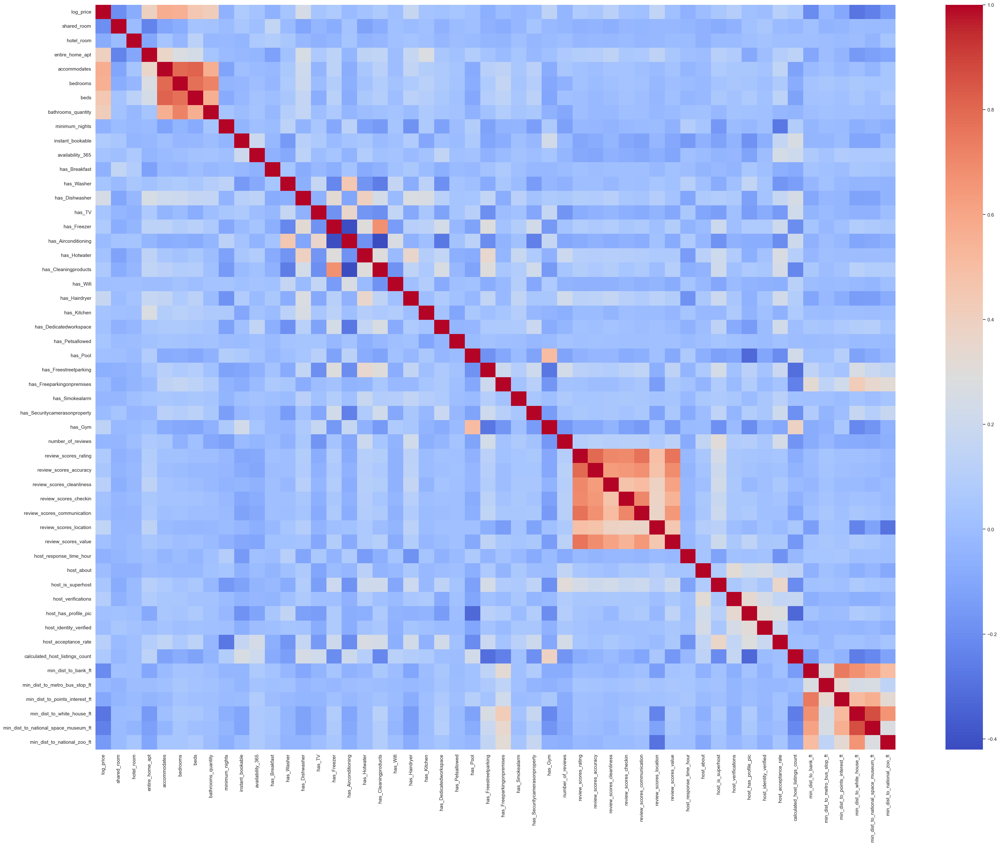

In [134]:
plt.rcParams.update({'font.size': 10})
hfig, axes = plt.subplots(figsize=(40,30))  
sns.heatmap(alojamientos_gdf[tmp_caracteristicas].corr(), ax = axes, cmap = 'coolwarm', annot=False) 

# **Modelos de regresión**

Normalización de los datos

In [135]:
tmp_mms_alojamientos_gdf = MinMaxScaler().fit_transform(alojamientos_gdf[tmp_caracteristicas])
MMS_alojamientos_gdf = pd.DataFrame(tmp_mms_alojamientos_gdf, index=alojamientos_gdf[tmp_caracteristicas].index, columns=alojamientos_gdf[tmp_caracteristicas].columns)

**Regresión OLS**

In [136]:
reg_exp = f"log_price ~ {' + '.join(MMS_alojamientos_gdf.columns[1:])}"
model = smf.ols(formula=reg_exp, data=MMS_alojamientos_gdf)
results_formula = model.fit()

Se agregarán los resultados de la regresión OLS a una estructura para su posterior análisis.

In [137]:
RESULTADOS = pd.DataFrame(columns=['caracteristica'])
for caracteristica in tmp_caracteristicas:
    if caracteristica != 'log_price':
        RESULTADOS = pd.concat([pd.DataFrame([[caracteristica]], columns=RESULTADOS.columns), RESULTADOS], ignore_index=True)
RESULTADOS.set_index("caracteristica", inplace=True)

for caracteristica in tmp_caracteristicas:
    if caracteristica != 'log_price':
        RESULTADOS.loc[caracteristica, ["intercept_OLS"] ] = round(results_formula.params["Intercept"], 4)
        RESULTADOS.loc[caracteristica, ["coeficiente_OLS"] ] = round(results_formula.params[caracteristica], 4)
        RESULTADOS.loc[caracteristica, ["pvalue_OLS"] ] = round(results_formula.pvalues[caracteristica], 4)
        RESULTADOS.loc[caracteristica, ["lower_OLS"] ] = round(results_formula.conf_int().loc[caracteristica][0], 4)
        RESULTADOS.loc[caracteristica, ["upper_OLS"] ] = round(results_formula.conf_int().loc[caracteristica][1], 4)
        RESULTADOS.loc[caracteristica, ["std_OLS"] ] = round(results_formula.bse[caracteristica], 4)

**Regresión Cualtilica**

Se agregarán los resultados de la regresión cuantílica a una estructura para su posterior análisis.

In [138]:
quantiles = [0.10, 0.25, 0.50, 0.75, 0.90]
reg_exp = f"log_price ~ {' + '.join(MMS_alojamientos_gdf.columns[1:])}"

for q in quantiles:
    quantile_model = smf.quantreg(formula=reg_exp, data=MMS_alojamientos_gdf).fit(q=q)
    #print(q)
    #print(quantile_model.summary())
    for caracteristica in tmp_caracteristicas:
        if caracteristica != 'log_price':
            RESULTADOS.loc[caracteristica, ["coeficiente_"+str(q)] ] = round(quantile_model.params[caracteristica], 4)
            RESULTADOS.loc[caracteristica, ["intercept_"+str(q)] ] = round(quantile_model.params["Intercept"], 4)
            RESULTADOS.loc[caracteristica, ["lower_"+str(q)] ] = round(quantile_model.conf_int().loc[caracteristica][0], 4)
            RESULTADOS.loc[caracteristica, ["upper_"+str(q)] ] = round(quantile_model.conf_int().loc[caracteristica][1], 4)
            RESULTADOS.loc[caracteristica, ["pvalue_"+str(q)] ] = round(quantile_model.pvalues[caracteristica], 4)
            RESULTADOS.loc[caracteristica, ["std_"+str(q)] ] = round(quantile_model.bse[caracteristica], 4)

Gráficas de la regresión cuantílica

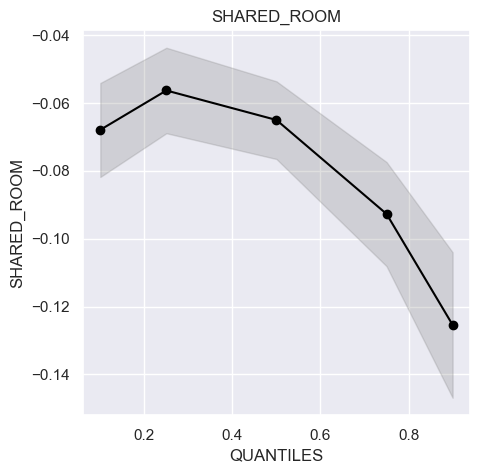

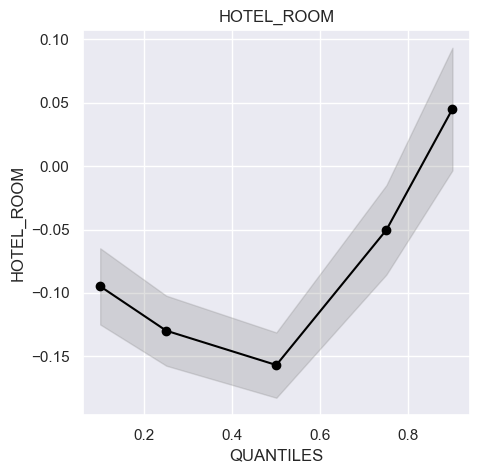

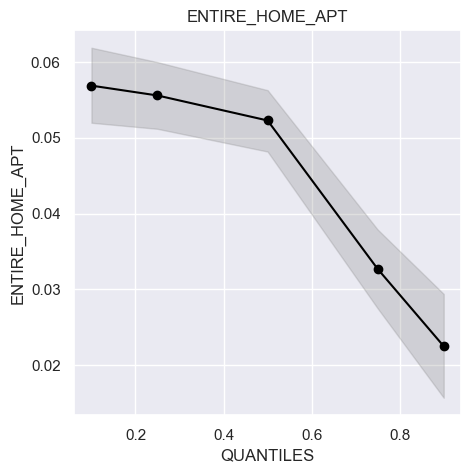

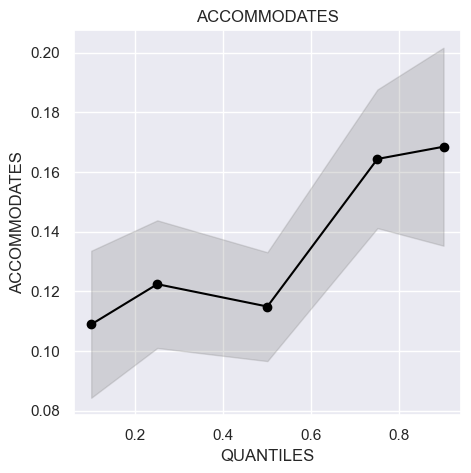

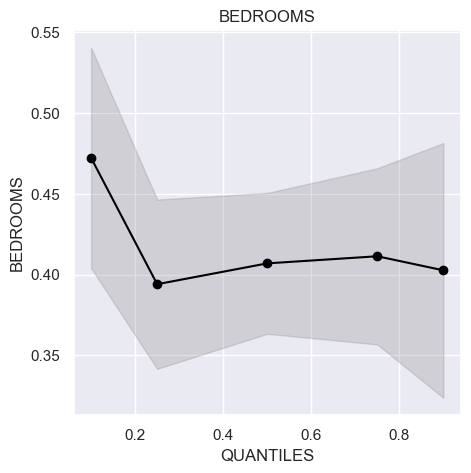

...

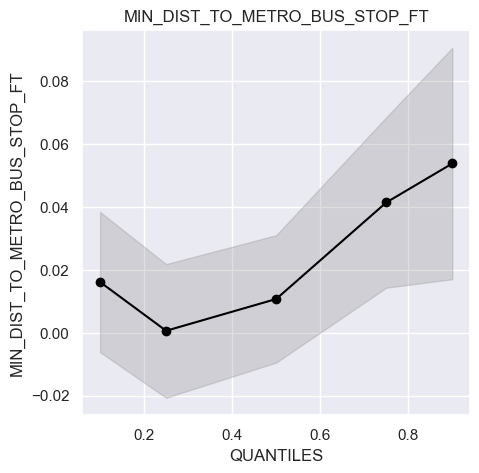

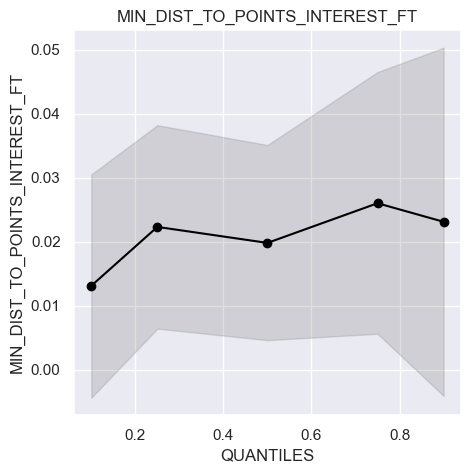

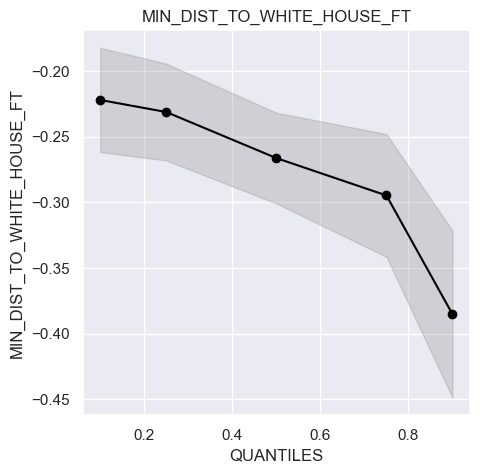

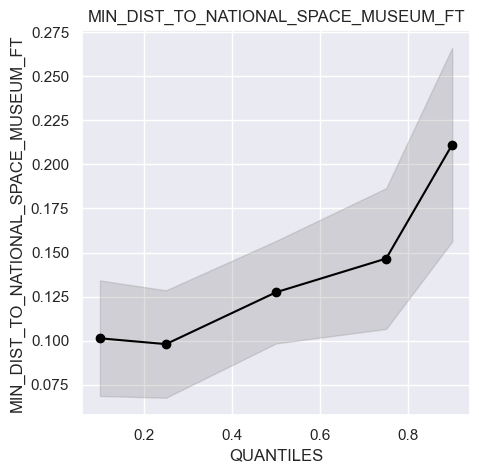

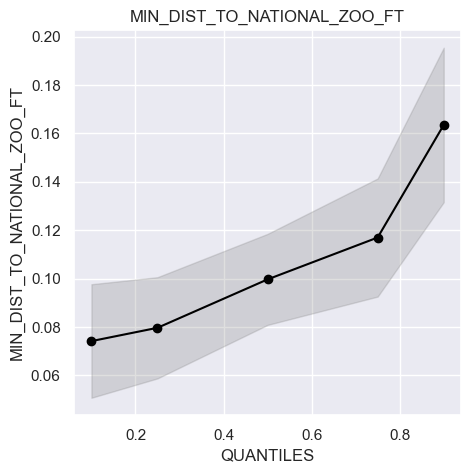

In [139]:
def graficar_resultado(p_caracteristica):
    NUEVO_DF = pd.DataFrame(columns=['q', 'intercept', 'coefb', 'lowerb', 'upperb'])
    NUEVO_DF.set_index("q", inplace=True)

    i = 1
    for q in quantiles:
        # QR
        NUEVO_DF.loc[q, ["quantile_"]] = q
        NUEVO_DF.loc[q, ["coefb"]] = RESULTADOS.loc[p_caracteristica, ["coeficiente_"+str(q)]].values[0]
        NUEVO_DF.loc[q, ["intercept"]] = RESULTADOS.loc[p_caracteristica, ["intercept_"+str(q)]].values[0]
        NUEVO_DF.loc[q, ["lowerb"]] = RESULTADOS.loc[p_caracteristica, ["lower_"+str(q)]].values[0]
        NUEVO_DF.loc[q, ["upperb"]] = RESULTADOS.loc[p_caracteristica, ["upper_"+str(q)]].values[0]

    NUEVO_DF = NUEVO_DF.reset_index(drop=True)
    NUEVO_DF["coefb"] = NUEVO_DF["coefb"].astype(float)
    NUEVO_DF["intercept"] = NUEVO_DF["intercept"].astype(float)
    NUEVO_DF["lowerb"] = NUEVO_DF["lowerb"].astype(float)
    NUEVO_DF["upperb"] = NUEVO_DF["upperb"].astype(float)

    fig, ax = plt.subplots(figsize=(5,5))
    ax.plot(NUEVO_DF.quantile_, NUEVO_DF.coefb, color="black", label="Quantile Reg.", marker='o')
    ax.plot(NUEVO_DF.quantile_, NUEVO_DF.upperb, linestyle="none", color="black")
    ax.plot(NUEVO_DF.quantile_, NUEVO_DF.lowerb, linestyle="none", color="black") #dotted
    ax.fill_between(NUEVO_DF.quantile_, NUEVO_DF.upperb, NUEVO_DF.lowerb, color="gray", alpha=0.25)

    plt.ylabel(p_caracteristica.upper())
    plt.xlabel("QUANTILES")
    plt.title(p_caracteristica.upper())
    plt.show()
    i=i+1

for caracteristica in tmp_caracteristicas:
    if caracteristica != 'log_price':
        graficar_resultado(caracteristica)

# **Análisis de los resultados de los modelos de regresión**

In [140]:
tmp = RESULTADOS.copy()
tmp.reset_index(drop=False, inplace=True)

# Statistical significance *** p < 0.001, ** p < 0.01, * p < 0.05
def significance_pvalues(v_pvalue):
    if v_pvalue > 0.05:
        return "" 
    elif v_pvalue < 0.001:
        return "***"
    elif v_pvalue < 0.01:
        return "**"
    elif v_pvalue <= 0.05:
        return "*"

def categorias(s):
    #if (s['caracteristica'] == 'log_price'):
    if (s['caracteristica'] == 'log_price'):
        return 'Variable dependiente'
    elif 'min_dist' in s['caracteristica']:
        return "Caracteristicas de ubicación" 
    elif 'host_' in s['caracteristica'] or 'host_has_' in s['caracteristica']:
        return "Caracteristicas del host"
    elif 'has_' in s['caracteristica']:
        return "Características de servicios adicionales"
    elif 'review' in s['caracteristica']:
        return "Características de calificaciones del huésped"
    else:
        return 'características del alojamiento'

def calcular_exponenciales(v_coeficiente):
    return (math.exp(v_coeficiente) - 1) * 100

# CALCULAR CATEGORIA Y SIGNIFICANCIAS
tmp["Categoria"] = tmp.apply(categorias, axis=1)
tmp["sig_ols"] = tmp.apply(lambda x: significance_pvalues(x["pvalue_OLS"]), axis=1)
tmp["sig_0.1"] = tmp.apply(lambda x: significance_pvalues(x["pvalue_0.1"]), axis=1)
tmp["sig_0.25"] = tmp.apply(lambda x: significance_pvalues(x["pvalue_0.25"]), axis=1)
tmp["sig_0.5"] = tmp.apply(lambda x: significance_pvalues(x["pvalue_0.5"]), axis=1)
tmp["sig_0.75"] = tmp.apply(lambda x: significance_pvalues(x["pvalue_0.75"]), axis=1)
tmp["sig_0.9"] = tmp.apply(lambda x: significance_pvalues(x["pvalue_0.9"]), axis=1)

# COEF, SIG, STD
tmp["OLS"] = tmp["coeficiente_OLS"].astype(str) + " " +  tmp["sig_ols"] + " (" + tmp["std_OLS"].astype(str) + ") "
tmp["Q 0.1"] = tmp["coeficiente_0.1"].astype(str) + " " +  tmp["sig_0.1"] + " (" + tmp["std_0.1"].astype(str) + ") "
tmp["Q 0.25"] = tmp["coeficiente_0.25"].astype(str) + " " +  tmp["sig_0.25"] + " (" + tmp["std_0.25"].astype(str) + ") "
tmp["Q 0.5"] = tmp["coeficiente_0.5"].astype(str) + " " +  tmp["sig_0.5"] + " (" + tmp["std_0.5"].astype(str) + ") "
tmp["Q 0.75"] = tmp["coeficiente_0.75"].astype(str) + " " +  tmp["sig_0.75"] + " (" + tmp["std_0.75"].astype(str) + ") "
tmp["Q 0.9"] = tmp["coeficiente_0.9"].astype(str) + " " +  tmp["sig_0.9"] + " (" + tmp["std_0.9"].astype(str) + ") "

# Calculamos los exponenciales para obtener el % de incremento o disminucion con respecto a la variable dependiente
# (exp(coeficiente) - 1) * 100
tmp["EXP OLS"] = tmp.apply(lambda x: calcular_exponenciales(x["coeficiente_OLS"]), axis=1)
tmp["EXP Q 0.1"] = tmp.apply(lambda x: calcular_exponenciales(x["coeficiente_0.1"]), axis=1)
tmp["EXP Q 0.25"] = tmp.apply(lambda x: calcular_exponenciales(x["coeficiente_0.25"]), axis=1)
tmp["EXP Q 0.5"] = tmp.apply(lambda x: calcular_exponenciales(x["coeficiente_0.5"]), axis=1)
tmp["EXP Q 0.75"] = tmp.apply(lambda x: calcular_exponenciales(x["coeficiente_0.75"]), axis=1)
tmp["EXP Q 0.9"] = tmp.apply(lambda x: calcular_exponenciales(x["coeficiente_0.9"]), axis=1)

Tabla resultado de los modelos (Coeficiente y entre paréntesis los errores)

In [141]:
pd.set_option('display.float_format', lambda x: '%.5f' % x)

#  Coeficiente (Error estándar)
tmp[["Categoria","caracteristica", "OLS",
      "Q 0.1","Q 0.25", 
     "Q 0.5", "Q 0.75", 
     "Q 0.9" ]].head(100).sort_values(by = 'Categoria', ascending=False)

,Categoria,caracteristica,OLS,Q 0.1,Q 0.25,Q 0.5,Q 0.75,Q 0.9
50,características del alojamiento,shared_room,-0.0828 *** (0.007),-0.0679 *** (0.007),-0.0563 *** (0.0064),-0.065 *** (0.0059),-0.0927 *** (0.0078),-0.1254 *** (0.0109)
45,características del alojamiento,beds,-0.0403 (0.0224),-0.1225 *** (0.0265),-0.0823 *** (0.0212),-0.0026 (0.0187),0.0063 (0.0245),0.0103 (0.0367)
41,características del alojamiento,availability_365,0.0158 *** (0.0025),0.0176 *** (0.0024),0.0163 *** (0.0022),0.0136 *** (0.0021),0.0112 *** (0.0028),0.0161 *** (0.004)
42,características del alojamiento,instant_bookable,0.0036 (0.0019),0.006 ** (0.0021),0.0095 *** (0.0018),0.0041 * (0.0016),0.0008 (0.002),-0.0018 (0.0027)
44,características del alojamiento,bathrooms_quantity,0.1972 *** (0.0244),0.1603 *** (0.0289),0.2123 *** (0.0238),0.2113 *** (0.0204),0.189 *** (0.0239),0.2937 *** (0.0307)
43,características del alojamiento,minimum_nights,-0.0665 ** (0.0246),-0.6802 *** (0.0133),-0.5366 *** (0.0155),-0.2556 *** (0.0206),-0.1294 *** (0.0372),0.0874 (0.056)
46,características del alojamiento,bedrooms,0.3861 *** (0.0266),0.4723 *** (0.0348),0.3941 *** (0.0267),0.407 *** (0.0222),0.4114 *** (0.0278),0.4027 *** (0.0402)
47,características del alojamiento,accommodates,0.1588 *** (0.0112),0.1089 *** (0.0126),0.1224 *** (0.0109),0.1149 *** (0.0093),0.1644 *** (0.0119),0.1685 *** (0.0169)
48,características del alojamiento,entire_home_apt,0.0402 *** (0.0025),0.0569 *** (0.0025),0.0556 *** (0.0022),0.0523 *** (0.0021),0.0327 *** (0.0026),0.0225 *** (0.0035)
49,características del alojamiento,hotel_room,-0.1075 *** (0.0157),-0.0948 *** (0.0153),-0.1298 *** (0.0141),-0.1569 *** (0.0131),-0.0503 ** (0.018),0.0451 (0.0246)


Exponenciales (porcentajes de incremento / disminución en el precio dependiendo del coeficiente)

In [142]:
tmp[[
      "Categoria",
      "caracteristica", "EXP OLS",
      "EXP Q 0.1","EXP Q 0.25", 
      "EXP Q 0.5", "EXP Q 0.75", 
      "EXP Q 0.9" 
]].head(100).sort_values(by = 'Categoria', ascending=False)


,Categoria,caracteristica,EXP OLS,EXP Q 0.1,EXP Q 0.25,EXP Q 0.5,EXP Q 0.75,EXP Q 0.9
50,características del alojamiento,shared_room,-7.94648,-6.56461,-5.47445,-6.29325,-8.85331,-11.78560
45,características del alojamiento,beds,-3.94988,-11.52941,-7.90044,-0.25966,0.63199,1.03532
41,características del alojamiento,availability_365,1.59255,1.77558,1.64336,1.36929,1.12630,1.62303
42,características del alojamiento,instant_bookable,0.36065,0.60180,0.95453,0.41084,0.08003,-0.17984
44,características del alojamiento,bathrooms_quantity,21.79876,17.38630,23.65188,23.52829,20.80410,34.13814
43,características del alojamiento,minimum_nights,-6.43371,-49.34843,-41.52670,-22.55483,-12.13776,9.13331
46,características del alojamiento,bedrooms,47.12318,60.36784,48.30488,50.23041,50.89288,49.58581
47,características del alojamiento,accommodates,17.21035,11.50508,13.02061,12.17613,17.86857,18.35282
48,características del alojamiento,entire_home_apt,4.10190,5.85500,5.71747,5.36918,3.32405,2.27550
49,características del alojamiento,hotel_room,-10.19235,-9.04452,-12.17289,-14.52105,-4.90559,4.61325


P VALORES

In [143]:
#tmp[["Categoria","caracteristica","intercept_0.1","intercept_0.25","intercept_0.5","intercept_0.75","intercept_0.9", "coeficiente_0.1", "coeficiente_0.25","coeficiente_0.5","coeficiente_0.75","coeficiente_0.9","pvalue_OLS", "pvalue_0.1", "pvalue_0.25", "pvalue_0.5", "pvalue_0.75", "pvalue_0.9"]].head(100).sort_values(by = 'Categoria', ascending=False)#.to_csv("test.csv")
#tmp[["Categoria","caracteristica",  "coeficiente_OLS", "coeficiente_0.1", "coeficiente_0.25","coeficiente_0.5","coeficiente_0.75","coeficiente_0.9","pvalue_OLS", "pvalue_0.1", "pvalue_0.25", "pvalue_0.5", "pvalue_0.75", "pvalue_0.9"]].head(100).sort_values(by = 'Categoria', ascending=False)#.to_csv("test2.csv")

tmp[["Categoria","caracteristica", "pvalue_OLS", "pvalue_0.1", "pvalue_0.25", "pvalue_0.5", "pvalue_0.75", "pvalue_0.9"]].head(100).sort_values(by = 'Categoria', ascending=False)#.to_csv("test2.csv")

,Categoria,caracteristica,pvalue_OLS,pvalue_0.1,pvalue_0.25,pvalue_0.5,pvalue_0.75,pvalue_0.9
50,características del alojamiento,shared_room,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000
45,características del alojamiento,beds,0.07140,0.00000,0.00010,0.88790,0.79670,0.77910
41,características del alojamiento,availability_365,0.00000,0.00000,0.00000,0.00000,0.00010,0.00010
42,características del alojamiento,instant_bookable,0.05650,0.00420,0.00000,0.01050,0.69170,0.51090
44,características del alojamiento,bathrooms_quantity,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000
43,características del alojamiento,minimum_nights,0.00700,0.00000,0.00000,0.00000,0.00050,0.11870
46,características del alojamiento,bedrooms,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000
47,características del alojamiento,accommodates,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000
48,características del alojamiento,entire_home_apt,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000
49,características del alojamiento,hotel_room,0.00000,0.00000,0.00000,0.00000,0.00520,0.06760
